<a href="https://colab.research.google.com/github/SLKS99/POLARIS-workflow-stage-1/blob/main/POLARIS_complete_workflow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# This notebook shows how to extract information from QM9 dataset, particularly from each molecule (given originally in .xyz format) followed by computing features using rdkit and then combine those into a dataframe.



### Notebook prepared by Sheryl Sanchez & Jordan Marshall

### Email: ssanch18@vols.utk.edu and jmarsh39@vols.utk.edu

*    Analysis performed by [Jordan Marshall](https://github.com/Jordanmarshall-utk) and [Sheryl L. Sanchez](https://scholar.google.com/citations?hl=en&user=zFRKT-MAAAAJ)



### Link to orginal dataset:

http://quantum-machine.org/datasets/

### Link where we can find the functionalities represented by variables in the 'parser' code. For example 'mu' represents the dipole moment.

https://pytorch-geometric.readthedocs.io/en/latest/generated/torch_geometric.datasets.QM9.html



Install rdkit

In [9]:
!pip install rdkit

In [10]:

!pip install openai PyMuPDF pandas openpyxl python-dotenv
!pip install rapidfuzz
!pip install ftfy
!pip install docx
!pip install python-docx
!pip install fuzzywuzzy

Import packages

In [11]:
import numpy as np
import pandas as pd

import glob


import rdkit
from rdkit import Chem
from rdkit.Chem import Descriptors
from rdkit.Chem import rdMolDescriptors

import torch
from math import log
import matplotlib.pyplot as plt

import os
import json
import glob
import math
import re
import urllib.parse
import urllib.request
import urllib.error
import warnings

import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt

import networkx as nx
import pandas as pd
import torch
import networkx as nx
from rdkit import Chem
from rdkit.Chem import AllChem, rdmolops, Descriptors, rdMolDescriptors
from rdkit.Chem.Lipinski import NumRotatableBonds



import fitz  # PyMuPDF

import openai
from datetime import datetime
from difflib import SequenceMatcher
import zipfile
from pathlib import Path
import pandas as pd

import unicodedata
import re
from docx import Document
from difflib import SequenceMatcher
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns

Mount Google Drive

In [12]:
'''
from google.colab import drive
drive.mount('/content/drive')
'''

"\nfrom google.colab import drive\ndrive.mount('/content/drive')\n"

### Here we parse through the QM9 molecules to extract those with amine groups and our database of perovskite organic spacers

### Let's download the data

In [13]:
!gdown https://drive.google.com/uc?id=1SWOsmVbMBa7PP4zyIAlKC72201bGoOIQ

Downloading...
From (original): https://drive.google.com/uc?id=1SWOsmVbMBa7PP4zyIAlKC72201bGoOIQ
From (redirected): https://drive.google.com/uc?id=1SWOsmVbMBa7PP4zyIAlKC72201bGoOIQ&confirm=t&uuid=7d9ae258-286a-4656-a805-cb42066496ee
To: /content/LLM Benchmarking-20250606T181715Z-1-001.zip
100% 93.0M/93.0M [00:04<00:00, 19.9MB/s]


In [14]:
!gdown https://drive.google.com/uc?id=16w_z891Y0PfcdVvNQKgYpT1iojROfPu-

Downloading...
From: https://drive.google.com/uc?id=16w_z891Y0PfcdVvNQKgYpT1iojROfPu-
To: /content/perov_trimmed.csv
100% 14.7k/14.7k [00:00<00:00, 25.8MB/s]


In [15]:
!gdown https://drive.google.com/uc?id=1ekbEJnMw0XC_3LInz7BrUS2BO1tcxq0_

Downloading...
From (original): https://drive.google.com/uc?id=1ekbEJnMw0XC_3LInz7BrUS2BO1tcxq0_
From (redirected): https://drive.google.com/uc?id=1ekbEJnMw0XC_3LInz7BrUS2BO1tcxq0_&confirm=t&uuid=9d449e50-a654-40f0-99d5-4057de010fab
To: /content/dsgdb9nsd.xyz.tar.bz2
100% 86.1M/86.1M [00:01<00:00, 53.0MB/s]


## Paper benchmarking

In [16]:

zip_path = Path("/content") / "LLM Benchmarking-20250606T181715Z-1-001.zip"


output_dir = zip_path.with_suffix("")
output_dir.mkdir(parents=True, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(output_dir)

print(f" Extracted: {zip_path.name} → {output_dir}")


 Extracted: LLM Benchmarking-20250606T181715Z-1-001.zip → /content/LLM Benchmarking-20250606T181715Z-1-001


In [17]:
def aggregate_ground_truth_for_benchmark(file_path):
    import pandas as pd
    from pathlib import Path


    df = pd.read_excel(file_path)
    df.columns = df.columns.str.strip()
    for col in ["Field", "Model", "Ground Truth", "Perovskite ID"]:
        df[col] = df[col].astype(str).str.strip()


    first_model = df["Model"].unique()[0]
    df = df[df["Model"] == first_model].copy()


    df["Field"] = df["Field"].replace({
        "Synthesis Method": "Method",
        "Synthesis Temperature": "Method",
        "Solvent": "Method"
    })


    field_to_prompt = {
        "Perovskite": "List all perovskite compounds mentioned in the Experimental or Results sections.",
        "Material Used": "For each perovskite, list all materials used in its synthesis and their IUPAC names.",
        "Method": "List the synthesis temperature, method, and solvent used for each perovskite."
    }

    # Group ground truth values for each field and run
    df_grouped = (
        df.groupby(["Run", "Field"], as_index=False)
        .agg({
            "Ground Truth": lambda x: sorted(set(x)),
            "Model": "first"
        })
    )

    df_grouped["Prompt"] = df_grouped["Field"].map(field_to_prompt)

    # Add perovskite list to each run if not already there
    perovskite_ids = sorted(df["Perovskite ID"].unique())
    runs_missing_perovskite = sorted(set(df["Run"].unique()) - set(df_grouped[df_grouped["Field"] == "Perovskite"]["Run"]))

    df_perovskite = pd.DataFrame({
        "Run": runs_missing_perovskite,
        "Field": "Perovskite",
        "Ground Truth": [perovskite_ids] * len(runs_missing_perovskite),
        "Model": first_model,
        "Prompt": field_to_prompt["Perovskite"]
    })


    df_final = pd.concat([df_grouped, df_perovskite], ignore_index=True)


    output_path = Path(file_path).with_name(Path(file_path).stem + "_AGGREGATED.xlsx")
    df_final.to_excel(output_path, index=False)
    print(f" Aggregated file saved to: {output_path}")

    return df_final


In [18]:


# Synonyms mapping for key terms (expand as needed)

SYNONYM_DICT = {
    # Perovskite formula variants
    "f-pea1-xgax2ma3pb4i13": ["(f-pea1-xgax)2ma3pb4i13", "(F-PEA1-xGAx)2MA3Pb4I13"],
    "pea2pbi4": ["pea2pbi4", "PEA2PbI4", "PEA₂PbI₄"],
    "pea2sni4": ["pea2sni4", "PEA2SnI4", "PEA₂SnI₄"],
    "xdama3pb4i13": ["(xda)(ma)3(pb)4(i)13", "(XDA)(MA)3(Pb)4(I)13"],
    "xdama2pb3i10": ["(xda)(ma)2(pb)3(i)10", "(XDA)(MA)₂Pb₃I₁₀", "(XDA)(MA)2Pb3I10"],
    "xda2mapb2i7": ["(xda)2(ma)pb2i7", "(XDA)2(MA)Pb2I7"],
    "xdapbi4": ["(xda)(pb)i4", "(XDA)PbI4", "(XDA)PbI₄"],

    # Newly added ground-truth perovskites
    "czc32pbi4": ["(cz-c3)2pbi4", "(Cz-C3)2PbI4"],
    "czc42pbi4": ["(cz-c4)2pbi4", "(Cz-C4)2PbI4"],
    "czc52pbi4": ["(cz-c5)2pbi4", "(Cz-C5)2PbI4"],
    "cs0.25fa0.75pb(i0.85br0.15)3": ["Cs0.25FA0.75Pb(I0.85Br0.15)3", "Cs0.25Fa0.75Pb(I0.85Br0.15)3", "cs0.25fa0.75pb(i0.85br0.15)3"],
    "cspbbr3": ["CsPbBr3", "cspbbr3", "CSPbBr3"],
    "fapbbr3": ["FAPbBr3", "fapbbr3", "FAPbBr₃"],
    "ba2ma4pb5i16": ["(ba)2(ma)4pb5i16", "BA2MA4Pb5I16"],

    # Organic spacer cations
    "4-fluorophenethylammonium": ["4-fluorophenethylammonium", "f-pea"],
    "guanidinium": ["guanidinium"],
    "phenethylammonium": ["phenethylammonium", "pea"],
    "methylammonium": ["methylammonium", "ma"],

    # Reagents and additives
    "9h-carbazole": ["9h-carbazole", "carbazole"],
    "lead iodide": ["pbi2", "lead iodide", "lead(II) iodide", "leadiodide", "PbI2"],
    "lead bromide": ["pbbr2", "lead bromide", "lead(II) bromide", "pb bromide"],
    "phenethylamine": ["phenethylamine", "phenethyl amine"],
    "hydroiodic acid": ["hydroiodic acid", "hi"],
    "ammonium thiocyanate": ["nh4scn"],
    "ammonium chloride": ["nh4cl"],
    "cesium carbonate": ["cs2co3"],
    "cesium iodide": ["csi", "cesium iodide", "CsI", "CSI"],
    "cesium bromide": ["csbr", "cesium bromide"],
    "formamidinium bromide": ["fabr", "formamidinium bromide"],
    "formamidinium iodide": ["fai", "formamidinium iodide"],
    "butylammonium iodide": ["bai", "BAI"],

    # Temperature phrasing
    "100 c": ["100c", "100°c", "100 °c", "100 degrees c", "100 degrees celcius", "100", "100C"],
    "110 c": ["110c", "110°c", "110 °c", "110 degrees c", "110 degrees celcius", "110"],
    "130 c": ["130c", "130°c", "130 °c", "130 degrees c", "130 degrees celcius", "130"],

    # Solvents and processing
    "dmf": ["dmf", "DMF", "dimethylformamide", "n,n-dimethylformamide"],
    "dmso": ["dmso", "dimethyl sulfoxide", "dms"],
    "dmf:dmso": ["dmf:dmso", "dmf/dmso", "dmf+dmso", "dmf:dmso (4:1)", "dmf/dmso (4:1)", "dmf:dmso 4:1", "dmf:dmso (5:5)", "dmf/dmso (5:5)"],
    "1-octadecene": ["1-octadecene", "ode"],
    "chlorobenzene": ["chlorobenzene", "cbz"],
    "spin coating": ["spin-coated", "spin coated", "spin-coating", "Spin coating"],
    "room temperature": ["room-temp", "ambient temperature", "ambient conditions", "no heating", "room-temperature"],
    "ligand-assisted reprecipitation": ["ligand-assisted reprecipitation", "larp", "colloidal reprecipitation", "room-temperature colloidal reprecipitation"],

    # Halides and metal salts
    "tin iodide": ["sni2", "tin iodide", "tin(ii) iodide", "sn iodide"],
    "phenethylammonium iodide": ["peai", "phenethylammonium iodide", "phenylethylammonium iodide"],
    "methylammonium iodide": ["mai", "methylammonium iodide", "methyl ammonium iodide", "MAI"],
    "p-xylylene diamine": ["xda", "p-xylylene diamine"],
    "tin bromide": ["snbr2", "tin bromide"],

    # Additional chemicals
    "4-fluorophenethylammonium iodide": ["f-peai"],
    "4-methoxyphenethylammonium iodide": ["meo-peai", "methoxyphenethylammonium iodide"],
    "rubidium bromide": ["rbbr", "rubidium bromide"],
    "nitrogen glovebox": ["n2 glovebox", "nitrogen atmosphere glovebox"],
    "quasi-2d perovskite": ["quasi-2d perovskite", "quasi two-dimensional perovskite"],
    "single crystal": ["single crystal"]
}



def normalize_text(text):
    t = unicodedata.normalize("NFKD", text)
    t = re.sub(r"[\u2080-\u209F]", "", t)
    return re.sub(r"\s+", " ", t).strip().lower()


def expand_synonyms(text):
    txt = text.lower()
    for key, variants in SYNONYM_DICT.items():
        for variant in variants:
            txt = txt.replace(variant, key)
    return txt


def evaluate_model_responses(
    chat_docx_path,
    benchmark_path,
    model_name="ChatGPT",
    model_response_marker="ChatGPT said:",
    output_suffix="_EVAL"
):

    if benchmark_path.lower().endswith('.csv'):
        df_agg = pd.read_csv(benchmark_path)
    else:
        df_agg = pd.read_excel(benchmark_path)
    df_agg.columns = df_agg.columns.str.strip()


    gt_col = next((c for c in df_agg.columns if c.lower().replace(' ', '') == 'groundtruth'), None)
    if gt_col is None:
        raise KeyError("No 'Ground Truth' column found in benchmark file")
    df_agg.rename(columns={gt_col: 'Ground Truth'}, inplace=True)


    df_agg['Prompt'] = df_agg['Prompt'].astype(str).str.strip()
    if 'Perovskite ID' not in df_agg.columns and 'Field' in df_agg.columns:
        df_agg.rename(columns={'Field': 'Perovskite ID'}, inplace=True)


    doc = Document(chat_docx_path)
    lines = [p.text.strip() for p in doc.paragraphs if p.text.strip()]
    responses = []
    i = 0
    while i < len(lines):
        if lines[i].startswith("You said:") and i+1 < len(lines):
            prompt = lines[i+1].strip()
            i += 2
            resp_lines = []
            while i < len(lines) and not lines[i].startswith("You said:"):
                if model_response_marker and lines[i].startswith(model_response_marker):
                    i += 1
                    continue
                resp_lines.append(lines[i])
                i += 1
            responses.append((prompt, "\n".join(resp_lines)))
        else:
            i += 1


    parsed = []
    for idx, (prompt, raw) in enumerate(responses):
        run = idx // 3 + 1
        clean = normalize_text(raw)
        parsed.append({
            'Run': run,
            'Prompt': prompt,
            'Cleaned Response': clean,
            'Model': model_name,
            'Char Count': len(clean),
            'Word Count': len(clean.split()),
            'Line Count': clean.count("\n") + 1
        })
    df_parsed = pd.DataFrame(parsed)


    def find_best(p, run):
        sub = df_agg[df_agg['Run']==run].copy()
        if sub.empty:
            raise ValueError(f"No GT for Run {run}")
        sub['sim'] = sub['Prompt'].apply(lambda gt: SequenceMatcher(None, p, gt).ratio())
        return sub.sort_values('sim', ascending=False).iloc[0]

    merged = []
    for _, r in df_parsed.iterrows():
        gt_row = find_best(r['Prompt'], r['Run'])
        merged.append({**gt_row.to_dict(), **r.to_dict()})
    df = pd.DataFrame(merged)

    # Prepare GT lists
    def to_list(x):
        if isinstance(x, str) and x.strip().startswith('['):
            try:
                return eval(x)
            except:
                return [x]
        if isinstance(x, (list, tuple)):
            return list(x)
        return [x]

    df['GT List'] = df['Ground Truth'].apply(to_list)
    df['Prompt_GT'] = df['Prompt']
    df['Step'] = df['Run']


    gt_texts = [' '.join(map(str, lst)).lower() for lst in df['GT List']]
    resp_texts = df['Cleaned Response'].tolist()
    vect = TfidfVectorizer().fit(gt_texts + resp_texts)
    gt_mat = vect.transform(gt_texts)
    resp_mat = vect.transform(resp_texts)
    cos_mat = cosine_similarity(gt_mat, resp_mat)


    metrics = []
    for i, row in df.iterrows():
        resp_norm = expand_synonyms(row['Cleaned Response'])
        gt_list = row['GT List']
        total = len(gt_list)

        hits = sum(
            1 for ph in gt_list
            if expand_synonyms(str(ph)).lower() in resp_norm
        )
        recall_ph = hits / total * 100 if total else 0
        misses = total - hits
        # Token-level
        gt_tokens = set(normalize_text(' '.join(map(str, gt_list))).split())
        resp_tokens = set(resp_norm.split())
        tp = len(gt_tokens & resp_tokens)
        prec = tp / len(resp_tokens) * 100 if resp_tokens else 0
        rec_tok = tp / len(gt_tokens) * 100 if gt_tokens else 0
        f1 = 2 * prec * rec_tok / (prec + rec_tok) if (prec + rec_tok) else 0
        # Cosine & verbosity
        cos_score = cos_mat[i, i] * 100
        verb_ratio = len(resp_tokens) / total if total else np.nan
        metrics.append((
            total, hits, misses, round(recall_ph, 2),
            round(prec, 2), round(rec_tok, 2), round(f1, 2),
            round(cos_score, 2), round(verb_ratio, 2)
        ))

    cols = [
        'GT Phrases Total', 'GT Phrase Matches', 'GT Phrase Misses', 'GT Phrase Recall (%)',
        'GT Token Precision (%)', 'GT Token Recall (Set) (%)', 'GT Token F1 Score (%)',
        'Cosine Similarity (%)', 'Verbosity Ratio'
    ]
    df_metrics = pd.DataFrame(metrics, columns=cols)
    df_res = pd.concat([df.reset_index(drop=True), df_metrics], axis=1)
    df_res['Rank (by F1 Score)'] = df_res.groupby('Run')['GT Token F1 Score (%)'].rank(ascending=False).astype(int)
    for c in ['Human Score', 'Human Comments', 'Possible Hallucination?']:
        df_res[c] = None


    out_cols = [
        'Prompt', 'Prompt_GT', 'Run', 'Model', 'Ground Truth',
        'Cleaned Response', 'Char Count', 'Word Count', 'Line Count',
        'Perovskite ID', 'Step', *cols, 'Rank (by F1 Score)',
        'Human Score', 'Human Comments', 'Possible Hallucination?'
    ]
    df_out = df_res[[c for c in out_cols if c in df_res.columns]]


    out_path = benchmark_path.replace('.xlsx', f'{output_suffix}_{model_name}.xlsx')
    if benchmark_path.lower().endswith('.csv'):
        out_path = benchmark_path.replace('.csv', f'{output_suffix}_{model_name}.csv')
        df_out.to_csv(out_path, index=False)
    else:
        df_out.to_excel(out_path, index=False)

    print(f" Saved: {out_path}")
    return df_out




## Paper 1

In [20]:
aggregate_ground_truth_for_benchmark("/content/LLM Benchmarking/LLM Benchmarking/paper 1/Paper1_Benchmarking_with_Run3.xlsx")

 Aggregated file saved to: /content/LLM Benchmarking/LLM Benchmarking/paper 1/Paper1_Benchmarking_with_Run3_AGGREGATED.xlsx


,Run,Field,Ground Truth,Model,Prompt
0,1.0,Material Used,"[4-Fluorophenethylammonium, 4-Methoxyphenethyl...",ChatGPT4o,"For each perovskite, list all materials used i..."
1,1.0,Method,"[100 C, DMF, Spin-coated]",ChatGPT4o,"List the synthesis temperature, method, and so..."
2,1.0,Perovskite,"[(F-PEA)2(MA)2Pb5I16, (F-PEA)2PbI4, (MeO-PEA)2...",ChatGPT4o,List all perovskite compounds mentioned in the...
3,2.0,Material Used,"[4-Fluorophenethylammonium, 4-Methoxyphenethyl...",ChatGPT4o,"For each perovskite, list all materials used i..."
4,2.0,Method,"[100 C, DMF, Spin-coated]",ChatGPT4o,"List the synthesis temperature, method, and so..."
5,2.0,Perovskite,"[(F-PEA)2(MA)2Pb5I16, (F-PEA)2PbI4, (MeO-PEA)2...",ChatGPT4o,List all perovskite compounds mentioned in the...
6,3.0,Material Used,"[4-Fluorophenethylammonium, 4-Methoxyphenethyl...",ChatGPT4o,"For each perovskite, list all materials used i..."
7,3.0,Method,"[100 C, DMF, Spin-coated]",ChatGPT4o,"List the synthesis temperature, method, and so..."
8,3.0,Perovskite,"[(F-PEA)2(MA)2Pb5I16, (F-PEA)2PbI4, (MeO-PEA)2...",ChatGPT4o,List all perovskite compounds mentioned in the...


In [21]:
p1_elicit= evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 1/Paper 1 Elicit Chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 1/Paper1_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Elicit",
    model_response_marker="Elicit said:",
    output_suffix="_EVAL"
)



 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 1/Paper1_Benchmarking_with_Run3_AGGREGATED_EVAL_Elicit.xlsx


In [22]:
p1_chatgpt = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 1/paper 1 chatgpt chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 1/Paper1_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="ChatGPT",
    model_response_marker="ChatGPT said:",
    output_suffix="_EVAL"
)



 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 1/Paper1_Benchmarking_with_Run3_AGGREGATED_EVAL_ChatGPT.xlsx


In [23]:

p1_NotebookLM = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 1/paper 1 Notebook LLM  chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 1/Paper1_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Notebook LM ",
    model_response_marker="Notebook LLM said:",
    output_suffix="_EVAL"
)
p1_NotebookLM


 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 1/Paper1_Benchmarking_with_Run3_AGGREGATED_EVAL_Notebook LM .xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Notebook LM,"['(F-PEA)2(MA)2Pb5I16', '(F-PEA)2PbI4', '(MeO-...","based on the provided sources, the perovskite ...",1972,277,1,Perovskite,...,0.00,0.00,0.00,0.00,7.38,18.38,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Notebook LM,"['4-Fluorophenethylammonium', '4-Methoxyphenet...",based on the experimental and results sections...,3859,532,1,Material Used,...,83.33,2.37,66.67,4.57,19.50,28.17,2,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Notebook LM,"['100 C', 'DMF', 'Spin-coated']",based on the sources and our conversation hist...,963,141,1,Method,...,100.00,2.41,50.00,4.60,13.26,27.67,1,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Notebook LM,"['(F-PEA)2(MA)2Pb5I16', '(F-PEA)2PbI4', '(MeO-...",based on the experimental and results sections...,2045,291,1,Perovskite,...,0.00,0.00,0.00,0.00,8.50,18.75,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Notebook LM,"['4-Fluorophenethylammonium', '4-Methoxyphenet...",based on the information in the sources and ou...,4289,592,1,Material Used,...,83.33,1.98,66.67,3.85,18.72,33.67,2,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Notebook LM,"['100 C', 'DMF', 'Spin-coated']",based on the information provided in the sourc...,959,136,1,Method,...,100.00,2.41,50.00,4.60,10.75,27.67,1,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Notebook LM,"['(F-PEA)2(MA)2Pb5I16', '(F-PEA)2PbI4', '(MeO-...",based on the experimental and results sections...,2164,290,1,Perovskite,...,25.00,0.00,0.00,0.00,7.90,19.00,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Notebook LM,"['4-Fluorophenethylammonium', '4-Methoxyphenet...",based on the information in the sources and ou...,3283,457,1,Material Used,...,83.33,2.88,66.67,5.52,21.45,23.17,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Notebook LM,"['100 C', 'DMF', 'Spin-coated']",based on the experimental and results sections...,1022,144,1,Method,...,100.00,2.06,50.00,3.96,11.02,32.33,2,None,None,None


In [24]:

p1_DeepSeek = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 1/paper 1 DeepSeek chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 1/Paper1_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="DeepSeek ",
    model_response_marker="DeepSeek said:",
    output_suffix="_EVAL"
)

p1_DeepSeek

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 1/Paper1_Benchmarking_with_Run3_AGGREGATED_EVAL_DeepSeek .xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,DeepSeek,"['(F-PEA)2(MA)2Pb5I16', '(F-PEA)2PbI4', '(MeO-...",here are the perovskite compounds mentioned in...,681,82,1,Perovskite,...,0.00,0.00,0.00,0.00,22.68,7.00,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,DeepSeek,"['4-Fluorophenethylammonium', '4-Methoxyphenet...",here is a detailed breakdown of the perovskite...,2215,288,1,Material Used,...,83.33,1.35,33.33,2.60,22.92,24.67,2,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,DeepSeek,"['100 C', 'DMF', 'Spin-coated']",here is a detailed breakdown of the synthesis ...,2239,319,1,Method,...,100.00,1.78,75.00,3.47,24.48,56.33,1,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,DeepSeek,"['(F-PEA)2(MA)2Pb5I16', '(F-PEA)2PbI4', '(MeO-...",here is a comprehensive list of all the perovs...,1843,217,1,Perovskite,...,50.00,0.00,0.00,0.00,28.14,18.38,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,DeepSeek,"['4-Fluorophenethylammonium', '4-Methoxyphenet...",here's a detailed breakdown of all perovskite ...,2084,254,1,Material Used,...,83.33,3.01,66.67,5.76,18.64,22.17,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,DeepSeek,"['100 C', 'DMF', 'Spin-coated']","here's a clear, consistent summary of the synt...",1201,167,1,Method,...,100.00,2.42,75.00,4.69,8.36,41.33,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,DeepSeek,"['(F-PEA)2(MA)2Pb5I16', '(F-PEA)2PbI4', '(MeO-...",here is a complete list of all perovskite comp...,1427,173,1,Perovskite,...,50.00,0.00,0.00,0.00,33.18,17.00,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,DeepSeek,"['4-Fluorophenethylammonium', '4-Methoxyphenet...",here's a comprehensive breakdown of all perovs...,2536,291,1,Material Used,...,83.33,1.99,66.67,3.86,33.61,33.50,2,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,DeepSeek,"['100 C', 'DMF', 'Spin-coated']","here is a clear, structured summary of the syn...",1301,177,1,Method,...,100.00,2.10,75.00,4.08,7.86,47.67,1,None,None,None


In [25]:

p1_PublicationAnalyzer = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 1/paper 1 Publication Analyzer chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 1/Paper1_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Publication Analyzer",
    model_response_marker="Publication Analyzer said:",
    output_suffix="_EVAL"
)

p1_PublicationAnalyzer

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 1/Paper1_Benchmarking_with_Run3_AGGREGATED_EVAL_Publication Analyzer.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Publication Analyzer,"['(F-PEA)2(MA)2Pb5I16', '(F-PEA)2PbI4', '(MeO-...",the perovskite compounds mentioned in the expe...,1184,145,1,Perovskite,...,0.00,0.00,0.00,0.00,29.43,11.62,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Publication Analyzer,"['4-Fluorophenethylammonium', '4-Methoxyphenet...",here's a breakdown of the materials used in th...,1269,150,1,Material Used,...,83.33,4.55,66.67,8.51,36.05,14.67,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Publication Analyzer,"['100 C', 'DMF', 'Spin-coated']",here's the synthesis information for each pero...,938,115,1,Method,...,100.00,3.08,50.00,5.80,25.35,21.67,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Publication Analyzer,"['(F-PEA)2(MA)2Pb5I16', '(F-PEA)2PbI4', '(MeO-...",the experimental and results sections of the p...,1467,133,1,Perovskite,...,25.00,0.00,0.00,0.00,30.03,13.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Publication Analyzer,"['4-Fluorophenethylammonium', '4-Methoxyphenet...",here's a detailed list of all materials used i...,1320,148,1,Material Used,...,83.33,4.65,66.67,8.70,41.41,14.33,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Publication Analyzer,"['100 C', 'DMF', 'Spin-coated']","here's a summary of the synthesis temperature,...",1079,146,1,Method,...,100.00,2.30,50.00,4.40,24.77,29.00,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Publication Analyzer,"['(F-PEA)2(MA)2Pb5I16', '(F-PEA)2PbI4', '(MeO-...",here is a complete list of perovskite compound...,1492,130,1,Perovskite,...,25.00,0.00,0.00,0.00,27.96,12.62,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Publication Analyzer,"['4-Fluorophenethylammonium', '4-Methoxyphenet...",here is a detailed list of all materials used ...,1560,150,1,Material Used,...,83.33,3.41,50.00,6.38,33.68,14.67,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Publication Analyzer,"['100 C', 'DMF', 'Spin-coated']",here is the synthesis information for each of ...,1214,124,1,Method,...,100.00,2.82,50.00,5.33,20.45,23.67,2,None,None,None


In [26]:

p1_Perplexity = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 1/paper 1 perpelexity chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 1/Paper1_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Perplexity",
    model_response_marker="Perplexity said:",
    output_suffix="_EVAL"
)

p1_Perplexity

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 1/Paper1_Benchmarking_with_Run3_AGGREGATED_EVAL_Perplexity.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Perplexity,"['(F-PEA)2(MA)2Pb5I16', '(F-PEA)2PbI4', '(MeO-...",based on the experimental and results sections...,1492,200,1,Perovskite,...,25.00,0.00,0.0,0.00,20.00,17.25,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Perplexity,"['4-Fluorophenethylammonium', '4-Methoxyphenet...",certainly! below is a detailed list of all mat...,2347,285,1,Material Used,...,83.33,2.56,50.0,4.88,17.58,19.50,2,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Perplexity,"['100 C', 'DMF', 'Spin-coated']",here is a summary for each perovskite compound...,1654,237,1,Method,...,100.00,2.59,75.0,5.00,25.38,38.67,1,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Perplexity,"['(F-PEA)2(MA)2Pb5I16', '(F-PEA)2PbI4', '(MeO-...",based on the experimental and results sections...,1276,181,1,Perovskite,...,25.00,0.00,0.0,0.00,29.34,15.25,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Perplexity,"['4-Fluorophenethylammonium', '4-Methoxyphenet...",here is a detailed list of all materials used ...,2310,256,1,Material Used,...,83.33,3.03,50.0,5.71,21.84,16.50,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Perplexity,"['100 C', 'DMF', 'Spin-coated']",based on the experimental and results sections...,1581,212,1,Method,...,100.00,1.83,50.0,3.54,15.56,36.33,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Perplexity,"['(F-PEA)2(MA)2Pb5I16', '(F-PEA)2PbI4', '(MeO-...",based on the experimental and results sections...,997,142,1,Perovskite,...,25.00,0.00,0.0,0.00,32.25,10.12,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Perplexity,"['4-Fluorophenethylammonium', '4-Methoxyphenet...",based on the experimental and results sections...,2416,270,1,Material Used,...,83.33,2.68,50.0,5.08,21.47,18.67,2,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Perplexity,"['100 C', 'DMF', 'Spin-coated']","here is a concise, evidence-based summary of t...",1690,229,1,Method,...,100.00,3.26,75.0,6.25,20.59,30.67,1,None,None,None


In [27]:


p1_all = pd.concat([p1_DeepSeek, p1_PublicationAnalyzer,
p1_Perplexity,p1_NotebookLM,p1_chatgpt,p1_elicit], ignore_index=True)


p1_all.to_excel("paper1_combined_models_eval.xlsx", index=False)




In [28]:
p1_all

,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,DeepSeek,"['(F-PEA)2(MA)2Pb5I16', '(F-PEA)2PbI4', '(MeO-...",here are the perovskite compounds mentioned in...,681,82,1,Perovskite,...,0.00,0.00,0.00,0.00,22.68,7.00,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,DeepSeek,"['4-Fluorophenethylammonium', '4-Methoxyphenet...",here is a detailed breakdown of the perovskite...,2215,288,1,Material Used,...,83.33,1.35,33.33,2.60,22.92,24.67,2,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,DeepSeek,"['100 C', 'DMF', 'Spin-coated']",here is a detailed breakdown of the synthesis ...,2239,319,1,Method,...,100.00,1.78,75.00,3.47,24.48,56.33,1,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,DeepSeek,"['(F-PEA)2(MA)2Pb5I16', '(F-PEA)2PbI4', '(MeO-...",here is a comprehensive list of all the perovs...,1843,217,1,Perovskite,...,50.00,0.00,0.00,0.00,28.14,18.38,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,DeepSeek,"['4-Fluorophenethylammonium', '4-Methoxyphenet...",here's a detailed breakdown of all perovskite ...,2084,254,1,Material Used,...,83.33,3.01,66.67,5.76,18.64,22.17,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,DeepSeek,"['100 C', 'DMF', 'Spin-coated']","here's a clear, consistent summary of the synt...",1201,167,1,Method,...,100.00,2.42,75.00,4.69,8.36,41.33,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,DeepSeek,"['(F-PEA)2(MA)2Pb5I16', '(F-PEA)2PbI4', '(MeO-...",here is a complete list of all perovskite comp...,1427,173,1,Perovskite,...,50.00,0.00,0.00,0.00,33.18,17.00,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,DeepSeek,"['4-Fluorophenethylammonium', '4-Methoxyphenet...",here's a comprehensive breakdown of all perovs...,2536,291,1,Material Used,...,83.33,1.99,66.67,3.86,33.61,33.50,2,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,DeepSeek,"['100 C', 'DMF', 'Spin-coated']","here is a clear, structured summary of the syn...",1301,177,1,Method,...,100.00,2.10,75.00,4.08,7.86,47.67,1,None,None,None
9,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Publication Analyzer,"['(F-PEA)2(MA)2Pb5I16', '(F-PEA)2PbI4', '(MeO-...",the perovskite compounds mentioned in the expe...,1184,145,1,Perovskite,...,0.00,0.00,0.00,0.00,29.43,11.62,3,None,None,None


## Paper 2

In [29]:
aggregate_ground_truth_for_benchmark("/content/LLM Benchmarking/LLM Benchmarking/paper 2/Paper2_Benchmarking_with_Run3.xlsx")

 Aggregated file saved to: /content/LLM Benchmarking/LLM Benchmarking/paper 2/Paper2_Benchmarking_with_Run3_AGGREGATED.xlsx


,Run,Field,Ground Truth,Model,Prompt
0,1.0,Material Used,"[Cesium Carbonate, Octanoic acid, Oleylamine, ...",ChatGPT4o,"For each perovskite, list all materials used i..."
1,1.0,Method,"[Chloroform, DMF, Ligand asstisted reprecepita...",ChatGPT4o,"List the synthesis temperature, method, and so..."
2,1.0,Perovskite,[CsPbBr3],ChatGPT4o,List all perovskite compounds mentioned in the...
3,2.0,Material Used,"[Cesium Carbonate, Octanoic acid, Oleylamine, ...",ChatGPT4o,"For each perovskite, list all materials used i..."
4,2.0,Method,"[Chloroform, DMF, Ligand asstisted reprecepita...",ChatGPT4o,"List the synthesis temperature, method, and so..."
5,2.0,Perovskite,[CsPbBr3],ChatGPT4o,List all perovskite compounds mentioned in the...
6,3.0,Material Used,"[Cesium Carbonate, Octanoic acid, Oleylamine, ...",ChatGPT4o,"For each perovskite, list all materials used i..."
7,3.0,Method,"[Chloroform, DMF, Ligand asstisted reprecepita...",ChatGPT4o,"List the synthesis temperature, method, and so..."
8,3.0,Perovskite,[CsPbBr3],ChatGPT4o,List all perovskite compounds mentioned in the...


In [30]:

p2_elicit = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 2/Paper 2 Elicit Chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 2/Paper2_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Elicit",
    model_response_marker="Elicit said:",
    output_suffix="_EVAL"
)


 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 2/Paper2_Benchmarking_with_Run3_AGGREGATED_EVAL_Elicit.xlsx


In [31]:

p2_chatgpt = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 2/Paper 2 ChatGPT Chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 2/Paper2_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="ChatGPT",
    model_response_marker="ChatGPT said:",
    output_suffix="_EVAL"
)

p2_chatgpt

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 2/Paper2_Benchmarking_with_Run3_AGGREGATED_EVAL_ChatGPT.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,ChatGPT,['CsPbBr3'],the perovskite compounds mentioned in the expe...,708,98,1,Perovskite,...,100.00,1.41,100.00,2.78,9.78,71.00,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,ChatGPT,"['Cesium Carbonate', 'Octanoic acid', 'Oleylam...",from the experimental and results sections of ...,1101,167,1,Material Used,...,66.67,5.98,77.78,11.11,14.86,19.50,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,ChatGPT,"['Chloroform', 'DMF', 'Ligand asstisted reprec...",reasoned for 5 seconds below is the informatio...,2251,305,1,Method,...,80.00,3.37,66.67,6.42,18.29,35.60,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,ChatGPT,['CsPbBr3'],the perovskite compounds explicitly mentioned ...,753,97,1,Perovskite,...,100.00,1.30,100.00,2.56,4.98,77.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,ChatGPT,"['Cesium Carbonate', 'Octanoic acid', 'Oleylam...",here is a complete list of materials used in t...,746,111,1,Material Used,...,66.67,7.78,77.78,14.14,22.90,15.00,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,ChatGPT,"['Chloroform', 'DMF', 'Ligand asstisted reprec...",here is the synthesis information for each per...,1478,183,1,Method,...,80.00,4.55,66.67,8.51,26.50,26.40,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,ChatGPT,['CsPbBr3'],the perovskite compounds mentioned in the expe...,825,107,1,Perovskite,...,100.00,1.16,100.00,2.30,9.38,86.00,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,ChatGPT,"['Cesium Carbonate', 'Octanoic acid', 'Oleylam...",here is a detailed list of all materials used ...,1045,147,1,Material Used,...,66.67,6.19,77.78,11.48,18.68,18.83,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,ChatGPT,"['Chloroform', 'DMF', 'Ligand asstisted reprec...",based on the experimental and results sections...,1527,187,1,Method,...,80.00,4.58,66.67,8.57,27.18,26.20,2,None,None,None


In [32]:

p2_NotebookLM = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 2/paper 2 NotebookLM chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 2/Paper2_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Notebook LM ",
    model_response_marker="Notebook LM said:",
    output_suffix="_EVAL"
)

p2_NotebookLM

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 2/Paper2_Benchmarking_with_Run3_AGGREGATED_EVAL_Notebook LM .xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Notebook LM,['CsPbBr3'],notebooklm said: based on the provided source ...,262,26,1,Perovskite,...,100.0,0.00,0.00,0.00,0.00,23.00,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Notebook LM,"['Cesium Carbonate', 'Octanoic acid', 'Oleylam...",notebooklm said: based on the provided source ...,1864,281,1,Material Used,...,100.0,6.96,88.89,12.90,18.23,19.17,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Notebook LM,"['Chloroform', 'DMF', 'Ligand asstisted reprec...",notebooklm said: based on the provided source ...,724,102,1,Method,...,80.0,6.58,55.56,11.76,20.77,15.20,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Notebook LM,['CsPbBr3'],notebooklm said: based on the provided source ...,548,77,1,Perovskite,...,100.0,1.64,100.00,3.23,6.37,61.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Notebook LM,"['Cesium Carbonate', 'Octanoic acid', 'Oleylam...",notebooklm said: based on the provided source ...,2948,433,1,Material Used,...,100.0,4.86,100.00,9.28,20.20,30.83,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Notebook LM,"['Chloroform', 'DMF', 'Ligand asstisted reprec...",notebooklm said: based on the provided source ...,1746,249,1,Method,...,80.0,3.25,55.56,6.13,13.07,30.80,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Notebook LM,['CsPbBr3'],notebooklm said: based on the provided source ...,666,88,1,Perovskite,...,100.0,1.41,100.00,2.78,5.55,71.00,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Notebook LM,"['Cesium Carbonate', 'Octanoic acid', 'Oleylam...",notebooklm said: based on the information prov...,2771,403,1,Material Used,...,100.0,5.14,100.00,9.78,15.07,29.17,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Notebook LM,"['Chloroform', 'DMF', 'Ligand asstisted reprec...",notebooklm said: based on the provided sources...,2172,305,1,Method,...,80.0,3.12,55.56,5.92,14.67,32.00,2,None,None,None


In [33]:

p2_DeepSeek = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 2/Paper 2 deepseek chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 2/Paper2_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="DeepSeek ",
    model_response_marker="DeepSeek said:",
    output_suffix="_EVAL"
)

p2_DeepSeek

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 2/Paper2_Benchmarking_with_Run3_AGGREGATED_EVAL_DeepSeek .xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,DeepSeek,"['Cesium Carbonate', 'Octanoic acid', 'Oleylam...",deepseek said: here is a list of the materials...,965,123,1,Material Used,...,100.00,12.33,100.00,21.95,17.65,12.17,1,None,None,None
1,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,DeepSeek,"['Chloroform', 'DMF', 'Ligand asstisted reprec...",deepseek said: here is a summary of the synthe...,1296,163,1,Method,...,80.00,4.72,66.67,8.82,17.74,25.40,2,None,None,None
2,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,DeepSeek,"['Cesium Carbonate', 'Octanoic acid', 'Oleylam...",deepseek said: here is a detailed breakdown of...,1166,160,1,Material Used,...,0.00,0.00,0.00,0.00,0.00,21.83,3,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,DeepSeek,['CsPbBr3'],deepseek said: here are all the perovskite-rel...,1233,165,1,Perovskite,...,100.00,0.76,100.00,1.50,18.29,132.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,DeepSeek,"['Cesium Carbonate', 'Octanoic acid', 'Oleylam...",deepseek said: here is a comprehensive list of...,1203,158,1,Material Used,...,16.67,1.57,22.22,2.94,3.90,21.17,2,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,DeepSeek,"['Chloroform', 'DMF', 'Ligand asstisted reprec...",deepseek said: here's a clear breakdown of the...,783,107,1,Method,...,60.00,5.49,55.56,10.00,9.23,18.20,1,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,DeepSeek,['CsPbBr3'],deepseek said: the study focuses exclusively o...,1528,192,1,Perovskite,...,100.00,0.64,100.00,1.27,15.52,156.00,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,DeepSeek,"['Cesium Carbonate', 'Octanoic acid', 'Oleylam...",deepseek said: here's a detailed breakdown of ...,1024,137,1,Material Used,...,16.67,1.68,22.22,3.12,4.75,19.83,2,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,DeepSeek,"['Chloroform', 'DMF', 'Ligand asstisted reprec...",deepseek said: here's a concise summary of the...,437,58,1,Method,...,20.00,5.36,33.33,9.23,4.52,11.20,1,None,None,None


In [34]:

p2_PublicationAnalyzer = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 2/paper 2 Publication Analyzer  chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 2/Paper2_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Publication Analyzer",
    model_response_marker="Publication Analyzer said:",
    output_suffix="_EVAL"
)

p2_PublicationAnalyzer

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 2/Paper2_Benchmarking_with_Run3_AGGREGATED_EVAL_Publication Analyzer.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Publication Analyzer,['CsPbBr3'],the perovskite compounds mentioned in the expe...,734,102,1,Perovskite,...,100.0,1.27,100.00,2.50,9.29,79.00,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Publication Analyzer,"['Cesium Carbonate', 'Octanoic acid', 'Oleylam...",here are the materials used in the synthesis o...,1254,150,1,Material Used,...,100.0,9.57,100.00,17.48,44.12,15.67,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Publication Analyzer,"['Chloroform', 'DMF', 'Ligand asstisted reprec...",here is the synthesis information for each per...,1214,154,1,Method,...,80.0,4.72,55.56,8.70,20.39,21.20,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Publication Analyzer,['CsPbBr3'],the perovskite compounds mentioned in the expe...,701,96,1,Perovskite,...,100.0,1.30,100.00,2.56,4.77,77.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Publication Analyzer,"['Cesium Carbonate', 'Octanoic acid', 'Oleylam...",here is the detailed list of all materials use...,1333,162,1,Material Used,...,100.0,8.82,100.00,16.22,43.70,17.00,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Publication Analyzer,"['Chloroform', 'DMF', 'Ligand asstisted reprec...",here is the synthesis information for each per...,1182,151,1,Method,...,80.0,5.77,66.67,10.62,22.94,20.80,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Publication Analyzer,['CsPbBr3'],the perovskite compounds mentioned in the expe...,503,68,1,Perovskite,...,100.0,1.85,100.00,3.64,11.96,54.00,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Publication Analyzer,"['Cesium Carbonate', 'Octanoic acid', 'Oleylam...",here is the list of materials used in the synt...,1285,157,1,Material Used,...,100.0,9.78,100.00,17.82,42.86,15.33,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Publication Analyzer,"['Chloroform', 'DMF', 'Ligand asstisted reprec...",here are the synthesis parameters for each per...,1191,155,1,Method,...,80.0,4.55,55.56,8.40,23.22,22.00,2,None,None,None


In [35]:

p2_Perplexity = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 2/paper 2 Perplexity chat .docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 2/Paper2_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Perplexity",
    model_response_marker="Perplexity said:",
    output_suffix="_EVAL"
)

p2_Perplexity

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 2/Paper2_Benchmarking_with_Run3_AGGREGATED_EVAL_Perplexity.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Perplexity,['CsPbBr3'],list of all perovskite nanocrystals (pncs) dis...,1982,246,1,Perovskite,...,100.00,0.58,100.00,1.16,14.17,172.00,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Perplexity,"['Cesium Carbonate', 'Octanoic acid', 'Oleylam...",materials used in the synthesis of each perovs...,1699,225,1,Material Used,...,100.00,6.47,100.00,12.16,15.25,23.17,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Perplexity,"['Chloroform', 'DMF', 'Ligand asstisted reprec...","synthesis temperature, method, and solvent for...",1273,166,1,Method,...,60.00,1.87,22.22,3.45,30.78,21.40,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Perplexity,['CsPbBr3'],based on the experimental and results sections...,1582,216,1,Perovskite,...,100.00,0.67,100.00,1.32,8.73,150.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Perplexity,"['Cesium Carbonate', 'Octanoic acid', 'Oleylam...",based on the experimental and results sections...,1346,196,1,Material Used,...,83.33,3.08,44.44,5.76,12.82,21.67,2,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Perplexity,"['Chloroform', 'DMF', 'Ligand asstisted reprec...","certainly! here is a concise, referenced summa...",1361,179,1,Method,...,80.00,3.85,55.56,7.19,26.91,26.00,1,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Perplexity,['CsPbBr3'],based on the experimental and results sections...,1515,204,1,Perovskite,...,100.00,0.69,100.00,1.37,9.42,145.00,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Perplexity,"['Cesium Carbonate', 'Octanoic acid', 'Oleylam...",based on the experimental and results sections...,1335,194,1,Material Used,...,83.33,3.05,44.44,5.71,13.15,21.83,2,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Perplexity,"['Chloroform', 'DMF', 'Ligand asstisted reprec...",certainly! based on the experimental and resul...,2441,204,1,Method,...,80.00,3.38,55.56,6.37,11.36,29.60,1,None,None,None


In [36]:

p2_all = pd.concat([p2_DeepSeek, p2_PublicationAnalyzer,
p2_Perplexity,p2_NotebookLM,p2_chatgpt,p2_elicit], ignore_index=True)

p2_all.to_excel("paper2_combined_models_eval.xlsx", index=False)




In [37]:
p2_all

,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,DeepSeek,"['Cesium Carbonate', 'Octanoic acid', 'Oleylam...",deepseek said: here is a list of the materials...,965,123,1,Material Used,...,100.00,12.33,100.00,21.95,17.65,12.17,1,None,None,None
1,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,DeepSeek,"['Chloroform', 'DMF', 'Ligand asstisted reprec...",deepseek said: here is a summary of the synthe...,1296,163,1,Method,...,80.00,4.72,66.67,8.82,17.74,25.40,2,None,None,None
2,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,DeepSeek,"['Cesium Carbonate', 'Octanoic acid', 'Oleylam...",deepseek said: here is a detailed breakdown of...,1166,160,1,Material Used,...,0.00,0.00,0.00,0.00,0.00,21.83,3,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,DeepSeek,['CsPbBr3'],deepseek said: here are all the perovskite-rel...,1233,165,1,Perovskite,...,100.00,0.76,100.00,1.50,18.29,132.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,DeepSeek,"['Cesium Carbonate', 'Octanoic acid', 'Oleylam...",deepseek said: here is a comprehensive list of...,1203,158,1,Material Used,...,16.67,1.57,22.22,2.94,3.90,21.17,2,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,DeepSeek,"['Chloroform', 'DMF', 'Ligand asstisted reprec...",deepseek said: here's a clear breakdown of the...,783,107,1,Method,...,60.00,5.49,55.56,10.00,9.23,18.20,1,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,DeepSeek,['CsPbBr3'],deepseek said: the study focuses exclusively o...,1528,192,1,Perovskite,...,100.00,0.64,100.00,1.27,15.52,156.00,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,DeepSeek,"['Cesium Carbonate', 'Octanoic acid', 'Oleylam...",deepseek said: here's a detailed breakdown of ...,1024,137,1,Material Used,...,16.67,1.68,22.22,3.12,4.75,19.83,2,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,DeepSeek,"['Chloroform', 'DMF', 'Ligand asstisted reprec...",deepseek said: here's a concise summary of the...,437,58,1,Method,...,20.00,5.36,33.33,9.23,4.52,11.20,1,None,None,None
9,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Publication Analyzer,['CsPbBr3'],the perovskite compounds mentioned in the expe...,734,102,1,Perovskite,...,100.00,1.27,100.00,2.50,9.29,79.00,3,None,None,None


## Paper 3

In [38]:
aggregate_ground_truth_for_benchmark("/content/LLM Benchmarking/LLM Benchmarking/paper 3/Paper3_Benchmarking_with_Run3.xlsx")

 Aggregated file saved to: /content/LLM Benchmarking/LLM Benchmarking/paper 3/Paper3_Benchmarking_with_Run3_AGGREGATED.xlsx


,Run,Field,Ground Truth,Model,Prompt
0,1.0,Material Used,"[butylammonium iodide, lead iodide, methyl amm...",ChatGPT4o,"For each perovskite, list all materials used i..."
1,1.0,Method,"[70 degrees celcius, DMF, Spin coated]",ChatGPT4o,"List the synthesis temperature, method, and so..."
2,1.0,Perovskite,"[MAPbI3, MAPbI3:BAI (1:0.5), MAPbI3:BAI (1:0.7...",ChatGPT4o,List all perovskite compounds mentioned in the...
3,2.0,Material Used,"[butylammonium iodide, lead iodide, methyl amm...",ChatGPT4o,"For each perovskite, list all materials used i..."
4,2.0,Method,"[70 degrees celcius, DMF, Spin coated]",ChatGPT4o,"List the synthesis temperature, method, and so..."
5,2.0,Perovskite,"[MAPbI3, MAPbI3:BAI (1:0.5), MAPbI3:BAI (1:0.7...",ChatGPT4o,List all perovskite compounds mentioned in the...
6,3.0,Material Used,"[butylammonium iodide, lead iodide, methyl amm...",ChatGPT4o,"For each perovskite, list all materials used i..."
7,3.0,Method,"[70 degrees celcius, DMF, Spin coated]",ChatGPT4o,"List the synthesis temperature, method, and so..."
8,3.0,Perovskite,"[MAPbI3, MAPbI3:BAI (1:0.5), MAPbI3:BAI (1:0.7...",ChatGPT4o,List all perovskite compounds mentioned in the...
9,NaN,Perovskite,"[MAPbI3, MAPbI3:BAI (1:0.25), MAPbI3:BAI (1:0....",ChatGPT4o,List all perovskite compounds mentioned in the...


In [39]:

p3_elicit = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 3/Paper 3 Elicit Chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 3/Paper3_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Elicit",
    model_response_marker="Elicit said:",
    output_suffix="_EVAL"
)


 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 3/Paper3_Benchmarking_with_Run3_AGGREGATED_EVAL_Elicit.xlsx


In [40]:

p3_chatgpt = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 3/paper 3 chatgpt chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 3/Paper3_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="ChatGPT",
    model_response_marker="ChatGPT said:",
    output_suffix="_EVAL"
)

p3_chatgpt

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 3/Paper3_Benchmarking_with_Run3_AGGREGATED_EVAL_ChatGPT.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,ChatGPT,"['MAPbI3', 'MAPbI3:BAI (1:0.5)', 'MAPbI3:BAI (...",the following perovskite compounds are mention...,1610,217,1,Perovskite,...,25.00,0.00,0.00,0.00,22.40,36.25,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,ChatGPT,"['butylammonium iodide', 'lead iodide', 'methy...",here is a list of all perovskite compounds des...,1357,175,1,Material Used,...,66.67,2.78,60.00,5.31,31.89,36.00,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,ChatGPT,"['70 degrees celcius', 'DMF', 'Spin coated']",here is a structured summary of the synthesis ...,1160,159,1,Method,...,66.67,1.89,33.33,3.57,9.02,35.33,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,ChatGPT,"['MAPbI3', 'MAPbI3:BAI (1:0.5)', 'MAPbI3:BAI (...",the following perovskite compounds are mention...,953,132,1,Perovskite,...,25.00,0.00,0.00,0.00,52.14,23.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,ChatGPT,"['butylammonium iodide', 'lead iodide', 'methy...",here is a breakdown of each perovskite compoun...,717,96,1,Material Used,...,66.67,4.00,60.00,7.50,15.14,25.00,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,ChatGPT,"['70 degrees celcius', 'DMF', 'Spin coated']",here is the synthesis information for each per...,1195,162,1,Method,...,66.67,1.72,33.33,3.28,9.14,38.67,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,ChatGPT,"['MAPbI3', 'MAPbI3:BAI (1:0.5)', 'MAPbI3:BAI (...",the following perovskite compounds are explici...,909,125,1,Perovskite,...,25.00,0.00,0.00,0.00,41.87,21.75,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,ChatGPT,"['butylammonium iodide', 'lead iodide', 'methy...",here is a detailed list of all materials used ...,773,103,1,Material Used,...,66.67,3.85,60.00,7.23,9.35,26.00,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,ChatGPT,"['70 degrees celcius', 'DMF', 'Spin coated']",here is the synthesis information for each per...,1155,150,1,Method,...,66.67,0.88,16.67,1.68,8.64,37.67,2,None,None,None


In [41]:

p3_NotebookLM = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 3/paper 3 notebook llm chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 3/Paper3_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Notebook LM ",
    model_response_marker="Notebook LLM said:",
    output_suffix="_EVAL"
)
p3_NotebookLM


 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 3/Paper3_Benchmarking_with_Run3_AGGREGATED_EVAL_Notebook LM .xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Notebook LM,"['MAPbI3', 'MAPbI3:BAI (1:0.5)', 'MAPbI3:BAI (...","based on the ""experimental"" and ""results and d...",1554,232,1,Perovskite,...,25.00,1.46,40.00,2.82,28.67,34.25,2,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Notebook LM,"['butylammonium iodide', 'lead iodide', 'methy...","based on the ""experimental"" and ""results and d...",2394,338,1,Material Used,...,66.67,2.10,60.00,4.05,31.48,47.67,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Notebook LM,"['70 degrees celcius', 'DMF', 'Spin coated']","based on the sources, the perovskite materials...",1738,253,1,Method,...,66.67,0.68,16.67,1.30,9.91,49.33,3,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Notebook LM,"['MAPbI3', 'MAPbI3:BAI (1:0.5)', 'MAPbI3:BAI (...","based on the ""experimental"" and ""results and d...",2060,313,1,Perovskite,...,25.00,0.60,20.00,1.16,33.25,42.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Notebook LM,"['butylammonium iodide', 'lead iodide', 'methy...","based on the information in the sources, the f...",2983,424,1,Material Used,...,66.67,1.58,60.00,3.08,29.57,63.33,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Notebook LM,"['70 degrees celcius', 'DMF', 'Spin coated']",based on the sources and our conversation hist...,1834,265,1,Method,...,66.67,0.74,16.67,1.42,8.89,45.00,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Notebook LM,"['MAPbI3', 'MAPbI3:BAI (1:0.5)', 'MAPbI3:BAI (...","based on the ""experimental"" and ""results and d...",2470,375,1,Perovskite,...,25.00,0.52,20.00,1.01,31.84,48.25,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Notebook LM,"['butylammonium iodide', 'lead iodide', 'methy...","based on the ""experimental"" and ""results and d...",2369,336,1,Material Used,...,66.67,1.89,60.00,3.66,21.93,53.00,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Notebook LM,"['70 degrees celcius', 'DMF', 'Spin coated']",based on the sources and our conversation hist...,1455,207,1,Method,...,66.67,1.50,33.33,2.88,11.01,44.33,2,None,None,None


In [42]:

p3_DeepSeek = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 3/paper 3 deepseek chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 3/Paper3_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="DeepSeek ",
    model_response_marker="DeepSeek said:",
    output_suffix="_EVAL"
)

p3_DeepSeek

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 3/Paper3_Benchmarking_with_Run3_AGGREGATED_EVAL_DeepSeek .xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,DeepSeek,"['MAPbI3', 'MAPbI3:BAI (1:0.5)', 'MAPbI3:BAI (...",the perovskite compounds mentioned in the expe...,464,62,1,Perovskite,...,25.00,0.00,0.00,0.00,41.89,12.75,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,DeepSeek,"['butylammonium iodide', 'lead iodide', 'methy...",here are the perovskite compounds mentioned in...,2033,268,1,Material Used,...,66.67,2.14,60.00,4.14,18.33,46.67,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,DeepSeek,"['70 degrees celcius', 'DMF', 'Spin coated']",here’s a detailed breakdown of the synthesis t...,2316,304,1,Method,...,66.67,0.94,33.33,1.83,12.80,70.67,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,DeepSeek,"['MAPbI3', 'MAPbI3:BAI (1:0.5)', 'MAPbI3:BAI (...",here are all the perovskite compounds explicit...,1761,224,1,Perovskite,...,25.00,1.94,60.00,3.75,46.99,38.75,2,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,DeepSeek,"['butylammonium iodide', 'lead iodide', 'methy...",here is a detailed breakdown of all perovskite...,1874,229,1,Material Used,...,66.67,2.31,60.00,4.44,28.62,43.33,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,DeepSeek,"['70 degrees celcius', 'DMF', 'Spin coated']",here's a clear summary of the synthesis parame...,1790,232,1,Method,...,66.67,1.25,33.33,2.41,10.62,53.33,3,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,DeepSeek,"['MAPbI3', 'MAPbI3:BAI (1:0.5)', 'MAPbI3:BAI (...",here is a comprehensive list of all perovskite...,1536,200,1,Perovskite,...,25.00,0.00,0.00,0.00,31.04,38.00,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,DeepSeek,"['butylammonium iodide', 'lead iodide', 'methy...",here is a detailed breakdown of all materials ...,1887,232,1,Material Used,...,66.67,1.96,60.00,3.80,18.87,51.00,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,DeepSeek,"['70 degrees celcius', 'DMF', 'Spin coated']","here's a clear, concise summary of the synthes...",739,93,1,Method,...,66.67,1.16,16.67,2.17,7.74,28.67,2,None,None,None


In [43]:

p3_PublicationAnalyzer = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 3/paper 3 Publication Analyzer chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 3/Paper3_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Publication Analyzer",
    model_response_marker="Publication Analyzer said:",
    output_suffix="_EVAL"
)

p3_PublicationAnalyzer

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 3/Paper3_Benchmarking_with_Run3_AGGREGATED_EVAL_Publication Analyzer.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Publication Analyzer,"['MAPbI3', 'MAPbI3:BAI (1:0.5)', 'MAPbI3:BAI (...",the perovskite compounds mentioned in the expe...,607,85,1,Perovskite,...,25.00,0.00,0.00,0.00,23.65,16.00,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Publication Analyzer,"['butylammonium iodide', 'lead iodide', 'methy...",the perovskite materials studied in the docume...,1094,141,1,Material Used,...,66.67,3.09,60.00,5.88,27.63,32.33,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Publication Analyzer,"['70 degrees celcius', 'DMF', 'Spin coated']",here are the synthesis parameters for each per...,999,139,1,Method,...,66.67,0.98,16.67,1.85,7.96,34.00,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Publication Analyzer,"['MAPbI3', 'MAPbI3:BAI (1:0.5)', 'MAPbI3:BAI (...",the perovskite compounds explicitly mentioned ...,491,66,1,Perovskite,...,100.00,5.66,60.00,10.34,64.05,13.25,1,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Publication Analyzer,"['butylammonium iodide', 'lead iodide', 'methy...",here is the detailed list of materials used in...,831,104,1,Material Used,...,66.67,4.17,60.00,7.79,31.80,24.00,2,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Publication Analyzer,"['70 degrees celcius', 'DMF', 'Spin coated']",here are the synthesis details for each perovs...,954,128,1,Method,...,66.67,1.02,16.67,1.92,11.29,32.67,3,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Publication Analyzer,"['MAPbI3', 'MAPbI3:BAI (1:0.5)', 'MAPbI3:BAI (...",the perovskite compounds mentioned in the expe...,557,76,1,Perovskite,...,100.00,5.17,60.00,9.52,54.98,14.50,1,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Publication Analyzer,"['butylammonium iodide', 'lead iodide', 'methy...",here is a detailed list of all materials used ...,975,127,1,Material Used,...,66.67,2.30,40.00,4.35,29.16,29.00,2,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Publication Analyzer,"['70 degrees celcius', 'DMF', 'Spin coated']",here are the synthesis parameters for each per...,973,130,1,Method,...,66.67,0.98,16.67,1.85,14.05,34.00,3,None,None,None


In [44]:

p3_Perplexity = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 3/paper 3 perplexity chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 3/Paper3_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Perplexity",
    model_response_marker="Perplexity said:",
    output_suffix="_EVAL"
)

p3_Perplexity

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 3/Paper3_Benchmarking_with_Run3_AGGREGATED_EVAL_Perplexity.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Perplexity,"['MAPbI3', 'MAPbI3:BAI (1:0.5)', 'MAPbI3:BAI (...",certainly! based on the content in the experim...,1533,226,1,Perovskite,...,25.00,0.00,0.00,0.00,30.81,35.00,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Perplexity,"['butylammonium iodide', 'lead iodide', 'methy...",here is a detailed list of all perovskite comp...,1447,192,1,Material Used,...,66.67,2.59,60.00,4.96,24.71,38.67,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Perplexity,"['70 degrees celcius', 'DMF', 'Spin coated']",based on the experimental and results sections...,1413,200,1,Method,...,66.67,0.84,16.67,1.60,9.03,39.67,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Perplexity,"['MAPbI3', 'MAPbI3:BAI (1:0.5)', 'MAPbI3:BAI (...",based on the experimental and results sections...,947,136,1,Perovskite,...,25.00,0.00,0.00,0.00,31.06,24.50,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Perplexity,"['butylammonium iodide', 'lead iodide', 'methy...","here is a complete, referenced answer based on...",1311,170,1,Material Used,...,66.67,2.02,40.00,3.85,28.59,33.00,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Perplexity,"['70 degrees celcius', 'DMF', 'Spin coated']",here is a concise summary based on the experim...,1157,164,1,Method,...,66.67,0.90,16.67,1.71,10.93,37.00,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Perplexity,"['MAPbI3', 'MAPbI3:BAI (1:0.5)', 'MAPbI3:BAI (...",based on the experimental and results sections...,1146,161,1,Perovskite,...,25.00,0.00,0.00,0.00,41.75,28.00,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Perplexity,"['butylammonium iodide', 'lead iodide', 'methy...",based on the experimental and results sections...,1342,179,1,Material Used,...,66.67,1.96,40.00,3.74,28.64,34.00,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Perplexity,"['70 degrees celcius', 'DMF', 'Spin coated']",here is a detailed summary of the synthesis te...,1294,181,1,Method,...,66.67,0.86,16.67,1.64,9.90,38.67,2,None,None,None


In [45]:

p3_all = pd.concat([p3_DeepSeek, p3_PublicationAnalyzer,
p3_Perplexity,p3_NotebookLM,p3_chatgpt,p3_elicit], ignore_index=True)

p3_all.to_excel("paper3_combined_models_eval.xlsx", index=False)

p3_all


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,DeepSeek,"['MAPbI3', 'MAPbI3:BAI (1:0.5)', 'MAPbI3:BAI (...",the perovskite compounds mentioned in the expe...,464,62,1,Perovskite,...,25.00,0.00,0.00,0.00,41.89,12.75,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,DeepSeek,"['butylammonium iodide', 'lead iodide', 'methy...",here are the perovskite compounds mentioned in...,2033,268,1,Material Used,...,66.67,2.14,60.00,4.14,18.33,46.67,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,DeepSeek,"['70 degrees celcius', 'DMF', 'Spin coated']",here’s a detailed breakdown of the synthesis t...,2316,304,1,Method,...,66.67,0.94,33.33,1.83,12.80,70.67,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,DeepSeek,"['MAPbI3', 'MAPbI3:BAI (1:0.5)', 'MAPbI3:BAI (...",here are all the perovskite compounds explicit...,1761,224,1,Perovskite,...,25.00,1.94,60.00,3.75,46.99,38.75,2,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,DeepSeek,"['butylammonium iodide', 'lead iodide', 'methy...",here is a detailed breakdown of all perovskite...,1874,229,1,Material Used,...,66.67,2.31,60.00,4.44,28.62,43.33,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,DeepSeek,"['70 degrees celcius', 'DMF', 'Spin coated']",here's a clear summary of the synthesis parame...,1790,232,1,Method,...,66.67,1.25,33.33,2.41,10.62,53.33,3,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,DeepSeek,"['MAPbI3', 'MAPbI3:BAI (1:0.5)', 'MAPbI3:BAI (...",here is a comprehensive list of all perovskite...,1536,200,1,Perovskite,...,25.00,0.00,0.00,0.00,31.04,38.00,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,DeepSeek,"['butylammonium iodide', 'lead iodide', 'methy...",here is a detailed breakdown of all materials ...,1887,232,1,Material Used,...,66.67,1.96,60.00,3.80,18.87,51.00,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,DeepSeek,"['70 degrees celcius', 'DMF', 'Spin coated']","here's a clear, concise summary of the synthes...",739,93,1,Method,...,66.67,1.16,16.67,2.17,7.74,28.67,2,None,None,None
9,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Publication Analyzer,"['MAPbI3', 'MAPbI3:BAI (1:0.5)', 'MAPbI3:BAI (...",the perovskite compounds mentioned in the expe...,607,85,1,Perovskite,...,25.00,0.00,0.00,0.00,23.65,16.00,3,None,None,None


## Paper 4

In [46]:
aggregate_ground_truth_for_benchmark("/content/LLM Benchmarking/LLM Benchmarking/paper 4/Paper4_Benchmarking_with_Run3.xlsx")

 Aggregated file saved to: /content/LLM Benchmarking/LLM Benchmarking/paper 4/Paper4_Benchmarking_with_Run3_AGGREGATED.xlsx


,Run,Field,Ground Truth,Model,Prompt
0,1.0,Material Used,"[4-fluorophenethylammonium, guanidinium, lead ...",ChatGPT4o,"For each perovskite, list all materials used i..."
1,1.0,Method,"[110 degrees Celcius, Chlorobenzene, DMF, DMSO...",ChatGPT4o,"List the synthesis temperature, method, and so..."
2,1.0,Perovskite,[(F-PEA1-xGAx)2MA3Pb4I13],ChatGPT4o,List all perovskite compounds mentioned in the...
3,2.0,Material Used,"[4-fluorophenethylammonium, guanidinium, lead ...",ChatGPT4o,"For each perovskite, list all materials used i..."
4,2.0,Method,"[110 degrees Celcius, Chlorobenzene, DMF, DMSO...",ChatGPT4o,"List the synthesis temperature, method, and so..."
5,2.0,Perovskite,[(F-PEA1-xGAx)2MA3Pb4I13],ChatGPT4o,List all perovskite compounds mentioned in the...
6,3.0,Material Used,"[4-fluorophenethylammonium, guanidinium, lead ...",ChatGPT4o,"For each perovskite, list all materials used i..."
7,3.0,Method,"[110 degrees Celcius, Chlorobenzene, DMF, DMSO...",ChatGPT4o,"List the synthesis temperature, method, and so..."
8,3.0,Perovskite,[(F-PEA1-xGAx)2MA3Pb4I13],ChatGPT4o,List all perovskite compounds mentioned in the...
9,NaN,Perovskite,"[(F-PEA1-xGAx)2MA3Pb4I13, (F-PEA1-xGAx)2MA3Pb4...",ChatGPT4o,List all perovskite compounds mentioned in the...


In [47]:
p4_elicit = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 4/Paper 4 Elicit Chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 4/Paper4_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Elicit",
    model_response_marker="Elicit said:",
    output_suffix="_EVAL"
)

p4_elicit

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 4/Paper4_Benchmarking_with_Run3_AGGREGATED_EVAL_Elicit.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Elicit,['(F-PEA1-xGAx)2MA3Pb4I13'],here is a list of the perovskite compounds men...,906,140,1,Perovskite,...,100.00,0.00,0.0,0.00,13.93,91.00,2,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Elicit,"['4-fluorophenethylammonium', 'guanidinium', '...","unfortunately, the paper does not provide deta...",1112,164,1,Material Used,...,66.67,3.03,75.0,5.83,11.27,33.00,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Elicit,"['110 degrees Celcius', 'Chlorobenzene', 'DMF'...",the paper provides limited information about t...,1042,150,1,Method,...,16.67,0.00,0.0,0.00,0.97,16.33,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Elicit,['(F-PEA1-xGAx)2MA3Pb4I13'],perovskite compounds mentioned in experimental...,750,117,1,Perovskite,...,100.00,0.00,0.0,0.00,9.56,78.00,2,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Elicit,"['4-fluorophenethylammonium', 'guanidinium', '...",the paper does not provide a comprehensive lis...,980,146,1,Material Used,...,50.00,3.23,50.0,6.06,7.63,23.25,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Elicit,"['110 degrees Celcius', 'Chlorobenzene', 'DMF'...",the paper provides limited information about t...,883,119,1,Method,...,16.67,0.00,0.0,0.00,1.30,13.17,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Elicit,['(F-PEA1-xGAx)2MA3Pb4I13'],perovskite compounds mentioned in experimental...,750,117,1,Perovskite,...,100.00,0.00,0.0,0.00,9.56,78.00,2,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Elicit,"['4-fluorophenethylammonium', 'guanidinium', '...",the paper does not provide comprehensive infor...,1051,152,1,Material Used,...,50.00,3.23,50.0,6.06,7.32,23.25,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Elicit,"['110 degrees Celcius', 'Chlorobenzene', 'DMF'...",the paper provides limited information about t...,1063,149,1,Method,...,16.67,0.00,0.0,0.00,1.06,15.67,2,None,None,None


In [48]:
p4_chatgpt = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 4/paper 4 chatgpt chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 4/Paper4_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="ChatGPT",
    model_response_marker="ChatGPT said:",
    output_suffix="_EVAL"
)

p4_chatgpt

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 4/Paper4_Benchmarking_with_Run3_AGGREGATED_EVAL_ChatGPT.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,ChatGPT,['(F-PEA1-xGAx)2MA3Pb4I13'],the perovskite compounds mentioned in the expe...,825,115,1,Perovskite,...,0.00,0.00,0.00,0.00,19.66,88.00,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,ChatGPT,"['4-fluorophenethylammonium', 'guanidinium', '...",the primary perovskite system synthesized in t...,1085,142,1,Material Used,...,100.00,2.91,75.00,5.61,19.91,34.33,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,ChatGPT,"['110 degrees Celcius', 'Chlorobenzene', 'DMF'...",for the series of ruddlesden–popper perovskite...,1216,185,1,Method,...,16.67,0.76,11.11,1.43,2.82,21.83,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,ChatGPT,['(F-PEA1-xGAx)2MA3Pb4I13'],the following perovskite compounds are explici...,1103,153,1,Perovskite,...,0.00,0.00,0.00,0.00,14.46,108.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,ChatGPT,"['4-fluorophenethylammonium', 'guanidinium', '...",here is a list of all perovskite compounds men...,2078,250,1,Material Used,...,75.00,1.54,33.33,2.94,34.50,32.50,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,ChatGPT,"['110 degrees Celcius', 'Chlorobenzene', 'DMF'...","here is a list of the synthesis method, temper...",1894,270,1,Method,...,50.00,1.08,22.22,2.06,12.12,30.83,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,ChatGPT,['(F-PEA1-xGAx)2MA3Pb4I13'],the following perovskite compounds are explici...,1101,148,1,Perovskite,...,0.00,0.00,0.00,0.00,14.61,100.00,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,ChatGPT,"['4-fluorophenethylammonium', 'guanidinium', '...",here is a complete list of the perovskite comp...,2032,249,1,Material Used,...,75.00,3.15,66.67,6.02,34.90,31.75,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,ChatGPT,"['110 degrees Celcius', 'Chlorobenzene', 'DMF'...",here is a compiled list of the synthesis tempe...,1686,249,1,Method,...,50.00,1.31,22.22,2.47,14.15,25.50,2,None,None,None


In [53]:

p4_Perplexity = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 4/paper 4 perplexity chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 4/Paper4_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Perplexity",
    model_response_marker="Perplexity said:",
    output_suffix="_EVAL"
)

p4_Perplexity

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 4/Paper4_Benchmarking_with_Run3_AGGREGATED_EVAL_Perplexity.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Perplexity,['(F-PEA1-xGAx)2MA3Pb4I13'],here is a comprehensive list of all perovskite...,1617,219,1,Perovskite,...,0.00,0.00,0.00,0.00,15.09,144.00,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Perplexity,"['4-fluorophenethylammonium', 'guanidinium', '...",certainly! below is a detailed list of all per...,2107,266,1,Material Used,...,100.00,2.03,75.00,3.95,37.90,49.33,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Perplexity,"['110 degrees Celcius', 'Chlorobenzene', 'DMF'...",here is a detailed summary of the synthesis te...,1841,267,1,Method,...,33.33,1.29,22.22,2.44,7.25,25.83,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Perplexity,['(F-PEA1-xGAx)2MA3Pb4I13'],based on the content from the experimental and...,1653,226,1,Perovskite,...,0.00,0.00,0.00,0.00,9.70,144.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Perplexity,"['4-fluorophenethylammonium', 'guanidinium', '...",based on the experimental and results sections...,1457,181,1,Material Used,...,50.00,2.86,50.00,5.41,52.66,26.25,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Perplexity,"['110 degrees Celcius', 'Chlorobenzene', 'DMF'...",based on the experimental and results sections...,1371,192,1,Method,...,33.33,0.76,11.11,1.42,3.16,22.00,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Perplexity,['(F-PEA1-xGAx)2MA3Pb4I13'],based on a thorough review of the experimental...,1537,211,1,Perovskite,...,0.00,0.00,0.00,0.00,10.70,139.00,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Perplexity,"['4-fluorophenethylammonium', 'guanidinium', '...",here is a detailed list of all perovskite comp...,1439,202,1,Material Used,...,75.00,3.23,66.67,6.15,45.00,31.00,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Perplexity,"['110 degrees Celcius', 'Chlorobenzene', 'DMF'...",certainly! based on the experimental and resul...,1253,180,1,Method,...,33.33,0.84,11.11,1.56,3.93,19.83,2,None,None,None


In [54]:

p4_PublicationAnalyzer = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 4/paper 4 Publication Analyzer chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 4/Paper4_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Publication Analyzer",
    model_response_marker="Publication Analyzer said:",
    output_suffix="_EVAL"
)

p4_PublicationAnalyzer

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 4/Paper4_Benchmarking_with_Run3_AGGREGATED_EVAL_Publication Analyzer.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Publication Analyzer,['(F-PEA1-xGAx)2MA3Pb4I13'],the following perovskite compounds are mention...,1155,139,1,Perovskite,...,0.00,0.00,0.00,0.00,16.61,98.00,2,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Publication Analyzer,"['4-fluorophenethylammonium', 'guanidinium', '...",here are the materials used for synthesizing e...,1467,165,1,Material Used,...,100.00,3.74,100.00,7.21,17.89,35.67,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Publication Analyzer,"['110 degrees Celcius', 'Chlorobenzene', 'DMF'...","here are the synthesis parameters—method, temp...",1457,200,1,Method,...,16.67,0.00,0.00,0.00,0.62,21.00,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Publication Analyzer,['(F-PEA1-xGAx)2MA3Pb4I13'],the perovskite compounds mentioned in the expe...,509,57,1,Perovskite,...,0.00,0.00,0.00,0.00,23.03,52.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Publication Analyzer,"['4-fluorophenethylammonium', 'guanidinium', '...",here is the list of materials used in the synt...,1672,199,1,Material Used,...,75.00,3.67,66.67,6.96,48.65,27.25,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Publication Analyzer,"['110 degrees Celcius', 'Chlorobenzene', 'DMF'...",here are the synthesis details for each perovs...,1482,194,1,Method,...,50.00,1.50,22.22,2.82,7.09,22.17,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Publication Analyzer,['(F-PEA1-xGAx)2MA3Pb4I13'],the perovskite compounds mentioned in the expe...,541,69,1,Perovskite,...,0.00,0.00,0.00,0.00,20.72,60.00,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Publication Analyzer,"['4-fluorophenethylammonium', 'guanidinium', '...",here is the list of all perovskite compounds m...,1811,207,1,Material Used,...,75.00,4.04,66.67,7.62,55.41,24.75,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Publication Analyzer,"['110 degrees Celcius', 'Chlorobenzene', 'DMF'...","here is the synthesis information—method, temp...",1298,166,1,Method,...,50.00,1.82,22.22,3.36,7.70,18.33,2,None,None,None


In [55]:

p4_DeepSeek = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 4/paper 4 deepseek chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 4/Paper4_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="DeepSeek ",
    model_response_marker="DeepSeek said:",
    output_suffix="_EVAL"
)

p4_DeepSeek

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 4/Paper4_Benchmarking_with_Run3_AGGREGATED_EVAL_DeepSeek .xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,DeepSeek,['(F-PEA1-xGAx)2MA3Pb4I13'],here are the perovskite compounds mentioned in...,1335,147,1,Perovskite,...,0.00,0.00,0.00,0.00,2.33,108.00,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,DeepSeek,"['4-fluorophenethylammonium', 'guanidinium', '...",here is a breakdown of the perovskite compound...,3003,333,1,Material Used,...,100.00,2.31,75.00,4.48,41.61,43.33,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,DeepSeek,"['110 degrees Celcius', 'Chlorobenzene', 'DMF'...",here is a detailed breakdown of the synthesis ...,2824,359,1,Method,...,33.33,0.93,22.22,1.79,7.54,35.83,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,DeepSeek,['(F-PEA1-xGAx)2MA3Pb4I13'],here is a comprehensive list of all perovskite...,1653,198,1,Perovskite,...,0.00,0.00,0.00,0.00,11.41,160.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,DeepSeek,"['4-fluorophenethylammonium', 'guanidinium', '...",here is a detailed breakdown of all perovskite...,2131,239,1,Material Used,...,75.00,2.05,50.00,3.95,52.99,36.50,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,DeepSeek,"['110 degrees Celcius', 'Chlorobenzene', 'DMF'...",here's a detailed summary of the synthesis con...,2074,253,1,Method,...,33.33,1.23,22.22,2.33,5.76,27.17,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,DeepSeek,['(F-PEA1-xGAx)2MA3Pb4I13'],here is a comprehensive list of all perovskite...,1785,201,1,Perovskite,...,0.00,0.00,0.00,0.00,13.12,164.00,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,DeepSeek,"['4-fluorophenethylammonium', 'guanidinium', '...",here's a comprehensive list of all perovskite ...,2223,259,1,Material Used,...,75.00,1.81,50.00,3.49,52.77,41.50,2,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,DeepSeek,"['110 degrees Celcius', 'Chlorobenzene', 'DMF'...",here's a detailed synthesis parameter table fo...,1093,132,1,Method,...,50.00,2.56,33.33,4.76,12.56,19.50,1,None,None,None


In [56]:

p4_NotebookLM = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 4/paper 4 notebook llm chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 4/Paper4_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Notebook LM ",
    model_response_marker="Notebook LLM said:",
    output_suffix="_EVAL"
)
p4_NotebookLM


 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 4/Paper4_Benchmarking_with_Run3_AGGREGATED_EVAL_Notebook LM .xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Notebook LM,['(F-PEA1-xGAx)2MA3Pb4I13'],"based on the provided sources, the perovskite ...",1434,204,1,Perovskite,...,100.00,0.00,0.00,0.00,15.24,128.00,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Notebook LM,"['4-fluorophenethylammonium', 'guanidinium', '...",based on the experimental and results sections...,2207,323,1,Material Used,...,66.67,0.62,25.00,1.21,5.89,53.67,2,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Notebook LM,"['110 degrees Celcius', 'Chlorobenzene', 'DMF'...",based on the information in the provided sourc...,1590,229,1,Method,...,16.67,0.71,11.11,1.34,2.36,23.33,1,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Notebook LM,['(F-PEA1-xGAx)2MA3Pb4I13'],"based on the ""results and discussion"" section1...",2197,327,1,Perovskite,...,100.00,0.00,0.00,0.00,6.70,178.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Notebook LM,"['4-fluorophenethylammonium', 'guanidinium', '...",based on the experimental and results sections...,2214,330,1,Material Used,...,75.00,1.88,50.00,3.61,19.65,40.00,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Notebook LM,"['110 degrees Celcius', 'Chlorobenzene', 'DMF'...",based on the information provided in the sourc...,1345,201,1,Method,...,16.67,0.77,11.11,1.44,2.67,21.67,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Notebook LM,['(F-PEA1-xGAx)2MA3Pb4I13'],"based on the ""results and discussion"" section ...",2241,334,1,Perovskite,...,100.00,0.00,0.00,0.00,3.13,171.00,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Notebook LM,"['4-fluorophenethylammonium', 'guanidinium', '...",based on the information provided in the sourc...,3369,488,1,Material Used,...,75.00,2.08,66.67,4.04,12.42,48.00,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Notebook LM,"['110 degrees Celcius', 'Chlorobenzene', 'DMF'...",based on the sources and our conversation hist...,1598,230,1,Method,...,16.67,0.72,11.11,1.35,2.32,23.17,2,None,None,None


In [57]:

p4_all = pd.concat([p4_DeepSeek, p4_PublicationAnalyzer,
p4_Perplexity,p4_NotebookLM,p4_chatgpt,p4_elicit], ignore_index=True)

p4_all.to_excel("paper4_combined_models_eval.xlsx", index=False)

p4_all


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,DeepSeek,['(F-PEA1-xGAx)2MA3Pb4I13'],here are the perovskite compounds mentioned in...,1335,147,1,Perovskite,...,0.00,0.00,0.00,0.00,2.33,108.00,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,DeepSeek,"['4-fluorophenethylammonium', 'guanidinium', '...",here is a breakdown of the perovskite compound...,3003,333,1,Material Used,...,100.00,2.31,75.00,4.48,41.61,43.33,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,DeepSeek,"['110 degrees Celcius', 'Chlorobenzene', 'DMF'...",here is a detailed breakdown of the synthesis ...,2824,359,1,Method,...,33.33,0.93,22.22,1.79,7.54,35.83,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,DeepSeek,['(F-PEA1-xGAx)2MA3Pb4I13'],here is a comprehensive list of all perovskite...,1653,198,1,Perovskite,...,0.00,0.00,0.00,0.00,11.41,160.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,DeepSeek,"['4-fluorophenethylammonium', 'guanidinium', '...",here is a detailed breakdown of all perovskite...,2131,239,1,Material Used,...,75.00,2.05,50.00,3.95,52.99,36.50,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,DeepSeek,"['110 degrees Celcius', 'Chlorobenzene', 'DMF'...",here's a detailed summary of the synthesis con...,2074,253,1,Method,...,33.33,1.23,22.22,2.33,5.76,27.17,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,DeepSeek,['(F-PEA1-xGAx)2MA3Pb4I13'],here is a comprehensive list of all perovskite...,1785,201,1,Perovskite,...,0.00,0.00,0.00,0.00,13.12,164.00,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,DeepSeek,"['4-fluorophenethylammonium', 'guanidinium', '...",here's a comprehensive list of all perovskite ...,2223,259,1,Material Used,...,75.00,1.81,50.00,3.49,52.77,41.50,2,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,DeepSeek,"['110 degrees Celcius', 'Chlorobenzene', 'DMF'...",here's a detailed synthesis parameter table fo...,1093,132,1,Method,...,50.00,2.56,33.33,4.76,12.56,19.50,1,None,None,None
9,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Publication Analyzer,['(F-PEA1-xGAx)2MA3Pb4I13'],the following perovskite compounds are mention...,1155,139,1,Perovskite,...,0.00,0.00,0.00,0.00,16.61,98.00,2,None,None,None


## Paper 5

In [58]:
aggregate_ground_truth_for_benchmark("/content/LLM Benchmarking/LLM Benchmarking/paper 5/Paper5_Benchmarking_with_Run3.xlsx")

 Aggregated file saved to: /content/LLM Benchmarking/LLM Benchmarking/paper 5/Paper5_Benchmarking_with_Run3_AGGREGATED.xlsx


,Run,Field,Ground Truth,Model,Prompt
0,1.0,Material Used,"[Lead iodide, Tin iodide, phenethylammonium io...",ChatGPT4o,"For each perovskite, list all materials used i..."
1,1.0,Method,"[100, DMF:DMSO 4:1, Spin coating]",ChatGPT4o,"List the synthesis temperature, method, and so..."
2,1.0,Perovskite,"[PEA2PbI4, PEA2SnI4]",ChatGPT4o,List all perovskite compounds mentioned in the...
3,2.0,Material Used,"[Lead iodide, Tin iodide, phenethylammonium io...",ChatGPT4o,"For each perovskite, list all materials used i..."
4,2.0,Method,"[100, DMF:DMSO 4:1, Spin coating]",ChatGPT4o,"List the synthesis temperature, method, and so..."
5,2.0,Perovskite,"[PEA2PbI4, PEA2SnI4]",ChatGPT4o,List all perovskite compounds mentioned in the...
6,3.0,Material Used,"[Lead iodide, Tin iodide, phenethylammonium io...",ChatGPT4o,"For each perovskite, list all materials used i..."
7,3.0,Method,"[100, DMF:DMSO 4:1, Spin coating]",ChatGPT4o,"List the synthesis temperature, method, and so..."
8,3.0,Perovskite,"[PEA2PbI4, PEA2SnI4]",ChatGPT4o,List all perovskite compounds mentioned in the...


In [59]:

p5_elicit = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 5/Paper 5 Elicit Chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 5/Paper5_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Elicit",
    model_response_marker="Elicit said:",
    output_suffix="_EVAL"
)

p5_elicit

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 5/Paper5_Benchmarking_with_Run3_AGGREGATED_EVAL_Elicit.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Elicit,"['PEA2PbI4', 'PEA2SnI4']",the paper mentions several perovskite compound...,757,104,1,Perovskite,...,100.00,0.00,0.0,0.00,5.79,35.50,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Elicit,"['Lead iodide', 'Tin iodide', 'phenethylammoni...",#materials used in perovskite synthesis pea2pb...,921,111,1,Material Used,...,100.00,5.71,100.0,10.81,36.71,23.33,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Elicit,"['100', 'DMF:DMSO 4:1', 'Spin coating']",#synthesis conditions for perovskites temperat...,867,139,1,Method,...,66.67,4.08,80.0,7.77,13.82,32.67,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Elicit,"['PEA2PbI4', 'PEA2SnI4']",#perovskite compounds x2pbnsn1-ni4: this is th...,700,99,1,Perovskite,...,100.00,0.00,0.0,0.00,5.79,33.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Elicit,"['Lead iodide', 'Tin iodide', 'phenethylammoni...",#materials used in perovskite synthesis x2pbns...,939,113,1,Material Used,...,100.00,5.56,100.0,10.53,36.77,24.00,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Elicit,"['100', 'DMF:DMSO 4:1', 'Spin coating']",#synthesis conditions for perovskites the synt...,883,136,1,Method,...,66.67,4.35,80.0,8.25,16.70,30.67,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Elicit,"['PEA2PbI4', 'PEA2SnI4']",#perovskite compounds x2pbnsn1-ni4: this is th...,700,99,1,Perovskite,...,100.00,0.00,0.0,0.00,5.79,33.00,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Elicit,"['Lead iodide', 'Tin iodide', 'phenethylammoni...",#materials used in perovskite synthesis x2pbns...,937,112,1,Material Used,...,100.00,5.63,100.0,10.67,36.77,23.67,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Elicit,"['100', 'DMF:DMSO 4:1', 'Spin coating']",#synthesis conditions for perovskites the synt...,883,136,1,Method,...,66.67,4.35,80.0,8.25,16.70,30.67,2,None,None,None


In [60]:

p5_chatgpt = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 5/paper 5 chatgpt chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 5/Paper5_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="ChatGPT",
    model_response_marker="ChatGPT said:",
    output_suffix="_EVAL"
)

p5_chatgpt

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 5/Paper5_Benchmarking_with_Run3_AGGREGATED_EVAL_ChatGPT.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,ChatGPT,"['PEA2PbI4', 'PEA2SnI4']",the perovskite compounds mentioned in the expe...,850,119,1,Perovskite,...,100.00,0.00,0.0,0.00,6.13,48.00,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,ChatGPT,"['Lead iodide', 'Tin iodide', 'phenethylammoni...",here is the list of all perovskite compounds m...,1668,209,1,Material Used,...,100.00,3.75,75.0,7.14,45.06,26.67,2,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,ChatGPT,"['100', 'DMF:DMSO 4:1', 'Spin coating']",here is a breakdown of the synthesis temperatu...,1109,153,1,Method,...,66.67,5.63,80.0,10.53,35.12,23.67,1,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,ChatGPT,"['PEA2PbI4', 'PEA2SnI4']",the perovskite compounds explicitly mentioned ...,928,120,1,Perovskite,...,100.00,0.00,0.0,0.00,4.91,37.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,ChatGPT,"['Lead iodide', 'Tin iodide', 'phenethylammoni...",here is a list of all perovskite compounds men...,1653,201,1,Material Used,...,100.00,3.80,75.0,7.23,45.42,26.33,2,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,ChatGPT,"['100', 'DMF:DMSO 4:1', 'Spin coating']",here is the synthesis information for each per...,1188,161,1,Method,...,66.67,5.00,80.0,9.41,34.29,26.67,1,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,ChatGPT,"['PEA2PbI4', 'PEA2SnI4']",the perovskite compounds mentioned in the expe...,848,131,1,Perovskite,...,100.00,0.00,0.0,0.00,4.50,39.00,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,ChatGPT,"['Lead iodide', 'Tin iodide', 'phenethylammoni...",here is a detailed list of all perovskite comp...,1756,216,1,Material Used,...,100.00,3.61,75.0,6.90,44.80,27.67,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,ChatGPT,"['100', 'DMF:DMSO 4:1', 'Spin coating']",here is a complete list of the synthesis tempe...,1474,203,1,Method,...,66.67,2.97,60.0,5.66,33.13,33.67,2,None,None,None


In [61]:

p5_NotebookLM = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 5/paper 5 notebook llm chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 5/Paper5_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Notebook LM ",
    model_response_marker="Notebook LLM said:",
    output_suffix="_EVAL"
)
p5_NotebookLM


 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 5/Paper5_Benchmarking_with_Run3_AGGREGATED_EVAL_Notebook LM .xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Notebook LM,"['PEA2PbI4', 'PEA2SnI4']",based on the information found in the results ...,1755,250,1,Perovskite,...,100.00,0.00,0.0,0.00,0.00,67.50,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Notebook LM,"['Lead iodide', 'Tin iodide', 'phenethylammoni...","based on the sources provided, the study focus...",2074,286,1,Material Used,...,100.00,2.61,100.0,5.10,29.14,51.00,2,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Notebook LM,"['100', 'DMF:DMSO 4:1', 'Spin coating']","based on the sources provided, the perovskite ...",1317,193,1,Method,...,66.67,3.08,80.0,5.93,12.04,43.33,1,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Notebook LM,"['PEA2PbI4', 'PEA2SnI4']",based on the information found in the results ...,1336,201,1,Perovskite,...,0.00,0.00,0.0,0.00,0.00,58.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Notebook LM,"['Lead iodide', 'Tin iodide', 'phenethylammoni...","based on the sources provided, the perovskite ...",2525,380,1,Material Used,...,100.00,2.06,100.0,4.04,28.37,64.67,2,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Notebook LM,"['100', 'DMF:DMSO 4:1', 'Spin coating']","based on the sources provided, the synthesis m...",2186,316,1,Method,...,66.67,2.23,80.0,4.35,6.39,59.67,1,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Notebook LM,"['PEA2PbI4', 'PEA2SnI4']",based on the experimental and results sections...,1224,190,1,Perovskite,...,0.00,0.00,0.0,0.00,0.00,55.50,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Notebook LM,"['Lead iodide', 'Tin iodide', 'phenethylammoni...",based on the information provided in the sourc...,4033,571,1,Material Used,...,100.00,1.97,100.0,3.86,41.82,67.67,2,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Notebook LM,"['100', 'DMF:DMSO 4:1', 'Spin coating']","based on the sources provided, the synthesis d...",2266,334,1,Method,...,66.67,2.20,80.0,4.28,11.99,60.67,1,None,None,None


In [62]:

p5_DeepSeek = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 5/paper 5 deepseek chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 5/Paper5_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="DeepSeek ",
    model_response_marker="DeepSeek said:",
    output_suffix="_EVAL"
)

p5_DeepSeek

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 5/Paper5_Benchmarking_with_Run3_AGGREGATED_EVAL_DeepSeek .xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,DeepSeek,"['PEA2PbI4', 'PEA2SnI4']",here are the perovskite compounds mentioned in...,706,86,1,Perovskite,...,100.00,0.00,0.0,0.00,22.48,31.50,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,DeepSeek,"['Lead iodide', 'Tin iodide', 'phenethylammoni...",here are the perovskite compounds mentioned in...,2611,316,1,Material Used,...,100.00,2.65,75.0,5.13,44.83,37.67,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,DeepSeek,"['100', 'DMF:DMSO 4:1', 'Spin coating']",here is a summary of the synthesis conditions ...,1901,249,1,Method,...,66.67,1.55,60.0,3.03,25.11,64.33,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,DeepSeek,"['PEA2PbI4', 'PEA2SnI4']",here is a complete list of all perovskite comp...,1588,203,1,Perovskite,...,100.00,0.00,0.0,0.00,11.84,66.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,DeepSeek,"['Lead iodide', 'Tin iodide', 'phenethylammoni...",here's a detailed breakdown of all perovskite ...,2530,298,1,Material Used,...,100.00,2.41,100.0,4.71,50.25,55.33,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,DeepSeek,"['100', 'DMF:DMSO 4:1', 'Spin coating']","here is a clear, organized summary of the synt...",1327,176,1,Method,...,66.67,2.03,60.0,3.92,18.57,49.33,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,DeepSeek,"['PEA2PbI4', 'PEA2SnI4']",here is a comprehensive list of all perovskite...,1688,196,1,Perovskite,...,100.00,0.00,0.0,0.00,11.60,73.00,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,DeepSeek,"['Lead iodide', 'Tin iodide', 'phenethylammoni...",here is a detailed breakdown of all perovskite...,2663,327,1,Material Used,...,100.00,2.35,100.0,4.60,43.75,56.67,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,DeepSeek,"['100', 'DMF:DMSO 4:1', 'Spin coating']","here's a clear, organized summary of the synth...",1447,185,1,Method,...,66.67,1.83,60.0,3.55,14.56,54.67,2,None,None,None


In [63]:

p5_PublicationAnalyzer = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 5/paper 5 publication analyzer chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 5/Paper5_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Publication Analyzer",
    model_response_marker="Publication Analyzer said:",
    output_suffix="_EVAL"
)

p5_PublicationAnalyzer

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 5/Paper5_Benchmarking_with_Run3_AGGREGATED_EVAL_Publication Analyzer.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Publication Analyzer,"['PEA2PbI4', 'PEA2SnI4']",the perovskite compounds mentioned in the expe...,900,116,1,Perovskite,...,100.00,0.00,0.0,0.00,13.55,39.00,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Publication Analyzer,"['Lead iodide', 'Tin iodide', 'phenethylammoni...",below is a list of materials used in the synth...,1774,180,1,Material Used,...,100.00,3.53,75.0,6.74,65.83,28.33,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Publication Analyzer,"['100', 'DMF:DMSO 4:1', 'Spin coating']",all perovskite compositions in the study were ...,1003,127,1,Method,...,66.67,2.97,60.0,5.66,19.27,33.67,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Publication Analyzer,"['PEA2PbI4', 'PEA2SnI4']",here is a list of all perovskite compounds men...,816,103,1,Perovskite,...,100.00,0.00,0.0,0.00,13.80,31.50,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Publication Analyzer,"['Lead iodide', 'Tin iodide', 'phenethylammoni...",here is a comprehensive list of materials used...,2013,223,1,Material Used,...,100.00,3.57,75.0,6.82,46.99,28.00,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Publication Analyzer,"['100', 'DMF:DMSO 4:1', 'Spin coating']",here are the synthesis conditions (temperature...,1109,147,1,Method,...,66.67,3.48,80.0,6.67,13.51,38.33,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Publication Analyzer,"['PEA2PbI4', 'PEA2SnI4']",the experimental and results sections of the d...,1071,123,1,Perovskite,...,100.00,0.00,0.0,0.00,11.72,38.50,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Publication Analyzer,"['Lead iodide', 'Tin iodide', 'phenethylammoni...",here is a detailed list of all materials used ...,1976,217,1,Material Used,...,100.00,3.66,75.0,6.98,47.09,27.33,2,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Publication Analyzer,"['100', 'DMF:DMSO 4:1', 'Spin coating']",here is the synthesis information for each per...,1040,124,1,Method,...,66.67,3.85,80.0,7.34,15.97,34.67,1,None,None,None


In [64]:

p5_Perplexity = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 5/paper 5 perplexity chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 5/Paper5_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Perplexity",
    model_response_marker="Perplexity said:",
    output_suffix="_EVAL"
)

p5_Perplexity

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 5/Paper5_Benchmarking_with_Run3_AGGREGATED_EVAL_Perplexity.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Perplexity,"['PEA2PbI4', 'PEA2SnI4']",certainly! here is a comprehensive list of all...,2056,293,1,Perovskite,...,100.00,0.00,0.0,0.00,7.41,76.50,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Perplexity,"['Lead iodide', 'Tin iodide', 'phenethylammoni...",certainly! based on the experimental and resul...,2271,286,1,Material Used,...,100.00,1.95,75.0,3.80,38.14,51.33,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Perplexity,"['100', 'DMF:DMSO 4:1', 'Spin coating']",here is a detailed summary of the synthesis te...,1909,252,1,Method,...,33.33,0.76,20.0,1.46,11.32,44.00,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Perplexity,"['PEA2PbI4', 'PEA2SnI4']",based on the experimental and results sections...,1401,222,1,Perovskite,...,100.00,0.00,0.0,0.00,12.54,64.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Perplexity,"['Lead iodide', 'Tin iodide', 'phenethylammoni...",here is a comprehensive list of all perovskite...,1783,215,1,Material Used,...,100.00,3.23,100.0,6.25,31.95,41.33,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Perplexity,"['100', 'DMF:DMSO 4:1', 'Spin coating']","based on the attached article (""impact of halo...",1346,192,1,Method,...,33.33,0.74,20.0,1.42,4.37,45.33,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Perplexity,"['PEA2PbI4', 'PEA2SnI4']",based on the experimental and results sections...,1400,222,1,Perovskite,...,100.00,0.00,0.0,0.00,12.52,64.00,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Perplexity,"['Lead iodide', 'Tin iodide', 'phenethylammoni...",here is a detailed list of all perovskite comp...,1694,199,1,Material Used,...,100.00,3.51,100.0,6.78,32.81,38.00,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Perplexity,"['100', 'DMF:DMSO 4:1', 'Spin coating']",based on the experimental and results sections...,1365,199,1,Method,...,33.33,0.75,20.0,1.44,6.98,44.67,2,None,None,None


In [65]:

p5_all = pd.concat([p5_DeepSeek, p5_PublicationAnalyzer,
p5_Perplexity,p5_NotebookLM,p5_chatgpt,p5_elicit], ignore_index=True)

p5_all.to_excel("paper5_combined_models_eval.xlsx", index=False)

p5_all


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,DeepSeek,"['PEA2PbI4', 'PEA2SnI4']",here are the perovskite compounds mentioned in...,706,86,1,Perovskite,...,100.00,0.00,0.0,0.00,22.48,31.50,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,DeepSeek,"['Lead iodide', 'Tin iodide', 'phenethylammoni...",here are the perovskite compounds mentioned in...,2611,316,1,Material Used,...,100.00,2.65,75.0,5.13,44.83,37.67,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,DeepSeek,"['100', 'DMF:DMSO 4:1', 'Spin coating']",here is a summary of the synthesis conditions ...,1901,249,1,Method,...,66.67,1.55,60.0,3.03,25.11,64.33,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,DeepSeek,"['PEA2PbI4', 'PEA2SnI4']",here is a complete list of all perovskite comp...,1588,203,1,Perovskite,...,100.00,0.00,0.0,0.00,11.84,66.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,DeepSeek,"['Lead iodide', 'Tin iodide', 'phenethylammoni...",here's a detailed breakdown of all perovskite ...,2530,298,1,Material Used,...,100.00,2.41,100.0,4.71,50.25,55.33,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,DeepSeek,"['100', 'DMF:DMSO 4:1', 'Spin coating']","here is a clear, organized summary of the synt...",1327,176,1,Method,...,66.67,2.03,60.0,3.92,18.57,49.33,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,DeepSeek,"['PEA2PbI4', 'PEA2SnI4']",here is a comprehensive list of all perovskite...,1688,196,1,Perovskite,...,100.00,0.00,0.0,0.00,11.60,73.00,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,DeepSeek,"['Lead iodide', 'Tin iodide', 'phenethylammoni...",here is a detailed breakdown of all perovskite...,2663,327,1,Material Used,...,100.00,2.35,100.0,4.60,43.75,56.67,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,DeepSeek,"['100', 'DMF:DMSO 4:1', 'Spin coating']","here's a clear, organized summary of the synth...",1447,185,1,Method,...,66.67,1.83,60.0,3.55,14.56,54.67,2,None,None,None
9,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Publication Analyzer,"['PEA2PbI4', 'PEA2SnI4']",the perovskite compounds mentioned in the expe...,900,116,1,Perovskite,...,100.00,0.00,0.0,0.00,13.55,39.00,3,None,None,None


## Paper 6

In [66]:
aggregate_ground_truth_for_benchmark("/content/LLM Benchmarking/LLM Benchmarking/paper 6/Paper6_Benchmarking_with_Run3.xlsx")

 Aggregated file saved to: /content/LLM Benchmarking/LLM Benchmarking/paper 6/Paper6_Benchmarking_with_Run3_AGGREGATED.xlsx


,Run,Field,Ground Truth,Model,Prompt
0,1.0,Material Used,"[hydroiodic acid, lead iodide, methylammonium ...",ChatGPT4o,"For each perovskite, list all materials used i..."
1,1.0,Method,"[100 C, Spin-Coating, anhydrous N,N-dimethylfo...",ChatGPT4o,"List the synthesis temperature, method, and so..."
2,1.0,Perovskite,"[(XDA)(MA)3(Pb)4(I)13, (XDA)(MA)₂Pb₃I₁₀, (XDA)...",ChatGPT4o,List all perovskite compounds mentioned in the...
3,2.0,Material Used,"[hydroiodic acid, lead iodide, methylammonium ...",ChatGPT4o,"For each perovskite, list all materials used i..."
4,2.0,Method,"[100 C, Spin-Coating, anhydrous N,N-dimethylfo...",ChatGPT4o,"List the synthesis temperature, method, and so..."
5,2.0,Perovskite,"[(XDA)(MA)3(Pb)4(I)13, (XDA)(MA)₂Pb₃I₁₀, (XDA)...",ChatGPT4o,List all perovskite compounds mentioned in the...
6,3.0,Material Used,"[hydroiodic acid, lead iodide, methylammonium ...",ChatGPT4o,"For each perovskite, list all materials used i..."
7,3.0,Method,"[100 C, Spin-Coating, anhydrous N,N-dimethylfo...",ChatGPT4o,"List the synthesis temperature, method, and so..."
8,3.0,Perovskite,"[(XDA)(MA)3(Pb)4(I)13, (XDA)(MA)₂Pb₃I₁₀, (XDA)...",ChatGPT4o,List all perovskite compounds mentioned in the...


In [67]:
p6_elicit = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 6/Paper 6 Elicit Chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 6/Paper6_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Elicit",
    model_response_marker="Elicit said:",
    output_suffix="_EVAL"
)

p6_elicit

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 6/Paper6_Benchmarking_with_Run3_AGGREGATED_EVAL_Elicit.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Elicit,"['(XDA)(MA)3(Pb)4(I)13', '(XDA)(MA)₂Pb₃I₁₀', '...",here is a list of perovskite compounds mention...,916,131,1,Perovskite,...,50.00,0.00,0.00,0.00,28.20,23.25,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Elicit,"['hydroiodic acid', 'lead iodide', 'methylammo...",materials used in perovskite synthesis (xda)(m...,1377,160,1,Material Used,...,100.00,5.65,100.00,10.69,20.72,31.00,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Elicit,"['100 C', 'Spin-Coating', 'anhydrous N,N-dimet...",synthesis details for perovskites (xda)(ma)n-1...,1285,184,1,Method,...,66.67,3.85,57.14,7.21,15.76,34.67,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Elicit,"['(XDA)(MA)3(Pb)4(I)13', '(XDA)(MA)₂Pb₃I₁₀', '...",perovskite compounds in experimental and resul...,793,98,1,Perovskite,...,50.00,0.00,0.00,0.00,32.81,19.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Elicit,"['hydroiodic acid', 'lead iodide', 'methylammo...",materials used in perovskite synthesis (xda)(m...,1290,136,1,Material Used,...,100.00,6.48,100.00,12.17,21.73,27.00,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Elicit,"['100 C', 'Spin-Coating', 'anhydrous N,N-dimet...",synthesis details for perovskites (xda)(ma)n-1...,1297,185,1,Method,...,66.67,3.85,57.14,7.21,15.42,34.67,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Elicit,"['(XDA)(MA)3(Pb)4(I)13', '(XDA)(MA)₂Pb₃I₁₀', '...",perovskite compounds in experimental and resul...,691,86,1,Perovskite,...,50.00,0.00,0.00,0.00,35.99,17.25,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Elicit,"['hydroiodic acid', 'lead iodide', 'methylammo...",materials used in perovskite synthesis (xda)(m...,1533,152,1,Material Used,...,100.00,7.07,100.00,13.21,33.40,24.75,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Elicit,"['100 C', 'Spin-Coating', 'anhydrous N,N-dimet...",synthesis details for perovskites (xda)(ma)n-1...,1297,185,1,Method,...,66.67,3.85,57.14,7.21,15.42,34.67,2,None,None,None


In [68]:
p6_chatgpt = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 6/paper 6 chatgpt chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 6/Paper6_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="ChatGPT",
    model_response_marker="ChatGPT said:",
    output_suffix="_EVAL"
)

p6_chatgpt

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 6/Paper6_Benchmarking_with_Run3_AGGREGATED_EVAL_ChatGPT.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,ChatGPT,"['(XDA)(MA)3(Pb)4(I)13', '(XDA)(MA)₂Pb₃I₁₀', '...",the perovskite compounds mentioned in the expe...,905,142,1,Perovskite,...,25.00,0.00,0.00,0.00,28.44,26.50,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,ChatGPT,"['hydroiodic acid', 'lead iodide', 'methylammo...",here is a list of all perovskite compositions ...,786,120,1,Material Used,...,75.00,2.35,28.57,4.35,0.00,21.25,2,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,ChatGPT,"['100 C', 'Spin-Coating', 'anhydrous N,N-dimet...",here is a summary of the synthesis temperature...,1629,275,1,Method,...,66.67,3.92,57.14,7.34,11.87,34.00,1,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,ChatGPT,"['(XDA)(MA)3(Pb)4(I)13', '(XDA)(MA)₂Pb₃I₁₀', '...",the perovskite compounds mentioned in the expe...,877,128,1,Perovskite,...,0.00,0.00,0.00,0.00,25.07,23.75,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,ChatGPT,"['hydroiodic acid', 'lead iodide', 'methylammo...",here is a breakdown of each perovskite compoun...,1529,220,1,Material Used,...,75.00,6.19,85.71,11.54,33.56,24.25,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,ChatGPT,"['100 C', 'Spin-Coating', 'anhydrous N,N-dimet...",here is a summary of the synthesis temperature...,1577,279,1,Method,...,66.67,3.96,57.14,7.41,12.01,33.67,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,ChatGPT,"['(XDA)(MA)3(Pb)4(I)13', '(XDA)(MA)₂Pb₃I₁₀', '...",the perovskite compounds mentioned in the expe...,859,110,1,Perovskite,...,0.00,0.00,0.00,0.00,37.64,22.00,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,ChatGPT,"['hydroiodic acid', 'lead iodide', 'methylammo...",below is a detailed list of all perovskite com...,800,120,1,Material Used,...,75.00,2.00,28.57,3.74,12.70,25.00,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,ChatGPT,"['100 C', 'Spin-Coating', 'anhydrous N,N-dimet...",here is a detailed listing of the synthesis te...,1696,302,1,Method,...,66.67,1.83,28.57,3.45,11.17,36.33,2,None,None,None


In [69]:
p6_NotebookLM = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 6/Paper 6 NotebookLM Chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 6/Paper6_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Notebook LM ",
    model_response_marker="Notebook LM said:",
    output_suffix="_EVAL"
)
p6_NotebookLM


 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 6/Paper6_Benchmarking_with_Run3_AGGREGATED_EVAL_Notebook LM .xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Notebook LM,"['(XDA)(MA)3(Pb)4(I)13', '(XDA)(MA)₂Pb₃I₁₀', '...",notebooklm said: based on the provided sources...,1110,154,1,Perovskite,...,50.00,0.00,0.00,0.00,22.13,23.00,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Notebook LM,"['hydroiodic acid', 'lead iodide', 'methylammo...",notebooklm said: based on the experimental and...,2529,352,1,Material Used,...,100.00,3.89,100.00,7.49,18.69,45.00,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Notebook LM,"['100 C', 'Spin-Coating', 'anhydrous N,N-dimet...",notebooklm said: based on the provided sources...,3311,490,1,Method,...,66.67,2.30,57.14,4.42,6.66,58.00,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Notebook LM,"['(XDA)(MA)3(Pb)4(I)13', '(XDA)(MA)₂Pb₃I₁₀', '...",notebooklm said: based on the information prov...,2489,343,1,Perovskite,...,50.00,0.00,0.00,0.00,19.20,43.75,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Notebook LM,"['hydroiodic acid', 'lead iodide', 'methylammo...",notebooklm said: based on the information in t...,3399,424,1,Material Used,...,100.00,5.60,100.00,10.61,31.57,31.25,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Notebook LM,"['100 C', 'Spin-Coating', 'anhydrous N,N-dimet...",notebooklm said: based on the information prov...,3308,481,1,Method,...,66.67,2.26,57.14,4.35,13.90,59.00,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Notebook LM,"['(XDA)(MA)3(Pb)4(I)13', '(XDA)(MA)₂Pb₃I₁₀', '...",notebooklm said: based on the experimental and...,1006,132,1,Perovskite,...,50.00,0.00,0.00,0.00,32.40,23.75,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Notebook LM,"['hydroiodic acid', 'lead iodide', 'methylammo...",notebooklm said: based on the information in t...,2418,339,1,Material Used,...,100.00,4.38,100.00,8.38,25.67,40.00,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Notebook LM,"['100 C', 'Spin-Coating', 'anhydrous N,N-dimet...",notebooklm said: based on the information prov...,3126,483,1,Method,...,66.67,2.17,57.14,4.19,10.12,61.33,2,None,None,None


In [70]:
p6_DeepSeek = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 6/Paper 6 DeepSeek-V3 Chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 6/Paper6_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="DeepSeek ",
    model_response_marker="DeepSeek-V3 said:",
    output_suffix="_EVAL"
)

p6_DeepSeek

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 6/Paper6_Benchmarking_with_Run3_AGGREGATED_EVAL_DeepSeek .xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,DeepSeek,"['(XDA)(MA)3(Pb)4(I)13', '(XDA)(MA)₂Pb₃I₁₀', '...",here is a list of all the perovskite compounds...,833,83,1,Perovskite,...,0.00,0.00,0.00,0.00,17.27,14.00,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,DeepSeek,"['hydroiodic acid', 'lead iodide', 'methylammo...",here is a detailed breakdown of each perovskit...,5054,639,1,Material Used,...,100.00,2.49,100.00,4.86,23.65,70.25,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,DeepSeek,"['100 C', 'Spin-Coating', 'anhydrous N,N-dimet...",here’s a detailed breakdown of the synthesis c...,2653,360,1,Method,...,66.67,1.94,57.14,3.76,13.77,68.67,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,DeepSeek,"['(XDA)(MA)3(Pb)4(I)13', '(XDA)(MA)₂Pb₃I₁₀', '...",here is a comprehensive list of all perovskite...,1884,238,1,Perovskite,...,25.00,0.00,0.00,0.00,14.63,42.75,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,DeepSeek,"['hydroiodic acid', 'lead iodide', 'methylammo...",here's a detailed breakdown of all perovskite ...,2317,255,1,Material Used,...,100.00,5.11,100.00,9.72,44.98,34.25,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,DeepSeek,"['100 C', 'Spin-Coating', 'anhydrous N,N-dimet...",here's a detailed breakdown of the synthesis c...,2392,300,1,Method,...,66.67,2.37,57.14,4.55,17.97,56.33,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,DeepSeek,"['(XDA)(MA)3(Pb)4(I)13', '(XDA)(MA)₂Pb₃I₁₀', '...",here is a complete list of all perovskite comp...,1906,233,1,Perovskite,...,25.00,0.00,0.00,0.00,36.68,40.50,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,DeepSeek,"['hydroiodic acid', 'lead iodide', 'methylammo...",here's a detailed chemical inventory of all pe...,2254,245,1,Material Used,...,100.00,3.74,100.00,7.22,22.87,46.75,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,DeepSeek,"['100 C', 'Spin-Coating', 'anhydrous N,N-dimet...",here's a detailed technical summary of the syn...,1039,132,1,Method,...,33.33,1.65,28.57,3.12,6.23,40.33,2,None,None,None


In [71]:
p6_PublicationAnalyzer = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 6/paper 6 publication analyzer chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 6/Paper6_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Publication Analyzer",
    model_response_marker="Publication Analyzer said:",
    output_suffix="_EVAL"
)

p6_PublicationAnalyzer

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 6/Paper6_Benchmarking_with_Run3_AGGREGATED_EVAL_Publication Analyzer.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Publication Analyzer,"['(XDA)(MA)3(Pb)4(I)13', '(XDA)(MA)₂Pb₃I₁₀', '...",the perovskite compounds mentioned in the expe...,882,113,1,Perovskite,...,50.00,0.00,0.00,0.00,29.45,19.25,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Publication Analyzer,"['hydroiodic acid', 'lead iodide', 'methylammo...",here are the materials used in the synthesis o...,1441,160,1,Material Used,...,100.00,6.80,100.00,12.73,31.18,25.75,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Publication Analyzer,"['100 C', 'Spin-Coating', 'anhydrous N,N-dimet...",here is a synthesis summary for each perovskit...,1437,220,1,Method,...,66.67,3.51,57.14,6.61,20.52,38.00,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Publication Analyzer,"['(XDA)(MA)3(Pb)4(I)13', '(XDA)(MA)₂Pb₃I₁₀', '...",the perovskite compounds mentioned in the expe...,680,87,1,Perovskite,...,50.00,0.00,0.00,0.00,29.52,15.75,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Publication Analyzer,"['hydroiodic acid', 'lead iodide', 'methylammo...",here are the materials used in the synthesis o...,1568,172,1,Material Used,...,100.00,6.60,100.00,12.39,36.15,26.50,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Publication Analyzer,"['100 C', 'Spin-Coating', 'anhydrous N,N-dimet...",here is a detailed breakdown of the synthesis ...,1599,248,1,Method,...,66.67,3.05,57.14,5.80,19.66,43.67,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Publication Analyzer,"['(XDA)(MA)3(Pb)4(I)13', '(XDA)(MA)₂Pb₃I₁₀', '...",the following perovskite compounds are mention...,691,87,1,Perovskite,...,50.00,0.00,0.00,0.00,28.40,15.50,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Publication Analyzer,"['hydroiodic acid', 'lead iodide', 'methylammo...",here is a list of the materials used in the sy...,1518,183,1,Material Used,...,100.00,6.09,100.00,11.48,35.44,28.75,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Publication Analyzer,"['100 C', 'Spin-Coating', 'anhydrous N,N-dimet...",here is a detailed list of the synthesis tempe...,1480,236,1,Method,...,66.67,3.39,57.14,6.40,21.99,39.33,2,None,None,None


In [72]:
p6_Perplexity = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 6/paper 6 perplexity chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 6/Paper6_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Perplexity",
    model_response_marker=" perplexity chat:",
    output_suffix="_EVAL"
)

p6_Perplexity

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 6/Paper6_Benchmarking_with_Run3_AGGREGATED_EVAL_Perplexity.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Perplexity,"['(XDA)(MA)3(Pb)4(I)13', '(XDA)(MA)₂Pb₃I₁₀', '...",perplexity chat: certainly! below is a list of...,1498,211,1,Perovskite,...,25.00,0.00,0.00,0.00,34.37,35.50,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Perplexity,"['hydroiodic acid', 'lead iodide', 'methylammo...",perplexity chat: certainly! below is a detaile...,2159,271,1,Material Used,...,100.00,5.94,85.71,11.11,32.78,25.25,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Perplexity,"['100 C', 'Spin-Coating', 'anhydrous N,N-dimet...",perplexity chat: based on the provided article...,1976,334,1,Method,...,66.67,2.65,57.14,5.06,15.74,50.33,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Perplexity,"['(XDA)(MA)3(Pb)4(I)13', '(XDA)(MA)₂Pb₃I₁₀', '...",perplexity chat: based on the experimental and...,1651,217,1,Perovskite,...,25.00,0.00,0.00,0.00,30.48,34.75,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Perplexity,"['hydroiodic acid', 'lead iodide', 'methylammo...",perplexity chat: certainly! here is a comprehe...,2317,291,1,Material Used,...,100.00,5.71,85.71,10.71,30.99,26.25,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Perplexity,"['100 C', 'Spin-Coating', 'anhydrous N,N-dimet...",perplexity chat: here is a detailed summary of...,2081,345,1,Method,...,66.67,2.92,57.14,5.56,14.43,45.67,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Perplexity,"['(XDA)(MA)3(Pb)4(I)13', '(XDA)(MA)₂Pb₃I₁₀', '...",perplexity chat: based on your attached articl...,1585,208,1,Perovskite,...,25.00,0.00,0.00,0.00,32.40,34.00,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Perplexity,"['hydroiodic acid', 'lead iodide', 'methylammo...",perplexity chat: certainly! based on the exper...,2142,270,1,Material Used,...,100.00,5.71,85.71,10.71,33.10,26.25,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Perplexity,"['100 C', 'Spin-Coating', 'anhydrous N,N-dimet...","perplexity chat: here is a concise, accurate s...",1761,284,1,Method,...,66.67,3.28,57.14,6.20,13.03,40.67,2,None,None,None


In [73]:

p6_all = pd.concat([p6_DeepSeek, p6_PublicationAnalyzer,
p6_Perplexity,p6_NotebookLM,p6_chatgpt,p6_elicit], ignore_index=True)

p6_all.to_excel("paper6_combined_models_eval.xlsx", index=False)

p6_all


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,DeepSeek,"['(XDA)(MA)3(Pb)4(I)13', '(XDA)(MA)₂Pb₃I₁₀', '...",here is a list of all the perovskite compounds...,833,83,1,Perovskite,...,0.00,0.00,0.00,0.00,17.27,14.00,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,DeepSeek,"['hydroiodic acid', 'lead iodide', 'methylammo...",here is a detailed breakdown of each perovskit...,5054,639,1,Material Used,...,100.00,2.49,100.00,4.86,23.65,70.25,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,DeepSeek,"['100 C', 'Spin-Coating', 'anhydrous N,N-dimet...",here’s a detailed breakdown of the synthesis c...,2653,360,1,Method,...,66.67,1.94,57.14,3.76,13.77,68.67,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,DeepSeek,"['(XDA)(MA)3(Pb)4(I)13', '(XDA)(MA)₂Pb₃I₁₀', '...",here is a comprehensive list of all perovskite...,1884,238,1,Perovskite,...,25.00,0.00,0.00,0.00,14.63,42.75,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,DeepSeek,"['hydroiodic acid', 'lead iodide', 'methylammo...",here's a detailed breakdown of all perovskite ...,2317,255,1,Material Used,...,100.00,5.11,100.00,9.72,44.98,34.25,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,DeepSeek,"['100 C', 'Spin-Coating', 'anhydrous N,N-dimet...",here's a detailed breakdown of the synthesis c...,2392,300,1,Method,...,66.67,2.37,57.14,4.55,17.97,56.33,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,DeepSeek,"['(XDA)(MA)3(Pb)4(I)13', '(XDA)(MA)₂Pb₃I₁₀', '...",here is a complete list of all perovskite comp...,1906,233,1,Perovskite,...,25.00,0.00,0.00,0.00,36.68,40.50,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,DeepSeek,"['hydroiodic acid', 'lead iodide', 'methylammo...",here's a detailed chemical inventory of all pe...,2254,245,1,Material Used,...,100.00,3.74,100.00,7.22,22.87,46.75,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,DeepSeek,"['100 C', 'Spin-Coating', 'anhydrous N,N-dimet...",here's a detailed technical summary of the syn...,1039,132,1,Method,...,33.33,1.65,28.57,3.12,6.23,40.33,2,None,None,None
9,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Publication Analyzer,"['(XDA)(MA)3(Pb)4(I)13', '(XDA)(MA)₂Pb₃I₁₀', '...",the perovskite compounds mentioned in the expe...,882,113,1,Perovskite,...,50.00,0.00,0.00,0.00,29.45,19.25,3,None,None,None


## Paper 7

In [74]:
aggregate_ground_truth_for_benchmark("/content/LLM Benchmarking/LLM Benchmarking/paper 7/Paper7_Benchmarking_with_Run3.xlsx")

 Aggregated file saved to: /content/LLM Benchmarking/LLM Benchmarking/paper 7/Paper7_Benchmarking_with_Run3_AGGREGATED.xlsx


,Run,Field,Ground Truth,Model,Prompt
0,1.0,Material Used,"[9H-carbazole, Lead iodide, phenethyl amine]",ChatGPT4o,"For each perovskite, list all materials used i..."
1,1.0,Method,"[110, 130, DMF, Spin coating]",ChatGPT4o,"List the synthesis temperature, method, and so..."
2,1.0,Perovskite,"[(Cz-C3)2PbI4, (Cz-C4)2PbI4, (Cz-C5)2PbI4, (PE...",ChatGPT4o,List all perovskite compounds mentioned in the...
3,2.0,Material Used,"[9H-carbazole, Lead iodide, phenethyl amine]",ChatGPT4o,"For each perovskite, list all materials used i..."
4,2.0,Method,"[110, 130, DMF, Spin coating]",ChatGPT4o,"List the synthesis temperature, method, and so..."
5,2.0,Perovskite,"[(Cz-C3)2PbI4, (Cz-C4)2PbI4, (Cz-C5)2PbI4, (PE...",ChatGPT4o,List all perovskite compounds mentioned in the...
6,3.0,Material Used,"[9H-carbazole, Lead iodide, phenethyl amine]",ChatGPT4o,"For each perovskite, list all materials used i..."
7,3.0,Method,"[110, 130, DMF, Spin coating]",ChatGPT4o,"List the synthesis temperature, method, and so..."
8,3.0,Perovskite,"[(Cz-C3)2PbI4, (Cz-C4)2PbI4, (Cz-C5)2PbI4, (PE...",ChatGPT4o,List all perovskite compounds mentioned in the...


In [75]:
p7_elicit = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 7/Paper 7 Elicit Chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 7/Paper7_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Elicit",
    model_response_marker="Elicit said:",
    output_suffix="_EVAL"
)

p7_elicit

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 7/Paper7_Benchmarking_with_Run3_AGGREGATED_EVAL_Elicit.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Elicit,"['(Cz-C3)2PbI4', '(Cz-C4)2PbI4', '(Cz-C5)2PbI4...",here are the perovskite compounds mentioned in...,782,124,1,Perovskite,...,100.00,0.00,0.0,0.00,26.89,19.25,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Elicit,"['9H-carbazole', 'Lead iodide', 'phenethyl ami...",here are the materials used in the synthesis o...,1154,152,1,Material Used,...,66.67,0.91,20.0,1.74,13.22,36.67,2,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Elicit,"['110', '130', 'DMF', 'Spin coating']",here's the synthesis information for each pero...,1484,224,1,Method,...,50.00,1.99,60.0,3.85,16.46,37.75,1,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Elicit,"['(Cz-C3)2PbI4', '(Cz-C4)2PbI4', '(Cz-C5)2PbI4...",here are the perovskite compounds mentioned in...,779,121,1,Perovskite,...,100.00,0.00,0.0,0.00,26.75,19.50,2,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Elicit,"['9H-carbazole', 'Lead iodide', 'phenethyl ami...",here are the materials used in the synthesis o...,1049,137,1,Material Used,...,66.67,0.99,20.0,1.89,13.92,33.67,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Elicit,"['110', '130', 'DMF', 'Spin coating']",here are the materials used in the synthesis o...,1049,137,1,Method,...,0.00,0.00,0.0,0.00,0.00,25.25,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Elicit,"['(Cz-C3)2PbI4', '(Cz-C4)2PbI4', '(Cz-C5)2PbI4...",here's the synthesis information for the perov...,1151,167,1,Perovskite,...,100.00,0.00,0.0,0.00,16.28,30.75,2,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Elicit,"['9H-carbazole', 'Lead iodide', 'phenethyl ami...",here are the materials used in the synthesis o...,1049,137,1,Material Used,...,66.67,0.99,20.0,1.89,13.92,33.67,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Elicit,"['110', '130', 'DMF', 'Spin coating']",here are the materials used in the synthesis o...,1049,137,1,Method,...,0.00,0.00,0.0,0.00,0.00,25.25,2,None,None,None


In [76]:
p7_chatgpt = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 7/Paper 7 ChatGPT4o Chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 7/Paper7_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="ChatGPT",
    model_response_marker="ChatGPT4o said:",
    output_suffix="_EVAL"
)

p7_chatgpt

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 7/Paper7_Benchmarking_with_Run3_AGGREGATED_EVAL_ChatGPT.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,ChatGPT,"['(Cz-C3)2PbI4', '(Cz-C4)2PbI4', '(Cz-C5)2PbI4...",the following perovskite compounds are explici...,857,102,1,Perovskite,...,100.00,0.00,0.0,0.00,21.44,17.75,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,ChatGPT,"['9H-carbazole', 'Lead iodide', 'phenethyl ami...",here are the materials used in the synthesis o...,1806,218,1,Material Used,...,66.67,1.67,40.0,3.20,22.93,40.00,2,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,ChatGPT,"['110', '130', 'DMF', 'Spin coating']",here is a detailed breakdown of the synthesis ...,1767,238,1,Method,...,50.00,2.26,60.0,4.35,27.87,33.25,1,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,ChatGPT,"['(Cz-C3)2PbI4', '(Cz-C4)2PbI4', '(Cz-C5)2PbI4...",based on the full extraction from the experime...,1029,133,1,Perovskite,...,100.00,0.00,0.0,0.00,18.89,24.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,ChatGPT,"['9H-carbazole', 'Lead iodide', 'phenethyl ami...",here is a detailed list of all materials used ...,2214,257,1,Material Used,...,66.67,1.80,40.0,3.45,21.63,37.00,2,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,ChatGPT,"['110', '130', 'DMF', 'Spin coating']",here is a comprehensive list of the synthesis ...,1810,241,1,Method,...,50.00,2.46,60.0,4.72,23.31,30.50,1,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,ChatGPT,"['(Cz-C3)2PbI4', '(Cz-C4)2PbI4', '(Cz-C5)2PbI4...",based on the experimental and results sections...,993,128,1,Perovskite,...,100.00,0.00,0.0,0.00,28.33,22.75,2,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,ChatGPT,"['9H-carbazole', 'Lead iodide', 'phenethyl ami...",here is a detailed list of all materials used ...,814,119,1,Material Used,...,0.00,0.00,0.0,0.00,2.90,24.33,2,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,ChatGPT,"['110', '130', 'DMF', 'Spin coating']",here is a complete list of the synthesis metho...,1485,205,1,Method,...,50.00,2.70,60.0,5.17,25.19,27.75,1,None,None,None


In [77]:

p7_NotebookLM = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 7/Paper 7 NotebookLM Chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 7/Paper7_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Notebook LM ",
    model_response_marker="notebooklm said:",
    output_suffix="_EVAL"
)
p7_NotebookLM


 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 7/Paper7_Benchmarking_with_Run3_AGGREGATED_EVAL_Notebook LM .xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Notebook LM,"['(Cz-C3)2PbI4', '(Cz-C4)2PbI4', '(Cz-C5)2PbI4...","notebooklm said: ased on the provided sources,...",757,111,1,Perovskite,...,100.00,0.00,0.0,0.00,16.60,20.50,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Notebook LM,"['9H-carbazole', 'Lead iodide', 'phenethyl ami...",notebooklm said: based on the information prov...,1980,275,1,Material Used,...,66.67,1.36,40.0,2.63,15.92,49.00,2,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Notebook LM,"['110', '130', 'DMF', 'Spin coating']",notebooklm said: based on the provided sources...,1408,224,1,Method,...,100.00,4.50,100.0,8.62,14.74,27.75,1,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Notebook LM,"['(Cz-C3)2PbI4', '(Cz-C4)2PbI4', '(Cz-C5)2PbI4...",notebooklm said: based on the experimental and...,1325,205,1,Perovskite,...,100.00,0.00,0.0,0.00,31.46,31.75,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Notebook LM,"['9H-carbazole', 'Lead iodide', 'phenethyl ami...",notebooklm said: based on the experimental and...,1957,298,1,Material Used,...,33.33,1.59,40.0,3.05,15.53,42.00,2,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Notebook LM,"['110', '130', 'DMF', 'Spin coating']",notebooklm said: based on the provided sources...,2286,344,1,Method,...,100.00,2.89,100.0,5.62,14.29,43.25,1,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Notebook LM,"['(Cz-C3)2PbI4', '(Cz-C4)2PbI4', '(Cz-C5)2PbI4...",notebooklm said: based on the experimental and...,1234,193,1,Perovskite,...,100.00,0.00,0.0,0.00,32.00,30.75,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Notebook LM,"['9H-carbazole', 'Lead iodide', 'phenethyl ami...",notebooklm said: based on the information prov...,2750,409,1,Material Used,...,66.67,1.14,40.0,2.22,18.35,58.33,2,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Notebook LM,"['110', '130', 'DMF', 'Spin coating']",notebooklm said: based on the information in t...,2556,382,1,Method,...,100.00,2.69,100.0,5.24,12.02,46.50,1,None,None,None


In [78]:

p7_DeepSeek = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 7/Paper 7 DeepSeek-V3 Chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 7/Paper7_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="DeepSeek ",
    model_response_marker="DeepSeek-V3 said:",
    output_suffix="_EVAL"
)

p7_DeepSeek

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 7/Paper7_Benchmarking_with_Run3_AGGREGATED_EVAL_DeepSeek .xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,DeepSeek,"['(Cz-C3)2PbI4', '(Cz-C4)2PbI4', '(Cz-C5)2PbI4...",the perovskite compounds mentioned in the expe...,571,72,1,Perovskite,...,100.0,0.00,0.0,0.00,38.12,12.50,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,DeepSeek,"['9H-carbazole', 'Lead iodide', 'phenethyl ami...",here are the perovskite compounds mentioned in...,2576,301,1,Material Used,...,100.0,0.76,20.0,1.47,18.44,43.67,2,None,None,None
2,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,DeepSeek,"['9H-carbazole', 'Lead iodide', 'phenethyl ami...",here is a detailed breakdown of the synthesis ...,2394,264,1,Material Used,...,100.0,1.69,40.0,3.25,22.53,39.33,1,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,DeepSeek,"['(Cz-C3)2PbI4', '(Cz-C4)2PbI4', '(Cz-C5)2PbI4...",here are all the perovskite compounds mentione...,1028,128,1,Perovskite,...,100.0,0.00,0.0,0.00,27.28,20.75,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,DeepSeek,"['9H-carbazole', 'Lead iodide', 'phenethyl ami...",here's a comprehensive list of all materials u...,2303,257,1,Material Used,...,100.0,1.75,40.0,3.36,24.74,38.00,2,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,DeepSeek,"['110', '130', 'DMF', 'Spin coating']",here are the synthesis conditions for each per...,2108,294,1,Method,...,100.0,3.25,100.0,6.29,23.96,38.50,1,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,DeepSeek,"['(Cz-C3)2PbI4', '(Cz-C4)2PbI4', '(Cz-C5)2PbI4...",here is the complete list of perovskite compou...,1488,160,1,Perovskite,...,100.0,0.00,0.0,0.00,29.72,26.75,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,DeepSeek,"['9H-carbazole', 'Lead iodide', 'phenethyl ami...",here's a detailed breakdown of all materials u...,2485,295,1,Material Used,...,100.0,2.09,80.0,4.08,18.78,63.67,2,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,DeepSeek,"['110', '130', 'DMF', 'Spin coating']",here is a detailed comparison of the synthesis...,2084,276,1,Method,...,100.0,3.12,100.0,6.06,22.72,40.00,1,None,None,None


In [79]:

p7_PublicationAnalyzer = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 7/Paper 7 Publication Analyzer Chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 7/Paper7_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Publication Analyzer",
    model_response_marker="publication analyzer said:",
    output_suffix="_EVAL"
)

p7_PublicationAnalyzer

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 7/Paper7_Benchmarking_with_Run3_AGGREGATED_EVAL_Publication Analyzer.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Publication Analyzer,"['(Cz-C3)2PbI4', '(Cz-C4)2PbI4', '(Cz-C5)2PbI4...",publication analyzer said: the perovskite comp...,584,82,1,Perovskite,...,100.00,0.00,0.0,0.00,43.33,15.75,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Publication Analyzer,"['9H-carbazole', 'Lead iodide', 'phenethyl ami...",publication analyzer said: here are the materi...,1448,168,1,Material Used,...,66.67,2.02,40.0,3.85,20.23,33.00,2,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Publication Analyzer,"['110', '130', 'DMF', 'Spin coating']",publication analyzer said: here are the synthe...,894,114,1,Method,...,100.00,6.15,80.0,11.43,31.59,16.25,1,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Publication Analyzer,"['(Cz-C3)2PbI4', '(Cz-C4)2PbI4', '(Cz-C5)2PbI4...",publication analyzer said: the perovskite comp...,538,66,1,Perovskite,...,100.00,0.00,0.0,0.00,51.46,12.50,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Publication Analyzer,"['9H-carbazole', 'Lead iodide', 'phenethyl ami...",publication analyzer said: here are the materi...,1370,176,1,Material Used,...,66.67,2.02,40.0,3.85,9.46,33.00,2,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Publication Analyzer,"['110', '130', 'DMF', 'Spin coating']",publication analyzer said: here are the synthe...,826,108,1,Method,...,100.00,7.94,100.0,14.71,33.09,15.75,1,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Publication Analyzer,"['(Cz-C3)2PbI4', '(Cz-C4)2PbI4', '(Cz-C5)2PbI4...",publication analyzer said: the perovskite comp...,546,66,1,Perovskite,...,100.00,0.00,0.0,0.00,43.25,12.75,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Publication Analyzer,"['9H-carbazole', 'Lead iodide', 'phenethyl ami...",publication analyzer said: here is a detailed ...,1533,189,1,Material Used,...,66.67,2.91,60.0,5.56,19.86,34.33,2,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Publication Analyzer,"['110', '130', 'DMF', 'Spin coating']",publication analyzer said: here is a comprehen...,929,110,1,Method,...,100.00,7.69,100.0,14.29,33.56,16.25,1,None,None,None


In [80]:

p7_Perplexity = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 7/Paper 7 Perplexity.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 7/Paper7_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Perplexity",
    model_response_marker=" perplexity chat:",
    output_suffix="_EVAL"
)

p7_Perplexity

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 7/Paper7_Benchmarking_with_Run3_AGGREGATED_EVAL_Perplexity.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Perplexity,"['(Cz-C3)2PbI4', '(Cz-C4)2PbI4', '(Cz-C5)2PbI4...",perplexity said: perovskite compounds mentione...,1206,169,1,Perovskite,...,100.00,0.00,0.0,0.00,22.17,27.75,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Perplexity,"['9H-carbazole', 'Lead iodide', 'phenethyl ami...",perplexity said: perovskite compounds and thei...,1438,164,1,Material Used,...,66.67,2.06,40.0,3.92,20.96,32.33,2,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Perplexity,"['110', '130', 'DMF', 'Spin coating']","perplexity said: synthesis temperature, method...",751,102,1,Method,...,50.00,3.66,60.0,6.90,12.39,20.50,1,None,None,None
3,Perplexity said:,Perplexity said:,2,Perplexity,"['9H-carbazole', 'Lead iodide', 'phenethyl ami...",the perovskite compounds explicitly mentioned ...,831,100,1,Material Used,...,0.00,0.00,0.0,0.00,8.12,20.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Perplexity,"['9H-carbazole', 'Lead iodide', 'phenethyl ami...",perplexity said: (pea)2pbi4 (bis(2-phenylethan...,2074,226,1,Material Used,...,33.33,1.63,40.0,3.13,23.26,41.00,2,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Perplexity,"['110', '130', 'DMF', 'Spin coating']","perplexity said: synthesis temperature, method...",1173,157,1,Method,...,50.00,3.09,60.0,5.88,18.50,24.25,1,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Perplexity,"['(Cz-C3)2PbI4', '(Cz-C4)2PbI4', '(Cz-C5)2PbI4...",perplexity said: the following perovskite comp...,876,105,1,Perovskite,...,100.00,0.00,0.0,0.00,48.87,16.00,3,None,None,None
7,Perplexity said:,Perplexity said:,3,Perplexity,"['9H-carbazole', 'Lead iodide', 'phenethyl ami...",perovskite compounds and their synthesis mater...,1872,200,1,Material Used,...,66.67,2.42,60.0,4.65,21.59,41.33,1,None,None,None
8,Perplexity said:,Perplexity said:,3,Perplexity,"['9H-carbazole', 'Lead iodide', 'phenethyl ami...","synthesis temperature, method, and solvent for...",1501,210,1,Material Used,...,0.00,0.84,20.0,1.61,2.79,39.67,2,None,None,None


In [81]:

p7_all = pd.concat([p7_DeepSeek, p7_PublicationAnalyzer,
p7_Perplexity,p7_NotebookLM,p7_chatgpt,p7_elicit], ignore_index=True)

p7_all.to_excel("paper7_combined_models_eval.xlsx", index=False)

p7_all


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,DeepSeek,"['(Cz-C3)2PbI4', '(Cz-C4)2PbI4', '(Cz-C5)2PbI4...",the perovskite compounds mentioned in the expe...,571,72,1,Perovskite,...,100.00,0.00,0.0,0.00,38.12,12.50,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,DeepSeek,"['9H-carbazole', 'Lead iodide', 'phenethyl ami...",here are the perovskite compounds mentioned in...,2576,301,1,Material Used,...,100.00,0.76,20.0,1.47,18.44,43.67,2,None,None,None
2,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,DeepSeek,"['9H-carbazole', 'Lead iodide', 'phenethyl ami...",here is a detailed breakdown of the synthesis ...,2394,264,1,Material Used,...,100.00,1.69,40.0,3.25,22.53,39.33,1,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,DeepSeek,"['(Cz-C3)2PbI4', '(Cz-C4)2PbI4', '(Cz-C5)2PbI4...",here are all the perovskite compounds mentione...,1028,128,1,Perovskite,...,100.00,0.00,0.0,0.00,27.28,20.75,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,DeepSeek,"['9H-carbazole', 'Lead iodide', 'phenethyl ami...",here's a comprehensive list of all materials u...,2303,257,1,Material Used,...,100.00,1.75,40.0,3.36,24.74,38.00,2,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,DeepSeek,"['110', '130', 'DMF', 'Spin coating']",here are the synthesis conditions for each per...,2108,294,1,Method,...,100.00,3.25,100.0,6.29,23.96,38.50,1,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,DeepSeek,"['(Cz-C3)2PbI4', '(Cz-C4)2PbI4', '(Cz-C5)2PbI4...",here is the complete list of perovskite compou...,1488,160,1,Perovskite,...,100.00,0.00,0.0,0.00,29.72,26.75,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,DeepSeek,"['9H-carbazole', 'Lead iodide', 'phenethyl ami...",here's a detailed breakdown of all materials u...,2485,295,1,Material Used,...,100.00,2.09,80.0,4.08,18.78,63.67,2,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,DeepSeek,"['110', '130', 'DMF', 'Spin coating']",here is a detailed comparison of the synthesis...,2084,276,1,Method,...,100.00,3.12,100.0,6.06,22.72,40.00,1,None,None,None
9,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Publication Analyzer,"['(Cz-C3)2PbI4', '(Cz-C4)2PbI4', '(Cz-C5)2PbI4...",publication analyzer said: the perovskite comp...,584,82,1,Perovskite,...,100.00,0.00,0.0,0.00,43.33,15.75,3,None,None,None


## Paper 8

In [82]:
aggregate_ground_truth_for_benchmark("/content/LLM Benchmarking/LLM Benchmarking/paper 8/Paper8_Benchmarking_with_Run3.xlsx")

 Aggregated file saved to: /content/LLM Benchmarking/LLM Benchmarking/paper 8/Paper8_Benchmarking_with_Run3_AGGREGATED.xlsx


,Run,Field,Ground Truth,Model,Prompt
0,1.0,Material Used,"[CsI, FAI, Lead bromide, PbBr2, PbI2, cesium b...",ChatGPT4o,"For each perovskite, list all materials used i..."
1,1.0,Method,"[1-octadecene, 100, DMF:DMSO 4:1, Spin coating...",ChatGPT4o,"List the synthesis temperature, method, and so..."
2,1.0,Perovskite,"[Cs0.25FA0.75Pb(I0.85Br0.15)3, CsPbBr3, FAPbBr3]",ChatGPT4o,List all perovskite compounds mentioned in the...
3,2.0,Material Used,"[CsI, FAI, Lead bromide, PbBr2, PbI2, cesium b...",ChatGPT4o,"For each perovskite, list all materials used i..."
4,2.0,Method,"[1-octadecene, 100, DMF:DMSO 4:1, Spin coating...",ChatGPT4o,"List the synthesis temperature, method, and so..."
5,2.0,Perovskite,"[Cs0.25FA0.75Pb(I0.85Br0.15)3, CsPbBr3, FAPbBr3]",ChatGPT4o,List all perovskite compounds mentioned in the...
6,3.0,Material Used,"[CsI, FAI, Lead bromide, PbBr2, PbI2, cesium b...",ChatGPT4o,"For each perovskite, list all materials used i..."
7,3.0,Method,"[1-octadecene, 100, DMF:DMSO 4:1, Spin coating...",ChatGPT4o,"List the synthesis temperature, method, and so..."
8,3.0,Perovskite,"[Cs0.25FA0.75Pb(I0.85Br0.15)3, CsPbBr3, FAPbBr3]",ChatGPT4o,List all perovskite compounds mentioned in the...


In [83]:
p8_elicit = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 8/Paper 8 Elicit Chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 8/Paper8_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Elicit",
    model_response_marker="Elicit said:",
    output_suffix="_EVAL"
)

p8_elicit

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 8/Paper8_Benchmarking_with_Run3_AGGREGATED_EVAL_Elicit.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Elicit,"['Cs0.25FA0.75Pb(I0.85Br0.15)3', 'CsPbBr3', 'F...",here is a list of perovskite compounds mention...,871,138,1,Perovskite,...,100.00,3.19,100.00,6.19,12.26,31.33,1,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Elicit,"['CsI', 'FAI', 'Lead bromide', 'PbBr2', 'PbI2'...",here is a list of perovskite compounds mention...,871,138,1,Material Used,...,0.00,0.00,0.00,0.00,0.00,13.43,3,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Elicit,"['1-octadecene', '100', 'DMF:DMSO 4:1', 'Spin ...",perovskite synthesis materials pea2fa3pb4br13 ...,1504,155,1,Method,...,16.67,1.89,11.11,3.23,0.36,8.83,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Elicit,"['Cs0.25FA0.75Pb(I0.85Br0.15)3', 'CsPbBr3', 'F...",perovskite compounds pea2fa3pb4br13 - this lay...,797,121,1,Perovskite,...,100.00,3.80,100.00,7.32,13.29,26.33,2,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Elicit,"['CsI', 'FAI', 'Lead bromide', 'PbBr2', 'PbI2'...",perovskite compounds pea2fa3pb4br13 - this lay...,797,121,1,Material Used,...,0.00,0.00,0.00,0.00,0.00,11.29,3,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Elicit,"['1-octadecene', '100', 'DMF:DMSO 4:1', 'Spin ...",perovskite synthesis details pea2fa3pb4br13 te...,1475,181,1,Method,...,33.33,6.67,66.67,12.12,43.67,15.00,1,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Elicit,"['Cs0.25FA0.75Pb(I0.85Br0.15)3', 'CsPbBr3', 'F...",perovskite synthesis details pea2fa3pb4br13 te...,1475,181,1,Perovskite,...,100.00,3.33,100.00,6.45,7.23,30.00,2,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Elicit,"['CsI', 'FAI', 'Lead bromide', 'PbBr2', 'PbI2'...",perovskite compounds pea2fa3pb4br13 - this lay...,787,120,1,Material Used,...,0.00,0.00,0.00,0.00,0.00,11.14,3,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Elicit,"['1-octadecene', '100', 'DMF:DMSO 4:1', 'Spin ...",perovskite synthesis details pea2fa3pb4br13 te...,1504,193,1,Method,...,33.33,5.94,66.67,10.91,43.50,16.83,1,None,None,None


In [84]:
p8_chatgpt = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 8/paper 8 chatgpt chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 8/Paper8_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="ChatGPT",
    model_response_marker="ChatGPT4o said:",
    output_suffix="_EVAL"
)

p8_chatgpt

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 8/Paper8_Benchmarking_with_Run3_AGGREGATED_EVAL_ChatGPT.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,ChatGPT,"['Cs0.25FA0.75Pb(I0.85Br0.15)3', 'CsPbBr3', 'F...",chatgpt said: the perovskite compounds explici...,2345,290,1,Perovskite,...,100.00,1.96,100.00,3.85,5.60,51.00,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,ChatGPT,"['CsI', 'FAI', 'Lead bromide', 'PbBr2', 'PbI2'...",chatgpt said: below is a list of all perovskit...,2326,270,1,Material Used,...,85.71,2.46,37.50,4.62,33.04,17.43,2,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,ChatGPT,"['1-octadecene', '100', 'DMF:DMSO 4:1', 'Spin ...",chatgpt said: here is a detailed list of the s...,1718,226,1,Method,...,33.33,3.79,55.56,7.09,45.39,22.00,1,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,ChatGPT,"['Cs0.25FA0.75Pb(I0.85Br0.15)3', 'CsPbBr3', 'F...",chatgpt said: here is a list of all perovskite...,967,118,1,Perovskite,...,100.00,3.16,100.00,6.12,12.41,31.67,1,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,ChatGPT,"['CsI', 'FAI', 'Lead bromide', 'PbBr2', 'PbI2'...",chatgpt said: here is a breakdown of all perov...,1831,221,1,Material Used,...,85.71,1.94,25.00,3.60,47.07,14.71,3,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,ChatGPT,"['1-octadecene', '100', 'DMF:DMSO 4:1', 'Spin ...",chatgpt said: here is a structured list of the...,1590,214,1,Method,...,33.33,2.96,44.44,5.56,48.91,22.50,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,ChatGPT,"['Cs0.25FA0.75Pb(I0.85Br0.15)3', 'CsPbBr3', 'F...",chatgpt said: the following perovskite compoun...,1064,129,1,Perovskite,...,100.00,3.06,100.00,5.94,12.72,32.67,2,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,ChatGPT,"['CsI', 'FAI', 'Lead bromide', 'PbBr2', 'PbI2'...",chatgpt said: here is a list of all perovskite...,2164,248,1,Material Used,...,85.71,1.47,25.00,2.78,42.59,19.43,3,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,ChatGPT,"['1-octadecene', '100', 'DMF:DMSO 4:1', 'Spin ...",chatgpt said: here is a list of each perovskit...,1665,211,1,Method,...,33.33,3.62,55.56,6.80,49.80,23.00,1,None,None,None


In [85]:

p8_NotebookLM = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 8/Paper 8 NotebookLM Chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 8/Paper8_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Notebook LM ",
    model_response_marker="notebooklm said:",
    output_suffix="_EVAL"
)
p8_NotebookLM


 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 8/Paper8_Benchmarking_with_Run3_AGGREGATED_EVAL_Notebook LM .xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Notebook LM,"['Cs0.25FA0.75Pb(I0.85Br0.15)3', 'CsPbBr3', 'F...","notebooklm: based on the provided sources, the...",1810,246,1,Perovskite,...,100.00,1.37,66.67,2.68,9.28,48.67,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Notebook LM,"['CsI', 'FAI', 'Lead bromide', 'PbBr2', 'PbI2'...",notebooklm said: based on the information prov...,4220,610,1,Material Used,...,85.71,1.69,50.00,3.28,22.10,33.71,2,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Notebook LM,"['1-octadecene', '100', 'DMF:DMSO 4:1', 'Spin ...",notebooklm said: based on the provided sources...,4737,658,1,Method,...,83.33,2.06,66.67,4.00,22.10,48.50,1,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Notebook LM,"['Cs0.25FA0.75Pb(I0.85Br0.15)3', 'CsPbBr3', 'F...","notebooklm said: based on the provided source,...",2386,327,1,Perovskite,...,100.00,1.60,100.00,3.14,13.87,62.67,2,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Notebook LM,"['CsI', 'FAI', 'Lead bromide', 'PbBr2', 'PbI2'...","notebooklm said: based on the provided source,...",4071,550,1,Material Used,...,85.71,1.17,37.50,2.27,24.93,36.57,3,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Notebook LM,"['1-octadecene', '100', 'DMF:DMSO 4:1', 'Spin ...",notebooklm said: based on the provided sources...,4737,658,1,Method,...,83.33,2.06,66.67,4.00,22.10,48.50,1,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Notebook LM,"['Cs0.25FA0.75Pb(I0.85Br0.15)3', 'CsPbBr3', 'F...","notebooklm said: based on the provided source,...",2386,327,1,Perovskite,...,100.00,1.60,100.00,3.14,13.87,62.67,2,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Notebook LM,"['CsI', 'FAI', 'Lead bromide', 'PbBr2', 'PbI2'...","notebooklm said: based on the provided source,...",4071,550,1,Material Used,...,85.71,1.17,37.50,2.27,24.93,36.57,3,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Notebook LM,"['1-octadecene', '100', 'DMF:DMSO 4:1', 'Spin ...","notebooklm said: based on the provided source,...",3283,443,1,Method,...,66.67,2.86,66.67,5.48,34.01,35.00,1,None,None,None


In [86]:

p8_DeepSeek = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 8/paper 8 DeepSeek chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 8/Paper8_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="DeepSeek ",
    model_response_marker="DeepSeek said:",
    output_suffix="_EVAL"
)

p8_DeepSeek

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 8/Paper8_Benchmarking_with_Run3_AGGREGATED_EVAL_DeepSeek .xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,DeepSeek,"['Cs0.25FA0.75Pb(I0.85Br0.15)3', 'CsPbBr3', 'F...",here is a list of all the perovskite compounds...,427,57,1,Perovskite,...,100.00,6.00,100.00,11.32,23.36,16.67,1,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,DeepSeek,"['CsI', 'FAI', 'Lead bromide', 'PbBr2', 'PbI2'...",here is a list of all the perovskite compounds...,2564,319,1,Material Used,...,85.71,2.31,37.50,4.35,30.72,18.57,3,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,DeepSeek,"['1-octadecene', '100', 'DMF:DMSO 4:1', 'Spin ...",here is a detailed breakdown of the synthesis ...,2771,352,1,Method,...,50.00,2.33,55.56,4.46,40.05,35.83,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,DeepSeek,"['Cs0.25FA0.75Pb(I0.85Br0.15)3', 'CsPbBr3', 'F...",here is a complete list of all perovskite comp...,1756,209,1,Perovskite,...,100.00,2.08,100.00,4.08,18.54,48.00,2,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,DeepSeek,"['CsI', 'FAI', 'Lead bromide', 'PbBr2', 'PbI2'...",here is a comprehensive list of all perovskite...,2968,329,1,Material Used,...,85.71,1.89,37.50,3.59,43.17,22.71,3,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,DeepSeek,"['1-octadecene', '100', 'DMF:DMSO 4:1', 'Spin ...",here's a detailed breakdown of the synthesis c...,2294,276,1,Method,...,33.33,2.75,55.56,5.24,48.13,30.33,1,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,DeepSeek,"['Cs0.25FA0.75Pb(I0.85Br0.15)3', 'CsPbBr3', 'F...",here is a complete list of all perovskite comp...,2152,246,1,Perovskite,...,100.00,1.69,100.00,3.31,10.98,59.33,2,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,DeepSeek,"['CsI', 'FAI', 'Lead bromide', 'PbBr2', 'PbI2'...",here's a detailed breakdown of all synthesis m...,2738,303,1,Material Used,...,85.71,1.35,25.00,2.56,35.74,21.14,3,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,DeepSeek,"['1-octadecene', '100', 'DMF:DMSO 4:1', 'Spin ...",here is a comprehensive table summarizing the ...,1120,140,1,Method,...,33.33,4.13,55.56,7.69,16.62,20.17,1,None,None,None


In [87]:

p8_PublicationAnalyzer = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 8/paper 8 publication analyzer chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 8/Paper8_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Publication Analyzer",
    model_response_marker="publication analyzer said:",
    output_suffix="_EVAL"
)

p8_PublicationAnalyzer

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 8/Paper8_Benchmarking_with_Run3_AGGREGATED_EVAL_Publication Analyzer.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Publication Analyzer,"['Cs0.25FA0.75Pb(I0.85Br0.15)3', 'CsPbBr3', 'F...",publication analyzer said: the perovskite comp...,774,100,1,Perovskite,...,100.00,4.17,100.00,8.00,12.78,24.00,1,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Publication Analyzer,"['CsI', 'FAI', 'Lead bromide', 'PbBr2', 'PbI2'...",publication analyzer said: here are the materi...,1816,233,1,Material Used,...,85.71,2.88,50.00,5.44,33.20,19.86,3,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Publication Analyzer,"['1-octadecene', '100', 'DMF:DMSO 4:1', 'Spin ...",publication analyzer said: here is the synthes...,1009,128,1,Method,...,33.33,4.30,44.44,7.84,46.99,15.50,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Publication Analyzer,"['Cs0.25FA0.75Pb(I0.85Br0.15)3', 'CsPbBr3', 'F...",publication analyzer said: the perovskite comp...,913,120,1,Perovskite,...,100.00,3.66,100.00,7.06,12.27,27.33,2,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Publication Analyzer,"['CsI', 'FAI', 'Lead bromide', 'PbBr2', 'PbI2'...",publication analyzer said: here are the materi...,1927,209,1,Material Used,...,85.71,2.75,37.50,5.13,52.17,15.57,3,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Publication Analyzer,"['1-octadecene', '100', 'DMF:DMSO 4:1', 'Spin ...",publication analyzer said: here is the synthes...,1575,191,1,Method,...,33.33,4.96,66.67,9.23,55.77,20.17,1,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Publication Analyzer,"['Cs0.25FA0.75Pb(I0.85Br0.15)3', 'CsPbBr3', 'F...",publication analyzer said: the perovskite comp...,828,96,1,Perovskite,...,100.00,4.48,100.00,8.57,13.77,22.33,1,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Publication Analyzer,"['CsI', 'FAI', 'Lead bromide', 'PbBr2', 'PbI2'...",publication analyzer said: here is a list of a...,1898,208,1,Material Used,...,85.71,2.65,37.50,4.96,50.03,16.14,3,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Publication Analyzer,"['1-octadecene', '100', 'DMF:DMSO 4:1', 'Spin ...",publication analyzer said: here is a summary o...,1274,168,1,Method,...,33.33,3.64,44.44,6.72,54.75,18.33,2,None,None,None


In [88]:

p8_Perplexity = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 8/paper 8 perplexity chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 8/Paper8_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Perplexity",
    model_response_marker="perplexity said:",
    output_suffix="_EVAL"
)

p8_Perplexity

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 8/Paper8_Benchmarking_with_Run3_AGGREGATED_EVAL_Perplexity.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Perplexity,"['Cs0.25FA0.75Pb(I0.85Br0.15)3', 'CsPbBr3', 'F...",perplexity said: perovskite compounds mentione...,2290,300,1,Perovskite,...,66.67,1.16,66.67,2.27,9.17,57.67,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Perplexity,"['CsI', 'FAI', 'Lead bromide', 'PbBr2', 'PbI2'...",perplexity said: materials used in the synthes...,2355,245,1,Material Used,...,57.14,2.29,37.50,4.32,11.47,18.71,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Perplexity,"['1-octadecene', '100', 'DMF:DMSO 4:1', 'Spin ...",perplexity said: synthesis details for each pe...,2480,325,1,Method,...,33.33,2.26,44.44,4.30,24.53,29.50,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Perplexity,"['Cs0.25FA0.75Pb(I0.85Br0.15)3', 'CsPbBr3', 'F...",perplexity said: certainly! here is a list of ...,1667,229,1,Perovskite,...,66.67,1.28,66.67,2.52,7.17,52.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Perplexity,"['CsI', 'FAI', 'Lead bromide', 'PbBr2', 'PbI2'...",perplexity said: based directly on the experim...,2487,295,1,Material Used,...,57.14,2.00,37.50,3.80,16.27,21.43,2,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Perplexity,"['1-octadecene', '100', 'DMF:DMSO 4:1', 'Spin ...",perplexity said: certainly! here is a detailed...,2788,380,1,Method,...,33.33,2.04,44.44,3.90,21.77,32.67,1,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Perplexity,"['Cs0.25FA0.75Pb(I0.85Br0.15)3', 'CsPbBr3', 'F...",perplexity said: based on a thorough review of...,1639,220,1,Perovskite,...,66.67,1.37,66.67,2.68,6.26,48.67,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Perplexity,"['CsI', 'FAI', 'Lead bromide', 'PbBr2', 'PbI2'...",perplexity said: certainly! here is a detailed...,2136,254,1,Material Used,...,57.14,2.29,37.50,4.32,18.93,18.71,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Perplexity,"['1-octadecene', '100', 'DMF:DMSO 4:1', 'Spin ...","perplexity said: here is a concise, article-ba...",2677,288,1,Method,...,33.33,2.23,44.44,4.26,24.77,29.83,2,None,None,None


In [89]:

p8_all = pd.concat([p8_DeepSeek, p8_PublicationAnalyzer,
p8_Perplexity,p8_NotebookLM,p8_chatgpt,p8_elicit], ignore_index=True)

p8_all.to_excel("paper8_combined_models_eval.xlsx", index=False)

p8_all


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,DeepSeek,"['Cs0.25FA0.75Pb(I0.85Br0.15)3', 'CsPbBr3', 'F...",here is a list of all the perovskite compounds...,427,57,1,Perovskite,...,100.00,6.00,100.00,11.32,23.36,16.67,1,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,DeepSeek,"['CsI', 'FAI', 'Lead bromide', 'PbBr2', 'PbI2'...",here is a list of all the perovskite compounds...,2564,319,1,Material Used,...,85.71,2.31,37.50,4.35,30.72,18.57,3,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,DeepSeek,"['1-octadecene', '100', 'DMF:DMSO 4:1', 'Spin ...",here is a detailed breakdown of the synthesis ...,2771,352,1,Method,...,50.00,2.33,55.56,4.46,40.05,35.83,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,DeepSeek,"['Cs0.25FA0.75Pb(I0.85Br0.15)3', 'CsPbBr3', 'F...",here is a complete list of all perovskite comp...,1756,209,1,Perovskite,...,100.00,2.08,100.00,4.08,18.54,48.00,2,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,DeepSeek,"['CsI', 'FAI', 'Lead bromide', 'PbBr2', 'PbI2'...",here is a comprehensive list of all perovskite...,2968,329,1,Material Used,...,85.71,1.89,37.50,3.59,43.17,22.71,3,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,DeepSeek,"['1-octadecene', '100', 'DMF:DMSO 4:1', 'Spin ...",here's a detailed breakdown of the synthesis c...,2294,276,1,Method,...,33.33,2.75,55.56,5.24,48.13,30.33,1,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,DeepSeek,"['Cs0.25FA0.75Pb(I0.85Br0.15)3', 'CsPbBr3', 'F...",here is a complete list of all perovskite comp...,2152,246,1,Perovskite,...,100.00,1.69,100.00,3.31,10.98,59.33,2,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,DeepSeek,"['CsI', 'FAI', 'Lead bromide', 'PbBr2', 'PbI2'...",here's a detailed breakdown of all synthesis m...,2738,303,1,Material Used,...,85.71,1.35,25.00,2.56,35.74,21.14,3,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,DeepSeek,"['1-octadecene', '100', 'DMF:DMSO 4:1', 'Spin ...",here is a comprehensive table summarizing the ...,1120,140,1,Method,...,33.33,4.13,55.56,7.69,16.62,20.17,1,None,None,None
9,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Publication Analyzer,"['Cs0.25FA0.75Pb(I0.85Br0.15)3', 'CsPbBr3', 'F...",publication analyzer said: the perovskite comp...,774,100,1,Perovskite,...,100.00,4.17,100.00,8.00,12.78,24.00,1,None,None,None


## Paper 9

In [90]:
aggregate_ground_truth_for_benchmark("/content/LLM Benchmarking/LLM Benchmarking/paper 9/Paper9_Benchmarking_with_Run3.xlsx")

 Aggregated file saved to: /content/LLM Benchmarking/LLM Benchmarking/paper 9/Paper9_Benchmarking_with_Run3_AGGREGATED.xlsx


,Run,Field,Ground Truth,Model,Prompt
0,1.0,Material Used,"[BAI, Lead iodide, methylammonium iodide]",ChatGPT4o,"For each perovskite, list all materials used i..."
1,1.0,Method,"[100 C, DMF:DMSO (5:5), Spin-coated]",ChatGPT4o,"List the synthesis temperature, method, and so..."
2,1.0,Perovskite,[BA2MA4Pb5I16],ChatGPT4o,List all perovskite compounds mentioned in the...
3,2.0,Material Used,"[BAI, Lead iodide, methylammonium iodide]",ChatGPT4o,"For each perovskite, list all materials used i..."
4,2.0,Method,"[100 C, DMF:DMSO (5:5), Spin-coated]",ChatGPT4o,"List the synthesis temperature, method, and so..."
5,2.0,Perovskite,[BA2MA4Pb5I16],ChatGPT4o,List all perovskite compounds mentioned in the...
6,3.0,Material Used,"[BAI, Lead iodide, methylammonium iodide]",ChatGPT4o,"For each perovskite, list all materials used i..."
7,3.0,Method,"[100 C, DMF:DMSO (5:5), Spin-coated]",ChatGPT4o,"List the synthesis temperature, method, and so..."
8,3.0,Perovskite,[BA2MA4Pb5I16],ChatGPT4o,List all perovskite compounds mentioned in the...


In [91]:
p9_elicit = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 9/Paper 9 Elicit Chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 9/Paper9_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Elicit",
    model_response_marker="Elicit said:",
    output_suffix="_EVAL"
)

p9_elicit

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 9/Paper9_Benchmarking_with_Run3_AGGREGATED_EVAL_Elicit.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Elicit,['BA2MA4Pb5I16'],here are the perovskite compounds mentioned in...,1208,180,1,Perovskite,...,100.00,0.00,0.0,0.00,3.00,122.00,2,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Elicit,"['BAI', 'Lead iodide', 'methylammonium iodide']",(ba)2(ma)4pb5i16 the materials used in the syn...,863,130,1,Material Used,...,100.00,3.26,75.0,6.25,21.78,30.67,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Elicit,"['100 C', 'DMF:DMSO (5:5)', 'Spin-coated']",(ba)2(ma)4pb5i16 the materials used in the syn...,863,130,1,Method,...,0.00,0.00,0.0,0.00,5.43,30.67,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Elicit,['BA2MA4Pb5I16'],(ba)2(ma)4pb5i16 synthesis temperature: the pr...,835,131,1,Perovskite,...,100.00,0.00,0.0,0.00,0.00,95.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Elicit,"['BAI', 'Lead iodide', 'methylammonium iodide']",perovskite compounds mentioned in the experime...,772,111,1,Material Used,...,66.67,1.28,25.0,2.44,1.32,26.00,2,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Elicit,"['100 C', 'DMF:DMSO (5:5)', 'Spin-coated']",(ba)2(ma)4pb5i16 synthesis temperature: the pr...,1090,173,1,Method,...,66.67,2.00,40.0,3.81,20.98,33.33,1,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Elicit,['BA2MA4Pb5I16'],(ba)2(ma)4pb5i16 synthesis temperature: the pr...,1090,173,1,Perovskite,...,100.00,0.00,0.0,0.00,3.02,100.00,2,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Elicit,"['BAI', 'Lead iodide', 'methylammonium iodide']",perovskite compounds mentioned in the experime...,1114,172,1,Material Used,...,66.67,0.89,25.0,1.72,0.94,37.33,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Elicit,"['100 C', 'DMF:DMSO (5:5)', 'Spin-coated']",(ba)2(ma)4pb5i16 the materials used in the syn...,1344,204,1,Method,...,0.00,0.00,0.0,0.00,3.81,47.67,2,None,None,None


In [92]:
p9_chatgpt = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 9/paper 9 chatgpt chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 9/Paper9_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="ChatGPT",
    model_response_marker="chatgpt said:",
    output_suffix="_EVAL"
)

p9_chatgpt

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 9/Paper9_Benchmarking_with_Run3_AGGREGATED_EVAL_ChatGPT.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,ChatGPT,['BA2MA4Pb5I16'],chatgpt said: the perovskite compound explicit...,896,138,1,Perovskite,...,100.0,0.00,0.0,0.0,0.00,111.00,2,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,ChatGPT,"['BAI', 'Lead iodide', 'methylammonium iodide']",chatgpt said: the article discusses the synthe...,342,55,1,Material Used,...,0.0,2.17,25.0,4.0,4.75,15.33,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,ChatGPT,"['100 C', 'DMF:DMSO (5:5)', 'Spin-coated']",chatgpt said: for the perovskite (ba)2(ma)4pb5...,221,33,1,Method,...,0.0,0.00,0.0,0.0,0.00,10.67,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,ChatGPT,['BA2MA4Pb5I16'],chatgpt said: the perovskite compounds mention...,602,86,1,Perovskite,...,100.0,0.00,0.0,0.0,0.00,72.00,2,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,ChatGPT,"['BAI', 'Lead iodide', 'methylammonium iodide']",chatgpt said: here is the list of all perovski...,701,106,1,Material Used,...,0.0,0.00,0.0,0.0,0.00,26.33,2,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,ChatGPT,"['100 C', 'DMF:DMSO (5:5)', 'Spin-coated']",chatgpt said: here is a breakdown of the synth...,629,97,1,Method,...,0.0,0.00,0.0,0.0,0.00,23.33,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,ChatGPT,['BA2MA4Pb5I16'],chatgpt said: based on the content of the expe...,648,92,1,Perovskite,...,100.0,0.00,0.0,0.0,0.00,70.00,2,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,ChatGPT,"['BAI', 'Lead iodide', 'methylammonium iodide']",chatgpt said: here is a complete list of all p...,705,112,1,Material Used,...,0.0,0.00,0.0,0.0,0.00,26.33,2,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,ChatGPT,"['100 C', 'DMF:DMSO (5:5)', 'Spin-coated']",chatgpt said: here is the synthesis informatio...,592,89,1,Method,...,0.0,0.00,0.0,0.0,0.00,24.00,2,None,None,None


In [93]:

p9_NotebookLM = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 9/Paper 9 NotebookLM Chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 9/Paper9_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Notebook LM ",
    model_response_marker="notebooklm:",
    output_suffix="_EVAL"
)
p9_NotebookLM


 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 9/Paper9_Benchmarking_with_Run3_AGGREGATED_EVAL_Notebook LM .xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Notebook LM,['BA2MA4Pb5I16'],notebooklm: based on the information found in ...,865,133,1,Perovskite,...,100.00,0.00,0.0,0.00,6.60,95.00,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Notebook LM,"['BAI', 'Lead iodide', 'methylammonium iodide']","notebooklm: based on the sources provided, the...",1335,197,1,Material Used,...,100.00,2.86,75.0,5.50,19.20,35.00,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Notebook LM,"['100 C', 'DMF:DMSO (5:5)', 'Spin-coated']","notebooklm: based on the provided sources, the...",1577,236,1,Method,...,66.67,1.32,40.0,2.56,10.29,50.33,2,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Notebook LM,['BA2MA4Pb5I16'],notebooklm: based on the provided sources and ...,1174,178,1,Perovskite,...,100.00,0.00,0.0,0.00,0.00,122.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Notebook LM,"['BAI', 'Lead iodide', 'methylammonium iodide']",notebooklm: based on the provided sources and ...,2263,334,1,Material Used,...,100.00,1.76,75.0,3.45,23.36,56.67,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Notebook LM,"['100 C', 'DMF:DMSO (5:5)', 'Spin-coated']",notebooklm: based on the provided sources and ...,2515,375,1,Method,...,66.67,0.99,40.0,1.93,10.37,67.33,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Notebook LM,['BA2MA4Pb5I16'],notebooklm: based on the information presented...,1182,181,1,Perovskite,...,100.00,0.00,0.0,0.00,0.00,120.00,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Notebook LM,"['BAI', 'Lead iodide', 'methylammonium iodide']",notebooklm: based on the information provided ...,2165,325,1,Material Used,...,100.00,1.76,75.0,3.45,12.26,56.67,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Notebook LM,"['100 C', 'DMF:DMSO (5:5)', 'Spin-coated']",notebooklm: based on the provided sources and ...,2980,461,1,Method,...,66.67,0.82,40.0,1.61,8.66,81.00,2,None,None,None


In [94]:

p9_DeepSeek = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 9/paper 9 DeepSeek chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 9/Paper9_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="DeepSeek ",
    model_response_marker="DeepSeek-V3 said:",
    output_suffix="_EVAL"
)

p9_DeepSeek

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 9/Paper9_Benchmarking_with_Run3_AGGREGATED_EVAL_DeepSeek .xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,DeepSeek,['BA2MA4Pb5I16'],deepseek said: the perovskite compounds mentio...,773,103,1,Perovskite,...,0.00,0.00,0.0,0.00,0.00,74.00,2,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,DeepSeek,"['BAI', 'Lead iodide', 'methylammonium iodide']",deepseek said: here are the perovskite compoun...,912,119,1,Material Used,...,0.00,0.00,0.0,0.00,0.00,31.00,2,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,DeepSeek,"['100 C', 'DMF:DMSO (5:5)', 'Spin-coated']",deepseek said: here’s a detailed breakdown of ...,1056,155,1,Method,...,66.67,1.50,40.0,2.90,14.43,44.33,1,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,DeepSeek,['BA2MA4Pb5I16'],deepseek said: here is a complete list of all ...,1670,229,1,Perovskite,...,100.00,0.00,0.0,0.00,0.00,159.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,DeepSeek,"['BAI', 'Lead iodide', 'methylammonium iodide']",deepseek said: here's a comprehensive list of ...,1916,222,1,Material Used,...,100.00,1.26,50.0,2.45,47.40,53.00,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,DeepSeek,"['100 C', 'DMF:DMSO (5:5)', 'Spin-coated']",deepseek said: here's a detailed breakdown of ...,2158,292,1,Method,...,66.67,0.95,40.0,1.85,18.37,70.33,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,DeepSeek,['BA2MA4Pb5I16'],deepseek said: here is a complete list of all ...,1927,256,1,Perovskite,...,100.00,0.00,0.0,0.00,0.00,187.00,2,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,DeepSeek,"['BAI', 'Lead iodide', 'methylammonium iodide']",deepseek said: here's a comprehensive breakdow...,1120,150,1,Material Used,...,0.00,0.00,0.0,0.00,0.00,38.67,2,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,DeepSeek,"['100 C', 'DMF:DMSO (5:5)', 'Spin-coated']",deepseek said: here's a detailed synthesis pro...,998,130,1,Method,...,33.33,0.88,20.0,1.68,4.56,38.00,1,None,None,None


In [95]:

p9_PublicationAnalyzer = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 9/paper 9 publication analyzer chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 9/Paper9_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Publication Analyzer",
    model_response_marker="publication analyzer said:",
    output_suffix="_EVAL"
)

p9_PublicationAnalyzer

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 9/Paper9_Benchmarking_with_Run3_AGGREGATED_EVAL_Publication Analyzer.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Publication Analyzer,['BA2MA4Pb5I16'],publication analyzer said: the perovskite comp...,379,51,1,Perovskite,...,100.00,0.00,0.0,0.00,0.00,43.00,3,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Publication Analyzer,"['BAI', 'Lead iodide', 'methylammonium iodide']",publication analyzer said: for the synthesis o...,653,90,1,Material Used,...,100.00,2.86,50.0,5.41,24.71,23.33,2,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Publication Analyzer,"['100 C', 'DMF:DMSO (5:5)', 'Spin-coated']",publication analyzer said: for the perovskite ...,455,60,1,Method,...,66.67,3.92,40.0,7.14,21.45,17.00,1,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Publication Analyzer,['BA2MA4Pb5I16'],publication analyzer said: the perovskite comp...,375,48,1,Perovskite,...,100.00,0.00,0.0,0.00,0.00,40.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Publication Analyzer,"['BAI', 'Lead iodide', 'methylammonium iodide']",publication analyzer said: here are the materi...,951,119,1,Material Used,...,100.00,2.60,50.0,4.94,31.45,25.67,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Publication Analyzer,"['100 C', 'DMF:DMSO (5:5)', 'Spin-coated']",publication analyzer said: here are the synthe...,750,107,1,Method,...,66.67,2.38,40.0,4.49,12.54,28.00,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Publication Analyzer,['BA2MA4Pb5I16'],publication analyzer said: the perovskite comp...,487,65,1,Perovskite,...,100.00,0.00,0.0,0.00,0.00,53.00,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Publication Analyzer,"['BAI', 'Lead iodide', 'methylammonium iodide']",publication analyzer said: here are the synthe...,998,128,1,Material Used,...,100.00,2.27,50.0,4.35,30.79,29.33,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Publication Analyzer,"['100 C', 'DMF:DMSO (5:5)', 'Spin-coated']",publication analyzer said: here are the synthe...,851,120,1,Method,...,66.67,2.02,40.0,3.85,11.83,33.00,2,None,None,None


In [96]:

p9_Perplexity = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 9/paper 9 perplexity chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 9/Paper9_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Perplexity",
    model_response_marker="perplexity said:",
    output_suffix="_EVAL"
)

p9_Perplexity

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 9/Paper9_Benchmarking_with_Run3_AGGREGATED_EVAL_Perplexity.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Perplexity,['BA2MA4Pb5I16'],perplexity said: here is a list of all perovsk...,1204,175,1,Perovskite,...,100.00,0.00,0.0,0.00,0.00,114.00,2,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Perplexity,"['BAI', 'Lead iodide', 'methylammonium iodide']",perplexity said: certainly! based on the exper...,982,149,1,Material Used,...,66.67,0.00,0.0,0.00,1.16,34.67,2,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Perplexity,"['100 C', 'DMF:DMSO (5:5)', 'Spin-coated']",perplexity said: here is a summary for each pe...,1938,299,1,Method,...,66.67,1.15,40.0,2.23,13.12,58.00,1,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Perplexity,['BA2MA4Pb5I16'],perplexity said: here is a list of all perovsk...,596,89,1,Perovskite,...,100.00,0.00,0.0,0.00,0.00,58.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Perplexity,"['BAI', 'Lead iodide', 'methylammonium iodide']",perplexity said: based on the experimental and...,980,146,1,Material Used,...,66.67,0.87,25.0,1.68,1.36,38.33,2,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Perplexity,"['100 C', 'DMF:DMSO (5:5)', 'Spin-coated']",perplexity said: here is a detailed summary of...,1555,244,1,Method,...,66.67,1.34,40.0,2.60,16.34,49.67,1,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Perplexity,['BA2MA4Pb5I16'],perplexity said: based on the content of the e...,1122,151,1,Perovskite,...,100.00,0.00,0.0,0.00,0.00,99.00,3,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Perplexity,"['BAI', 'Lead iodide', 'methylammonium iodide']",perplexity said: based on the experimental and...,853,126,1,Material Used,...,66.67,1.00,25.0,1.92,2.75,33.33,2,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Perplexity,"['100 C', 'DMF:DMSO (5:5)', 'Spin-coated']",perplexity said: here is a detailed summary of...,1677,262,1,Method,...,66.67,1.32,40.0,2.55,17.86,50.67,1,None,None,None


In [97]:
p9_all = pd.concat([p9_DeepSeek, p9_PublicationAnalyzer,
p9_Perplexity,p9_NotebookLM,p9_chatgpt,p9_elicit], ignore_index=True)

p9_all.to_excel("paper9_combined_models_eval.xlsx", index=False)

p9_all


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,DeepSeek,['BA2MA4Pb5I16'],deepseek said: the perovskite compounds mentio...,773,103,1,Perovskite,...,0.00,0.00,0.0,0.00,0.00,74.00,2,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,DeepSeek,"['BAI', 'Lead iodide', 'methylammonium iodide']",deepseek said: here are the perovskite compoun...,912,119,1,Material Used,...,0.00,0.00,0.0,0.00,0.00,31.00,2,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,DeepSeek,"['100 C', 'DMF:DMSO (5:5)', 'Spin-coated']",deepseek said: here’s a detailed breakdown of ...,1056,155,1,Method,...,66.67,1.50,40.0,2.90,14.43,44.33,1,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,DeepSeek,['BA2MA4Pb5I16'],deepseek said: here is a complete list of all ...,1670,229,1,Perovskite,...,100.00,0.00,0.0,0.00,0.00,159.00,3,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,DeepSeek,"['BAI', 'Lead iodide', 'methylammonium iodide']",deepseek said: here's a comprehensive list of ...,1916,222,1,Material Used,...,100.00,1.26,50.0,2.45,47.40,53.00,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,DeepSeek,"['100 C', 'DMF:DMSO (5:5)', 'Spin-coated']",deepseek said: here's a detailed breakdown of ...,2158,292,1,Method,...,66.67,0.95,40.0,1.85,18.37,70.33,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,DeepSeek,['BA2MA4Pb5I16'],deepseek said: here is a complete list of all ...,1927,256,1,Perovskite,...,100.00,0.00,0.0,0.00,0.00,187.00,2,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,DeepSeek,"['BAI', 'Lead iodide', 'methylammonium iodide']",deepseek said: here's a comprehensive breakdow...,1120,150,1,Material Used,...,0.00,0.00,0.0,0.00,0.00,38.67,2,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,DeepSeek,"['100 C', 'DMF:DMSO (5:5)', 'Spin-coated']",deepseek said: here's a detailed synthesis pro...,998,130,1,Method,...,33.33,0.88,20.0,1.68,4.56,38.00,1,None,None,None
9,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Publication Analyzer,['BA2MA4Pb5I16'],publication analyzer said: the perovskite comp...,379,51,1,Perovskite,...,100.00,0.00,0.0,0.00,0.00,43.00,3,None,None,None


In [98]:
aggregate_ground_truth_for_benchmark("/content/LLM Benchmarking/LLM Benchmarking/paper 10/Paper10_Benchmarking_with_Run3.xlsx")

 Aggregated file saved to: /content/LLM Benchmarking/LLM Benchmarking/paper 10/Paper10_Benchmarking_with_Run3_AGGREGATED.xlsx


,Run,Field,Ground Truth,Model,Prompt
0,1.0,Material Used,"[Lead bromide, butylammonium bromide, phenethy...",ChatGPT4o,"For each perovskite, list all materials used i..."
1,1.0,Method,"[DMSO, single crystal]",ChatGPT4o,"List the synthesis temperature, method, and so..."
2,1.0,Perovskite,"[BA2PbBr4, PEA2PbBr4]",ChatGPT4o,List all perovskite compounds mentioned in the...
3,2.0,Material Used,"[Lead bromide, butylammonium bromide, phenethy...",ChatGPT4o,"For each perovskite, list all materials used i..."
4,2.0,Method,"[DMSO, single crystal]",ChatGPT4o,"List the synthesis temperature, method, and so..."
5,2.0,Perovskite,"[BA2PbBr4, PEA2PbBr4]",ChatGPT4o,List all perovskite compounds mentioned in the...
6,3.0,Material Used,"[Lead bromide, butylammonium bromide, phenethy...",ChatGPT4o,"For each perovskite, list all materials used i..."
7,3.0,Method,"[DMSO, single crystal]",ChatGPT4o,"List the synthesis temperature, method, and so..."
8,3.0,Perovskite,"[BA2PbBr4, PEA2PbBr4]",ChatGPT4o,List all perovskite compounds mentioned in the...


In [99]:
p10_elicit = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 10/Paper 10 Elicit Chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 10/Paper10_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Elicit",
    model_response_marker="Elicit said:",
    output_suffix="_EVAL"
)

p10_elicit

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 10/Paper10_Benchmarking_with_Run3_AGGREGATED_EVAL_Elicit.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Elicit,"['BA2PbBr4', 'PEA2PbBr4']",here is a list of the perovskite compounds men...,661,97,1,Perovskite,...,100.0,1.82,50.00,3.51,18.49,27.50,2,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Elicit,"['Lead bromide', 'butylammonium bromide', 'phe...",materials used in perovskite synthesis ba2pbbr...,489,61,1,Material Used,...,100.0,10.26,80.00,18.18,42.55,13.00,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Elicit,"['DMSO', 'single crystal']",synthesis details for perovskites ba2pbbr4 and...,918,138,1,Method,...,50.0,1.12,33.33,2.17,12.63,44.50,3,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Elicit,"['BA2PbBr4', 'PEA2PbBr4']",perovskite compounds ba2pbbr4 - butylammonium ...,565,83,1,Perovskite,...,100.0,1.89,50.00,3.64,22.13,26.50,2,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Elicit,"['Lead bromide', 'butylammonium bromide', 'phe...",materials used in perovskite synthesis ba2pbbr...,487,60,1,Material Used,...,100.0,10.53,80.00,18.60,42.55,12.67,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Elicit,"['DMSO', 'single crystal']",synthesis details for perovskites ba2pbbr4 and...,910,137,1,Method,...,50.0,1.14,33.33,2.20,12.69,44.00,3,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Elicit,"['BA2PbBr4', 'PEA2PbBr4']",perovskite compounds ba2pbbr4 - butylammonium ...,562,82,1,Perovskite,...,100.0,1.92,50.00,3.70,22.20,26.00,2,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Elicit,"['Lead bromide', 'butylammonium bromide', 'phe...",materials used in perovskite synthesis ba2pbbr...,881,101,1,Material Used,...,100.0,9.30,80.00,16.67,48.81,14.33,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Elicit,"['DMSO', 'single crystal']",synthesis details for perovskites ba2pbbr4 and...,913,138,1,Method,...,50.0,1.12,33.33,2.17,12.66,44.50,3,None,None,None


In [100]:
p10_chatgpt = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 10/paper 10 chatgpt chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 10/Paper10_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="ChatGPT",
    model_response_marker="chatgpt said:",
    output_suffix="_EVAL"
)

p10_chatgpt

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 10/Paper10_Benchmarking_with_Run3_AGGREGATED_EVAL_ChatGPT.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,ChatGPT,"['BA2PbBr4', 'PEA2PbBr4']",chatgpt said: the perovskite compounds mention...,2008,266,1,Perovskite,...,100.0,0.89,50.0,1.75,8.16,56.00,2,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,ChatGPT,"['Lead bromide', 'butylammonium bromide', 'phe...",chatgpt said: here is a detailed list of all m...,1235,165,1,Material Used,...,100.0,6.56,80.0,12.12,30.13,20.33,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,ChatGPT,"['DMSO', 'single crystal']",chatgpt said: here is a breakdown of the synth...,1180,176,1,Method,...,50.0,0.00,0.0,0.00,4.36,40.00,3,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,ChatGPT,"['BA2PbBr4', 'PEA2PbBr4']",chatgpt said: the following perovskite compoun...,852,107,1,Perovskite,...,100.0,1.35,50.0,2.63,11.42,37.00,2,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,ChatGPT,"['Lead bromide', 'butylammonium bromide', 'phe...",chatgpt said: here is the complete list of all...,1284,160,1,Material Used,...,100.0,5.63,80.0,10.53,29.97,23.67,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,ChatGPT,"['DMSO', 'single crystal']",chatgpt said: here is a detailed summary of th...,1511,216,1,Method,...,50.0,0.00,0.0,0.00,5.47,48.00,3,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,ChatGPT,"['BA2PbBr4', 'PEA2PbBr4']",chatgpt said: the perovskite compounds mention...,859,114,1,Perovskite,...,100.0,1.35,50.0,2.63,11.57,37.00,2,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,ChatGPT,"['Lead bromide', 'butylammonium bromide', 'phe...",chatgpt said: here is a complete list of the m...,1334,167,1,Material Used,...,100.0,4.23,60.0,7.89,29.65,23.67,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,ChatGPT,"['DMSO', 'single crystal']",chatgpt said: here is a detailed summary of th...,1492,216,1,Method,...,50.0,0.00,0.0,0.00,5.75,45.50,3,None,None,None


In [101]:

p10_NotebookLM = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 10/paper 10 Notebook LM chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 10/Paper10_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Notebook LM ",
    model_response_marker="notebooklm:",
    output_suffix="_EVAL"
)
p10_NotebookLM


 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 10/Paper10_Benchmarking_with_Run3_AGGREGATED_EVAL_Notebook LM .xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Notebook LM,"['BA2PbBr4', 'PEA2PbBr4']",notebook lm said: based on the provided source...,1824,257,1,Perovskite,...,100.0,0.92,50.00,1.80,11.77,54.50,2,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Notebook LM,"['Lead bromide', 'butylammonium bromide', 'phe...",notebook lm said: based on the information pro...,4121,635,1,Material Used,...,100.0,3.81,80.00,7.27,17.41,35.00,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Notebook LM,"['DMSO', 'single crystal']",notebook lm said: based on the provided source...,1578,235,1,Method,...,50.0,0.85,33.33,1.65,4.51,59.00,3,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Notebook LM,"['BA2PbBr4', 'PEA2PbBr4']",notebook lm said: based on the provided source...,481,65,1,Perovskite,...,100.0,0.00,0.00,0.00,0.00,17.50,2,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Notebook LM,"['Lead bromide', 'butylammonium bromide', 'phe...",notebook lm said: based on the provided source...,3662,575,1,Material Used,...,100.0,3.64,80.00,6.96,12.13,36.67,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Notebook LM,"['DMSO', 'single crystal']",notebook lm said: based on the experimental se...,2529,371,1,Method,...,50.0,0.00,0.00,0.00,2.94,55.00,2,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Notebook LM,"['BA2PbBr4', 'PEA2PbBr4']",notebook lm said: based on the experimental an...,255,35,1,Perovskite,...,100.0,0.00,0.00,0.00,0.00,13.50,2,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Notebook LM,"['Lead bromide', 'butylammonium bromide', 'phe...",notebook lm said: based on the provided source...,2541,389,1,Material Used,...,100.0,4.40,80.00,8.33,6.07,30.33,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Notebook LM,"['DMSO', 'single crystal']",notebook lm said: based on the experimental se...,2482,367,1,Method,...,50.0,0.00,0.00,0.00,3.01,55.50,2,None,None,None


In [102]:

p10_DeepSeek = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 10/paper 10 DeepSeek chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 10/Paper10_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="DeepSeek ",
    model_response_marker="DeepSeek said:",
    output_suffix="_EVAL"
)

p10_DeepSeek

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 10/Paper10_Benchmarking_with_Run3_AGGREGATED_EVAL_DeepSeek .xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,DeepSeek,"['BA2PbBr4', 'PEA2PbBr4']",the perovskite compounds mentioned in the expe...,391,47,1,Perovskite,...,100.0,3.03,50.00,5.71,21.91,16.50,2,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,DeepSeek,"['Lead bromide', 'butylammonium bromide', 'phe...",here is a list of the perovskite compounds men...,1377,177,1,Material Used,...,100.0,5.26,80.00,9.88,39.33,25.33,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,DeepSeek,"['DMSO', 'single crystal']",here is a summary of the synthesis temperature...,2757,380,1,Method,...,50.0,0.67,33.33,1.32,7.57,74.50,3,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,DeepSeek,"['BA2PbBr4', 'PEA2PbBr4']",here is a complete list of all perovskite comp...,1723,225,1,Perovskite,...,100.0,0.74,50.00,1.45,8.47,68.00,2,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,DeepSeek,"['Lead bromide', 'butylammonium bromide', 'phe...",here is a detailed breakdown of the synthesis ...,2054,264,1,Material Used,...,100.0,2.60,80.00,5.03,30.76,51.33,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,DeepSeek,"['DMSO', 'single crystal']","here is a clear, organized summary of the synt...",2193,281,1,Method,...,50.0,0.73,33.33,1.43,14.99,68.50,3,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,DeepSeek,"['BA2PbBr4', 'PEA2PbBr4']",here is a comprehensive list of all perovskite...,1668,199,1,Perovskite,...,100.0,0.69,50.00,1.37,13.99,72.00,2,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,DeepSeek,"['Lead bromide', 'butylammonium bromide', 'phe...",here's a detailed breakdown of all materials u...,2040,261,1,Material Used,...,100.0,2.67,80.00,5.16,24.74,50.00,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,DeepSeek,"['DMSO', 'single crystal']","here is a clear, organized table summarizing t...",1049,147,1,Method,...,50.0,0.00,0.00,0.00,5.26,61.00,3,None,None,None


In [103]:

p10_PublicationAnalyzer = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 10/paper 10 publication analyzer chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 10/Paper10_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Publication Analyzer",
    model_response_marker="publication analyzer said:",
    output_suffix="_EVAL"
)

p10_PublicationAnalyzer

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 10/Paper10_Benchmarking_with_Run3_AGGREGATED_EVAL_Publication Analyzer.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Publication Analyzer,"['BA2PbBr4', 'PEA2PbBr4']",publication analyzer said: the perovskite comp...,627,80,1,Perovskite,...,100.0,2.08,50.0,4.00,21.53,24.00,2,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Publication Analyzer,"['Lead bromide', 'butylammonium bromide', 'phe...",publication analyzer said: here are the materi...,1328,172,1,Material Used,...,100.0,2.15,40.0,4.08,29.46,31.00,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Publication Analyzer,"['DMSO', 'single crystal']",publication analyzer said: here is the synthes...,912,122,1,Method,...,50.0,0.00,0.0,0.00,7.47,28.50,3,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Publication Analyzer,"['BA2PbBr4', 'PEA2PbBr4']",publication analyzer said: the perovskite comp...,415,51,1,Perovskite,...,100.0,2.44,50.0,4.65,22.82,20.50,1,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Publication Analyzer,"['Lead bromide', 'butylammonium bromide', 'phe...",publication analyzer said: here is a breakdown...,1579,201,1,Material Used,...,100.0,2.44,40.0,4.60,29.49,27.33,2,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Publication Analyzer,"['DMSO', 'single crystal']",publication analyzer said: here is a detailed ...,1165,162,1,Method,...,50.0,0.00,0.0,0.00,10.14,48.00,3,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Publication Analyzer,"['BA2PbBr4', 'PEA2PbBr4']",publication analyzer said: the perovskite comp...,487,64,1,Perovskite,...,100.0,1.89,50.0,3.64,18.33,26.50,2,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Publication Analyzer,"['Lead bromide', 'butylammonium bromide', 'phe...",publication analyzer said: here is a comprehen...,1441,179,1,Material Used,...,100.0,5.80,80.0,10.81,30.27,23.00,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Publication Analyzer,"['DMSO', 'single crystal']",publication analyzer said: here is the synthes...,1198,163,1,Method,...,50.0,0.00,0.0,0.00,7.38,40.50,3,None,None,None


In [104]:

p10_Perplexity = evaluate_model_responses(
    chat_docx_path="/content/LLM Benchmarking/LLM Benchmarking/paper 10/paper 10 perplexity chat.docx",
    benchmark_path="/content/LLM Benchmarking/LLM Benchmarking/paper 10/Paper10_Benchmarking_with_Run3_AGGREGATED.xlsx",
    model_name="Perplexity",
    model_response_marker="perplexity said:",
    output_suffix="_EVAL"
)

p10_Perplexity

 Saved: /content/LLM Benchmarking/LLM Benchmarking/paper 10/Paper10_Benchmarking_with_Run3_AGGREGATED_EVAL_Perplexity.xlsx


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Perplexity,"['BA2PbBr4', 'PEA2PbBr4']",perplexity said: here is a list of all perovsk...,1475,213,1,Perovskite,...,100.0,0.96,50.00,1.89,25.38,52.0,2,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,Perplexity,"['Lead bromide', 'butylammonium bromide', 'phe...",perplexity said: certainly! here is a detailed...,1692,220,1,Material Used,...,100.0,3.92,80.00,7.48,36.06,34.0,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,Perplexity,"['DMSO', 'single crystal']",perplexity said: here is a summary for each pe...,1877,278,1,Method,...,50.0,0.84,33.33,1.64,9.28,59.5,3,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,Perplexity,"['BA2PbBr4', 'PEA2PbBr4']",perplexity said: based on the experimental and...,1331,170,1,Perovskite,...,100.0,1.08,50.00,2.11,18.66,46.5,2,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,Perplexity,"['Lead bromide', 'butylammonium bromide', 'phe...",perplexity said: based on the experimental and...,1669,219,1,Material Used,...,100.0,4.04,80.00,7.69,36.46,33.0,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,Perplexity,"['DMSO', 'single crystal']",perplexity said: here is a concise and accurat...,2001,290,1,Method,...,50.0,0.88,33.33,1.71,8.77,57.0,3,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,Perplexity,"['BA2PbBr4', 'PEA2PbBr4']",perplexity said: based on a careful review of ...,1417,191,1,Perovskite,...,100.0,1.01,50.00,1.98,16.97,49.5,2,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,Perplexity,"['Lead bromide', 'butylammonium bromide', 'phe...",perplexity said: certainly! based on the exper...,1770,232,1,Material Used,...,100.0,3.60,80.00,6.90,35.53,37.0,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,Perplexity,"['DMSO', 'single crystal']","perplexity said: here is a clear, article-base...",2173,314,1,Method,...,50.0,0.76,33.33,1.49,12.70,65.5,3,None,None,None


In [105]:

p10_all = pd.concat([p10_DeepSeek, p10_PublicationAnalyzer,
p10_Perplexity,p10_NotebookLM,p10_chatgpt,p10_elicit], ignore_index=True)

p10_all.to_excel("paper10_combined_models_eval.xlsx", index=False)

p10_all


,Prompt,Prompt_GT,Run,Model,Ground Truth,Cleaned Response,Char Count,Word Count,Line Count,Perovskite ID,...,GT Phrase Recall (%),GT Token Precision (%),GT Token Recall (Set) (%),GT Token F1 Score (%),Cosine Similarity (%),Verbosity Ratio,Rank (by F1 Score),Human Score,Human Comments,Possible Hallucination?
0,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,DeepSeek,"['BA2PbBr4', 'PEA2PbBr4']",the perovskite compounds mentioned in the expe...,391,47,1,Perovskite,...,100.0,3.03,50.00,5.71,21.91,16.50,2,None,None,None
1,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",1,DeepSeek,"['Lead bromide', 'butylammonium bromide', 'phe...",here is a list of the perovskite compounds men...,1377,177,1,Material Used,...,100.0,5.26,80.00,9.88,39.33,25.33,1,None,None,None
2,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",1,DeepSeek,"['DMSO', 'single crystal']",here is a summary of the synthesis temperature...,2757,380,1,Method,...,50.0,0.67,33.33,1.32,7.57,74.50,3,None,None,None
3,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,2,DeepSeek,"['BA2PbBr4', 'PEA2PbBr4']",here is a complete list of all perovskite comp...,1723,225,1,Perovskite,...,100.0,0.74,50.00,1.45,8.47,68.00,2,None,None,None
4,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",2,DeepSeek,"['Lead bromide', 'butylammonium bromide', 'phe...",here is a detailed breakdown of the synthesis ...,2054,264,1,Material Used,...,100.0,2.60,80.00,5.03,30.76,51.33,1,None,None,None
5,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",2,DeepSeek,"['DMSO', 'single crystal']","here is a clear, organized summary of the synt...",2193,281,1,Method,...,50.0,0.73,33.33,1.43,14.99,68.50,3,None,None,None
6,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,3,DeepSeek,"['BA2PbBr4', 'PEA2PbBr4']",here is a comprehensive list of all perovskite...,1668,199,1,Perovskite,...,100.0,0.69,50.00,1.37,13.99,72.00,2,None,None,None
7,"For each perovskite, list all materials used i...","For each perovskite, list all materials used i...",3,DeepSeek,"['Lead bromide', 'butylammonium bromide', 'phe...",here's a detailed breakdown of all materials u...,2040,261,1,Material Used,...,100.0,2.67,80.00,5.16,24.74,50.00,1,None,None,None
8,"List the synthesis temperature, method, and so...","List the synthesis temperature, method, and so...",3,DeepSeek,"['DMSO', 'single crystal']","here is a clear, organized table summarizing t...",1049,147,1,Method,...,50.0,0.00,0.00,0.00,5.26,61.00,3,None,None,None
9,List all perovskite compounds mentioned in the...,List all perovskite compounds mentioned in the...,1,Publication Analyzer,"['BA2PbBr4', 'PEA2PbBr4']",publication analyzer said: the perovskite comp...,627,80,1,Perovskite,...,100.0,2.08,50.00,4.00,21.53,24.00,2,None,None,None


## Analysis

In [114]:

dfs = []
for i in range(1, 11):
    df = globals()[f'p{i}_all'].copy()
    df['Paper'] = f'Paper {i}'
    dfs.append(df)
df_all = pd.concat(dfs, ignore_index=True)


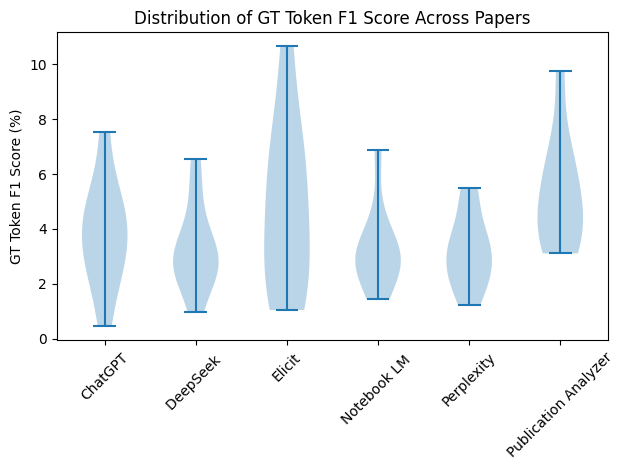

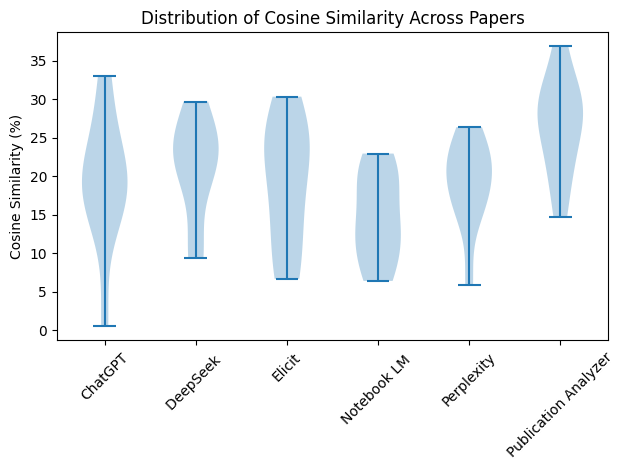

In [117]:


metrics = [
    'GT Token F1 Score (%)',
    'Cosine Similarity (%)',
    'Verbosity Ratio',
    'GT Phrase Recall (%)'
]

for m in metrics:
    df_all[m] = pd.to_numeric(df_all[m], errors='coerce')

avg_runs = (
    df_all
    .groupby(['Paper', 'Model'])[metrics]
    .mean()
    .reset_index()
)

# Compute per-model averages across all papers
model_avg = avg_runs.groupby('Model')[metrics].mean()




plt.figure()
data = [avg_runs[avg_runs['Model'] == m]['GT Token F1 Score (%)'].values
        for m in model_avg.index]
plt.violinplot(data)
plt.xticks(np.arange(1, len(model_avg.index) + 1), model_avg.index, rotation=45)
plt.title('Distribution of GT Token F1 Score Across Papers')
plt.ylabel('GT Token F1 Score (%)')
plt.tight_layout()
plt.show()


plt.figure()
data = [avg_runs[avg_runs['Model'] == m]['Cosine Similarity (%)'].values
        for m in model_avg.index]
plt.violinplot(data)
plt.xticks(np.arange(1, len(model_avg.index) + 1), model_avg.index, rotation=45)
plt.title('Distribution of Cosine Similarity Across Papers')
plt.ylabel('Cosine Similarity (%)')
plt.tight_layout()
plt.show()


KeyError: 'paper'

In [119]:

df_all['Model'] = (
    df_all['Model']
      .astype(str)
      .str.strip()
      .replace({'Notebook LM':'Notebook LLM'})
)

Models = sorted(df_all['Model'].unique())
print("Models after normalization:", Models)



Models after normalization: ['ChatGPT', 'DeepSeek', 'Elicit', 'Notebook LLM', 'Perplexity', 'Publication Analyzer']


In [120]:

pivot = (
    df_all
    .groupby(['paper','Model'])['GT Token F1 Score (%)']
    .mean()
    .unstack()
    .loc[:, Models]
)
plt.figure(figsize=(8,6))
plt.imshow(pivot, aspect='auto', vmin=0, vmax=10, cmap='jet')
plt.colorbar(label='Avg F1 (%)')
plt.yticks(range(len(pivot.index)), pivot.index)
plt.xticks(range(len(Models)), Models, rotation=45)
plt.title('Average GT Token F1 by Paper & Model')
plt.tight_layout()
plt.show()

KeyError: 'paper'

/tmp/ipython-input-278346925.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipython-input-278346925.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


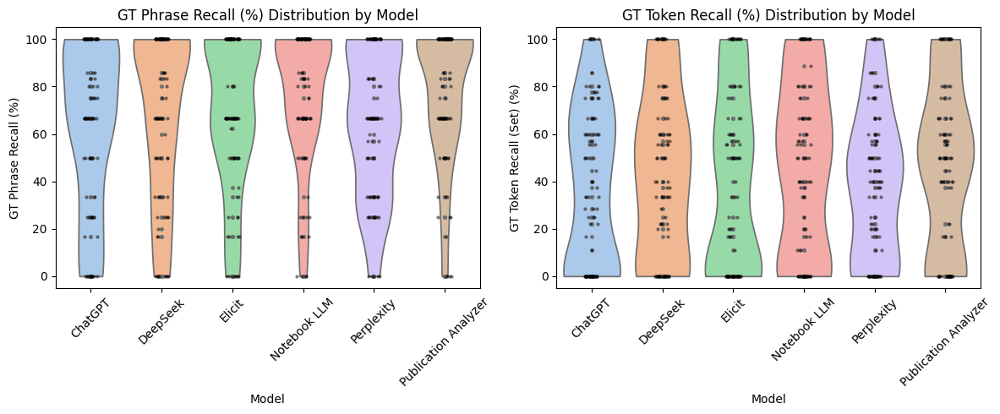

In [121]:


fig, axs = plt.subplots(1,2, figsize=(12,5))

sns.violinplot(
    data=df_all,
    x='Model', y='GT Phrase Recall (%)',
    order=Models,
    palette='pastel',
    inner='point',
    cut=0,
    ax=axs[0]
)

sns.stripplot(
    data=df_all,
    x='Model', y='GT Phrase Recall (%)',
    order=Models,
    color='k',
    size=3,
    alpha=0.5,
    ax=axs[0]
)
axs[0].set_title('GT Phrase Recall (%) Distribution by Model')
axs[0].tick_params(axis='x', rotation=45)

sns.violinplot(
    data=df_all,
    x='Model', y='GT Token Recall (Set) (%)',
    order=Models,
    palette='pastel',
    inner='point',
    cut=0,
    ax=axs[1]
)
sns.stripplot(
    data=df_all,
    x='Model', y='GT Token Recall (Set) (%)',
    order=Models,
    color='k',
    size=3,
    alpha=0.5,
    ax=axs[1]
)
axs[1].set_title('GT Token Recall (%) Distribution by Model')
axs[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


<ipython-input-101-208a091325fa>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
<ipython-input-101-208a091325fa>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


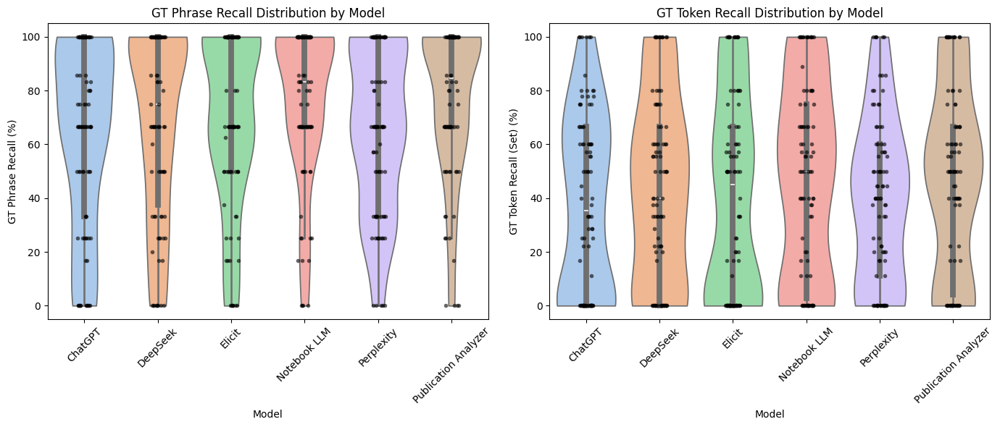

In [ ]:

fig, axes = plt.subplots(1, 2, figsize=(14,6), sharey=False)

for ax, metric, title in zip(axes,
                             ['GT Phrase Recall (%)','GT Token Recall (Set) (%)'],
                             ['Phrase Recall','Token Recall']):
    sns.violinplot(
        data=df_all,
        x='Model', y=metric,
        order=Models,
        palette='pastel',
        inner='box',
        cut=0,
        ax=ax
    )
    sns.stripplot(
        data=df_all,
        x='Model', y=metric,
        order=Models,
        color='k',
        size=4,
        alpha=0.6,
        ax=ax
    )
    ax.set_title(f'GT {title} Distribution by Model')
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


/tmp/ipython-input-3587741469.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipython-input-3587741469.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


<Figure size 640x480 with 0 Axes>

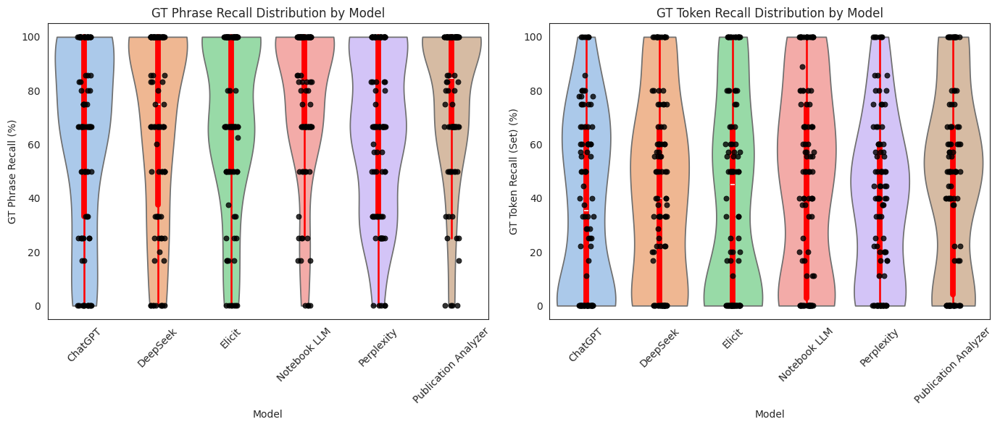

In [122]:

sns.set_style("white")
sns.despine()

fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=False)

for ax, metric, title in zip(
        axes,
        ['GT Phrase Recall (%)', 'GT Token Recall (Set) (%)'],
        ['Phrase Recall', 'Token Recall']
    ):

    sns.violinplot(
        data=df_all,
        x='Model', y=metric,
        order=Models,
        palette='pastel',
        inner='box',
        cut=0,
        ax=ax
    )

    sns.stripplot(
        data=df_all,
        x='Model', y=metric,
        order=Models,
        facecolor='black',
        edgecolor='black',
        linewidth=0.7,
        size=5,
        alpha=0.8,
        ax=ax
    )

    for line in ax.lines:
        if line.get_linestyle() == '-':
            line.set_color('red')


    for poly in ax.collections:
        if isinstance(poly, plt.Polygon):
            face_color = poly.get_facecolor()[0]
            if face_color[0] == face_color[1] == face_color[2]:
                poly.set_edgecolor('red')

    ax.grid(False)
    ax.set_title(f'GT {title} Distribution by Model')
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


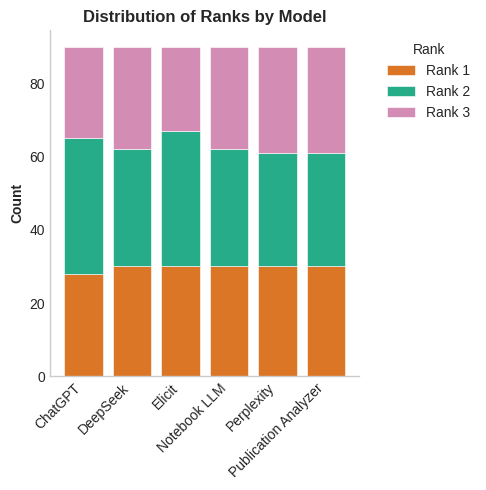

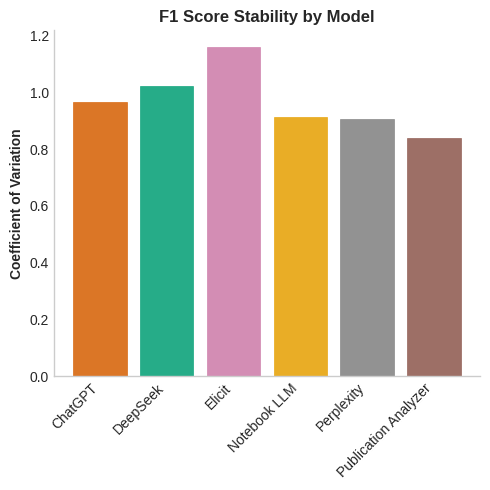

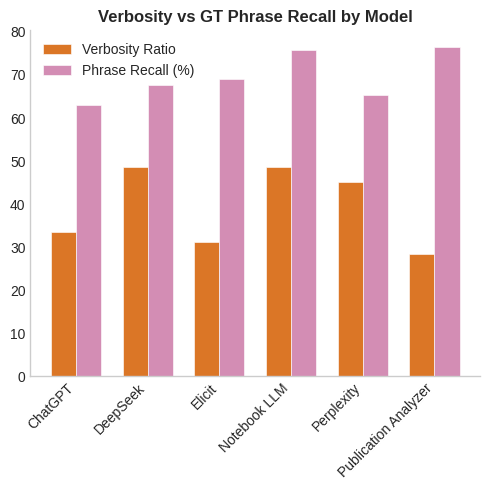

In [124]:


plt.style.use('seaborn-v0_8-whitegrid')
# Colorblind-safe palette (Okabe–Ito inspired)
colors = [
    '#D55E00',  # vermillion (orange-red)
    '#009E73',  # green
    '#CC79A7',  # purple
    '#E69F00',  # orange
    '#7F7F7F',  # gray
    '#8C564B',  # brown
    '#BCBD22'   # olive
]
plt.style.use('seaborn-v0_8-whitegrid')

rank_counts = (
    df_all
    .groupby(['Model','Rank (by F1 Score)'])
    .size()
    .unstack(fill_value=0)
    .loc[Models]
)

fig, ax = plt.subplots(figsize=(5,5))
bottom = np.zeros(len(Models))

for i, rank in enumerate(sorted(rank_counts.columns)):
    ax.bar(
        Models,
        rank_counts[rank],
        bottom=bottom,
        label=f'Rank {rank}',
        color=colors[i % len(colors)],
        edgecolor='white',
        linewidth=0.5,
        alpha=0.85
    )
    bottom += rank_counts[rank].values

ax.set_ylabel('Count', fontweight='bold')
ax.set_title('Distribution of Ranks by Model', fontweight='bold', fontsize=12)
ax.legend(title='Rank', bbox_to_anchor=(1.05,1), loc='upper left')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.xticks(rotation=45, ha='right')
plt.grid(False)

plt.tight_layout()
plt.show()
stats = (
    df_all
    .groupby('Model')['GT Token F1 Score (%)']
    .agg(['mean','std'])
    .loc[Models]
)
stats['CV'] = stats['std'] / stats['mean']

plt.figure(figsize=(5,5))
bars = plt.bar(
    Models,
    stats['CV'],
    edgecolor='white',
    linewidth=0.5,
    alpha=0.85
)

for i, bar in enumerate(bars):
    bar.set_color(colors[i % len(colors)])

plt.ylabel('Coefficient of Variation', fontweight='bold')
plt.title('F1 Score Stability by Model', fontweight='bold', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.grid(False)

plt.tight_layout()
plt.show()
avg_vr = df_all.groupby('Model')['Verbosity Ratio'].mean().loc[Models]
avg_pr = df_all.groupby('Model')['GT Phrase Recall (%)'].mean().loc[Models]

x = np.arange(len(Models))
width = 0.35

fig, ax = plt.subplots(figsize=(5,5))
ax.bar(
    x - width/2,
    avg_vr,
    width,
    label='Verbosity Ratio',
    color=colors[0],
    edgecolor='white',
    linewidth=0.5,
    alpha=0.85
)
ax.bar(
    x + width/2,
    avg_pr,
    width,
    label='Phrase Recall (%)',
    color=colors[2],
    edgecolor='white',
    linewidth=0.5,
    alpha=0.85
)

ax.set_xticks(x)
ax.set_xticklabels(Models, rotation=45, ha='right')
ax.set_title('Verbosity vs GT Phrase Recall by Model', fontweight='bold', fontsize=12)
ax.legend()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.grid(False)

plt.tight_layout()
plt.show()


KeyError: 'paper'

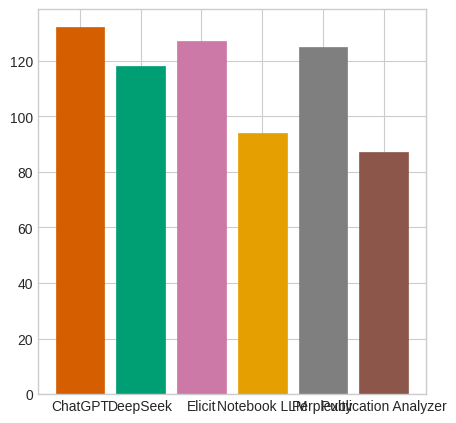

In [125]:

misses = df_all.groupby('Model')['GT Phrase Misses'].sum().loc[Models]

fig, ax = plt.subplots(figsize=(5, 5))
bars = ax.bar(Models, misses, edgecolor='white', linewidth=0.5)

for i, bar in enumerate(bars):
    bar.set_color(colors[i % len(colors)])


df_mean = df_all.groupby(['Model','paper'])['GT Token F1 Score (%)'].mean()
worst = df_mean.groupby('Model').idxmin().apply(lambda x: x[1])

for i, (model, bar) in enumerate(zip(Models, bars)):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
            f"{worst[model]}", ha='center', va='bottom', fontsize=8, rotation=90)

ax.set_ylabel('Total GT Phrase Misses', fontweight='bold')
ax.set_title('Phrase Misses by Model\n(Worst-performing paper annotated)', fontweight='bold', fontsize=12)
ax.set_xticks(np.arange(len(Models)))
ax.set_xticklabels(Models, rotation=45, ha='right')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.grid(False)

plt.tight_layout()
plt.show()


##QM9

In [ ]:

!mkdir /content/Molecules
!tar -C Molecules -xvf /content/dsgdb9nsd.xyz.tar.bz2

Streaming output truncated to the last 5000 lines.
dsgdb9nsd_128886.xyz
dsgdb9nsd_128887.xyz
dsgdb9nsd_128888.xyz
dsgdb9nsd_128889.xyz
dsgdb9nsd_128890.xyz
dsgdb9nsd_128891.xyz
dsgdb9nsd_128892.xyz
dsgdb9nsd_128893.xyz
dsgdb9nsd_128894.xyz
dsgdb9nsd_128895.xyz
dsgdb9nsd_128896.xyz
dsgdb9nsd_128897.xyz
dsgdb9nsd_128898.xyz
dsgdb9nsd_128899.xyz
dsgdb9nsd_128900.xyz
dsgdb9nsd_128901.xyz
dsgdb9nsd_128902.xyz
dsgdb9nsd_128903.xyz
dsgdb9nsd_128904.xyz
dsgdb9nsd_128905.xyz
dsgdb9nsd_128906.xyz
dsgdb9nsd_128907.xyz
dsgdb9nsd_128908.xyz
dsgdb9nsd_128909.xyz
dsgdb9nsd_128910.xyz
dsgdb9nsd_128911.xyz
dsgdb9nsd_128912.xyz
dsgdb9nsd_128913.xyz
dsgdb9nsd_128914.xyz
dsgdb9nsd_128915.xyz
dsgdb9nsd_128916.xyz
dsgdb9nsd_128917.xyz
dsgdb9nsd_128918.xyz
dsgdb9nsd_128919.xyz
dsgdb9nsd_128920.xyz
dsgdb9nsd_128921.xyz
dsgdb9nsd_128922.xyz
dsgdb9nsd_128923.xyz
dsgdb9nsd_128924.xyz
dsgdb9nsd_128925.xyz
dsgdb9nsd_128926.xyz
dsgdb9nsd_128927.xyz
dsgdb9nsd_128928.xyz
dsgdb9nsd_128929.xyz
dsgdb9nsd_128930.xyz
dsgd

In [ ]:
import os
import json
import glob
import torch
import numpy as np
from rdkit import Chem
from rdkit.Chem import AllChem

# ---- Utilities ----
def parse_float(s: str) -> float:
    try:
        return float(s)
    except ValueError:
        base, power = s.split('*^')
        return float(base) * 10**float(power)

def parse_xyz(filename):
    num_atoms = 0
    scalar_properties = []
    atomic_symbols = []
    xyz = []
    charges = []
    harmonic_vibrational_frequencies = []
    smiles = ''
    inchi = ''
    with open(filename, 'r') as f:
        for line_num, line in enumerate(f):
            if line_num == 0:
                num_atoms = int(line)
            elif line_num == 1:
                scalar_properties = [float(i) for i in line.split()[2:]]
            elif 2 <= line_num <= 1 + num_atoms:
                atom_symbol, x, y, z, charge = line.split()
                atomic_symbols.append(atom_symbol)
                xyz.append([parse_float(x), parse_float(y), parse_float(z)])
                charges.append(parse_float(charge))
            elif line_num == num_atoms + 2:
                harmonic_vibrational_frequencies = [float(i) for i in line.split()]
            elif line_num == num_atoms + 3:
                smiles = line.split()[0]
            elif line_num == num_atoms + 4:
                inchi = line.split()[0]

    result = {
        'num_atoms': num_atoms,
        'atomic_symbols': atomic_symbols,
        'pos': torch.tensor(xyz),
        'charges': np.array(charges),
        'harmonic_oscillator_frequencies': harmonic_vibrational_frequencies,
        'smiles': smiles,
        'inchi': inchi
    }
    scalar_property_labels = ['A', 'B', 'C', 'mu', 'alpha', 'homo', 'lumo', 'gap', 'r2', 'zpve', 'u0', 'u', 'h', 'g', 'cv']
    scalar_properties = dict(zip(scalar_property_labels, scalar_properties))
    result.update(scalar_properties)
    return result

# ---- SMARTS Setup ----
# Amine: neutral nitrogen with 3 bonds (NH2, NH, N)
amine_pattern = Chem.MolFromSmarts('[NX3;H2,H1,H0]')
# Ammonium: positively charged nitrogen with 4 single bonds
ammonium_pattern = Chem.MolFromSmarts('[NX4+]')

def has_amine_or_ammonium(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        return False
    mol = Chem.AddHs(mol)
    return mol.HasSubstructMatch(amine_pattern) or mol.HasSubstructMatch(ammonium_pattern)

# ---- Main Script ----
input_dir = "/content/Molecules"  # Change as needed
output_dir = "/content/Amines_Chunked"
os.makedirs(output_dir, exist_ok=True)

filenames = sorted(glob.glob(os.path.join(input_dir, "*.xyz")))
chunk_size = 10000

for chunk_start in range(0, len(filenames), chunk_size):
    chunk_end = min(chunk_start + chunk_size, len(filenames))
    matching_data = []

    for i in range(chunk_start, chunk_end):
        fname = filenames[i]
        try:
            parsed = parse_xyz(fname)
            smiles = parsed['smiles']
            if has_amine_or_ammonium(smiles):
                entry = {
                    'smiles': smiles,
                    'mu': parsed.get('mu'),
                    'alpha': parsed.get('alpha'),
                    'homo': parsed.get('homo'),
                    'lumo': parsed.get('lumo'),
                    'gap': parsed.get('gap'),
                    'zpve': parsed.get('zpve'),
                    'u0': parsed.get('u0'),
                    'u': parsed.get('u'),
                    'h': parsed.get('h'),
                    'g': parsed.get('g'),
                    'cv': parsed.get('cv'),
                    'r2': parsed.get('r2'),
                    'inchi': parsed.get('inchi'),
                }
                matching_data.append(entry)
        except Exception as e:
            print(f"Error parsing {fname}: {e}")
            continue

    output_file = os.path.join(output_dir, f"amines_chunk_{chunk_start}_{chunk_end}.jsonl")
    with open(output_file, 'w') as f:
        for item in matching_data:
            f.write(json.dumps(item) + '\n')

    print(f"✅ Saved {len(matching_data)} amine-containing molecules in {output_file}")


✅ Saved 3290 amine-containing molecules in /content/Amines_Chunked/amines_chunk_0_10000.jsonl
✅ Saved 3775 amine-containing molecules in /content/Amines_Chunked/amines_chunk_10000_20000.jsonl
✅ Saved 3765 amine-containing molecules in /content/Amines_Chunked/amines_chunk_20000_30000.jsonl
✅ Saved 4077 amine-containing molecules in /content/Amines_Chunked/amines_chunk_30000_40000.jsonl
✅ Saved 4896 amine-containing molecules in /content/Amines_Chunked/amines_chunk_40000_50000.jsonl
✅ Saved 5020 amine-containing molecules in /content/Amines_Chunked/amines_chunk_50000_60000.jsonl
✅ Saved 4094 amine-containing molecules in /content/Amines_Chunked/amines_chunk_60000_70000.jsonl
✅ Saved 4301 amine-containing molecules in /content/Amines_Chunked/amines_chunk_70000_80000.jsonl
✅ Saved 4260 amine-containing molecules in /content/Amines_Chunked/amines_chunk_80000_90000.jsonl
✅ Saved 3898 amine-containing molecules in /content/Amines_Chunked/amines_chunk_90000_100000.jsonl
✅ Saved 3497 amine-cont

In [ ]:
from rdkit import Chem
from rdkit.Chem.Draw import rdMolDraw2D

# Example molecule
mol = Chem.MolFromSmiles("CC(C)CCNCC1=CC=CC=C1")

# Set up drawer with desired image size and grid layout
drawer = rdMolDraw2D.MolDraw2DCairo(300, 300)  # for PNG
# drawer = rdMolDraw2D.MolDraw2DSVG(300, 300)  # for SVG

# Access and modify drawing options
options = drawer.drawOptions()
options.bondLineWidth = 3.0  # Default is ~1.0

# Draw the molecule
drawer.DrawMolecule(mol)
drawer.FinishDrawing()

# Save or show the image
with open("thick_bonds.png", "wb") as f:
    f.write(drawer.GetDrawingText())


In [ ]:
from rdkit import Chem
from rdkit.Chem import Descriptors, rdMolDescriptors

def get_rdkit_descriptors(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        return None

    # Compute descriptors
    descriptors = {
        "MolecularWeight": Descriptors.MolWt(mol),
        "LogP": Descriptors.MolLogP(mol),
        "TPSA": Descriptors.TPSA(mol),
        "NumHAcceptors": Descriptors.NumHAcceptors(mol),
        "NumHDonors": Descriptors.NumHDonors(mol),
        "NumAromaticRings": Descriptors.NumAromaticRings(mol),
        "NumAliphaticRings": Descriptors.NumAliphaticRings(mol),
        "NumCarbon": sum(1 for atom in mol.GetAtoms() if atom.GetSymbol() == "C"),
        "NumNitrogen": sum(1 for atom in mol.GetAtoms() if atom.GetSymbol() == "N"),
        "NumOxygen": sum(1 for atom in mol.GetAtoms() if atom.GetSymbol() == "O"),
        "NumHydrogen": sum(1 for atom in mol.GetAtoms() if atom.GetSymbol() == "H"),
        "NumIodine": sum(1 for atom in mol.GetAtoms() if atom.GetSymbol() == "I"),
        "nHeavyAtom": Descriptors.HeavyAtomCount(mol),
        "nAtom": mol.GetNumAtoms(),
        "nSpiro": rdMolDescriptors.CalcNumSpiroAtoms(mol),
        "nBridgehead": rdMolDescriptors.CalcNumBridgeheadAtoms(mol),
        "nHetero": Descriptors.NumHeteroatoms(mol),
        "nH": sum(1 for atom in mol.GetAtoms() if atom.GetSymbol() == "H"),
        "nC": sum(1 for atom in mol.GetAtoms() if atom.GetSymbol() == "C"),
        "nN": sum(1 for atom in mol.GetAtoms() if atom.GetSymbol() == "N"),
        "nO": sum(1 for atom in mol.GetAtoms() if atom.GetSymbol() == "O"),
        "nS": sum(1 for atom in mol.GetAtoms() if atom.GetSymbol() == "S"),
        "nF": sum(1 for atom in mol.GetAtoms() if atom.GetSymbol() == "F"),
        "nCl": sum(1 for atom in mol.GetAtoms() if atom.GetSymbol() == "Cl"),
        "nBr": sum(1 for atom in mol.GetAtoms() if atom.GetSymbol() == "Br"),
        "nI": sum(1 for atom in mol.GetAtoms() if atom.GetSymbol() == "I"),
        "nX": sum(1 for atom in mol.GetAtoms() if atom.GetSymbol() in ["F", "Cl", "Br", "I"]),
        "nBonds": mol.GetNumBonds(),
        "nBondsA": sum(1 for bond in mol.GetBonds() if bond.GetIsAromatic()),
        "nBondsM": sum(1 for bond in mol.GetBonds() if bond.GetBondTypeAsDouble() > 1),
        "nBondsO": sum(1 for bond in mol.GetBonds() if bond.GetBondTypeAsDouble() == 1),
        "nBondsS": sum(1 for bond in mol.GetBonds() if bond.GetBondTypeAsDouble() == 1 and not bond.GetIsAromatic()),
        "nBondsKS": sum(1 for bond in mol.GetBonds() if bond.GetBondType().name == 'SINGLE'),
        "nBondsKD": sum(1 for bond in mol.GetBonds() if bond.GetBondType().name == 'DOUBLE'),
        "nRing": Chem.GetSSSR(mol),  # number of rings
        "nAromAtom": sum(1 for atom in mol.GetAtoms() if atom.GetIsAromatic()),
        "nAromBond": sum(1 for bond in mol.GetBonds() if bond.GetIsAromatic()),
        "Diameter": -1,  # To be filled with graph analysis
        "Radius": -1,    # To be filled with graph analysis
    }

    return descriptors


In [ ]:
df_qm9.to_csv('qm9_subset.csv', index=False)

In [ ]:
import json
import pandas as pd

combined_records = []

files = [
    "/content/Amines_Chunked/amines_chunk_0_10000.jsonl",
    "/content/Amines_Chunked/amines_chunk_100000_110000.jsonl",
    "/content/Amines_Chunked/amines_chunk_90000_100000.jsonl",
    "/content/Amines_Chunked/amines_chunk_120000_130000.jsonl",
    "/content/Amines_Chunked/amines_chunk_50000_60000.jsonl"
]

for path in files:
    with open(path) as f:
        for i, line in enumerate(f):
            if i >= 2000:  # for testing on each file
                break
            record = json.loads(line)
            smiles = record.get("smiles")
            qm9_props = {
                "HOMO":   record.get("homo"),
                "LUMO":   record.get("lumo"),
                "Band Gap (eV)":         record.get("gap"),
                "Dipole Moment (Debye)": record.get("mu")
            }
            rdkit_desc = get_rdkit_descriptors(smiles)
            if rdkit_desc:
                combined = {"SMILES": smiles, **qm9_props, **rdkit_desc}
                combined_records.append(combined)

df_qm9 = pd.DataFrame(combined_records)
df_qm9.head()


,SMILES,HOMO,LUMO,Band Gap (eV),Dipole Moment (Debye),MolecularWeight,LogP,TPSA,NumHAcceptors,NumHDonors,...,nBondsM,nBondsO,nBondsS,nBondsKS,nBondsKD,nRing,nAromAtom,nAromBond,Diameter,Radius
0,NC=O,-0.2543,0.0302,0.2845,3.7286,45.041,-0.89850,43.09,1,1,...,1,1,1,1,1,[],0,0,-1,-1
1,CC(N)=O,-0.2436,0.0347,0.2783,3.6367,59.068,-0.50840,43.09,1,1,...,1,2,2,2,1,[],0,0,-1,-1
2,NC(N)=O,-0.2495,0.0556,0.3051,3.4869,60.056,-0.97620,69.11,1,2,...,1,2,2,2,1,[],0,0,-1,-1
3,NCC#N,-0.2683,0.0173,0.2855,4.4361,56.068,-0.53132,49.81,2,1,...,1,2,2,2,0,[],0,0,-1,-1
4,CNC=O,-0.2516,0.0335,0.2851,3.7071,59.068,-0.63780,29.10,1,1,...,1,2,2,2,1,[],0,0,-1,-1


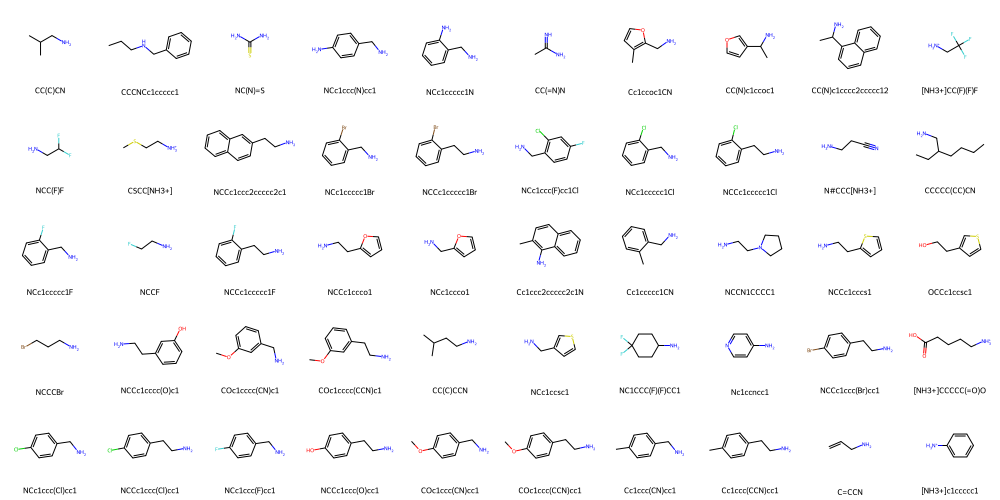

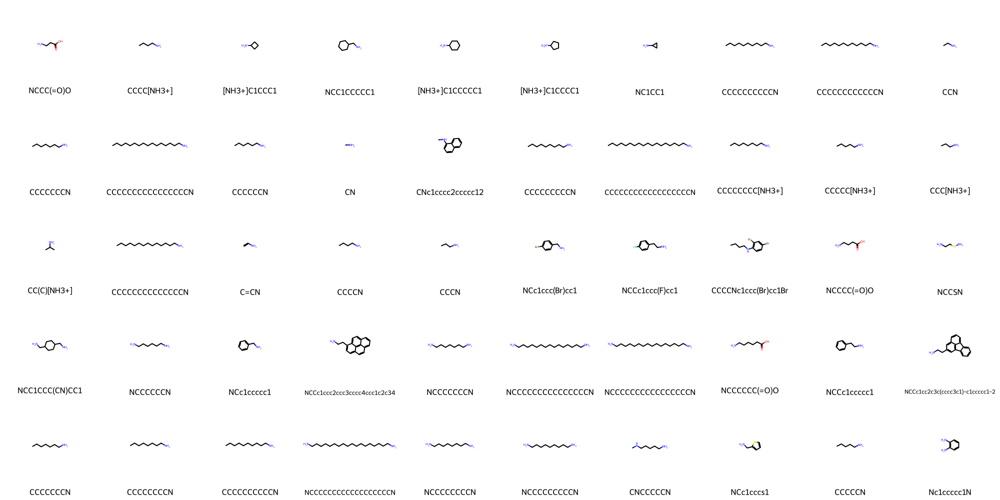

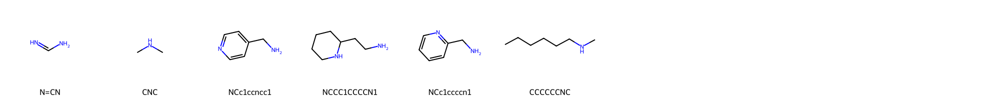

In [ ]:
import pandas as pd
from rdkit import Chem
from rdkit.Chem import Draw
from rdkit.Chem.Draw import IPythonConsole
from IPython.display import display

# allow up to 200 molecules in notebook renderer
IPythonConsole.maxMols = 200

# load trimmed perovskite dataset
df = pd.read_csv('/content/perov_trimmed.csv')

# convert SMILES to RDKit Mol, filter invalid
mols = [Chem.MolFromSmiles(s) for s in df['SMILES']]
mols = [m for m in mols if m]

# function to display in chunks
def display_in_chunks(molecule_list, chunk_size=50, per_row=10, img_size=(200, 200)):
    for i in range(0, len(molecule_list), chunk_size):
        chunk = molecule_list[i:i + chunk_size]
        legends = [Chem.MolToSmiles(m) for m in chunk]
        grid = Draw.MolsToGridImage(chunk, molsPerRow=per_row, subImgSize=img_size, legends=legends)
        display(grid)

# display all molecules in chunks of 50
display_in_chunks(mols, chunk_size=50, per_row=10, img_size=(200, 200))


In [ ]:
import pandas as pd
from rdkit import Chem

def add_ring_counts(input_csv: str,
                    output_csv: str,
                    ring_sizes=(3,4,5,6)):
    """
    Reads input_csv, counts how many aromatic rings of each size
    (3–6) appear in each SMILES, sums them to n_rings,
    then writes the result to output_csv.
    """
    df = pd.read_csv(input_csv)
    # compile SMARTS patterns for each ring size once
    patterns = {
        n: Chem.MolFromSmarts(f"a1{'a'*(n-1)}1")
        for n in ring_sizes
    }




In [ ]:
add_ring_counts(
    input_csv="perov_trimmed.csv",
    output_csv="perov_with_ring_counts.csv"
)


In [ ]:
add_ring_counts(
    input_csv="qm9_trimmed.csv",
    output_csv="qm9_with_ring_counts.csv"
)


In [ ]:
df_perov= pd.read_csv("perov_with_ring_counts.csv")
df_perov

,SMILES,Dipole Moment (Debye),Band Gap (eV),HOMO,LUMO,MolecularWeight,LogP,TPSA,NumCarbon,NumHydrogen,...,nBonds,nBondsO,nBondsS,nBondsA,nBondsM,nBondsKS,nBondsKD,Diameter,Radius,n_rings
0,CC(C)CN,1.06,4.7100,-5.2200,-0.5200,73.139,0.6011,26.02,4,0,...,15,4,15,0,0,15,0,3,2,0
1,CCCNCC1=CC=CC=C1,0.81,3.7500,-4.8000,-1.0500,149.237,2.1862,12.03,10,0,...,26,11,20,6,6,23,3,8,4,1
2,C(=S)(N)N,4.81,3.5900,-4.7300,-1.1400,76.124,-0.8113,52.04,1,0,...,7,3,6,0,1,6,1,2,1,0
3,C1=CC(=CC=C1CN)N,3.03,3.6700,-4.5900,-0.9200,122.171,0.7275,52.04,7,0,...,19,9,13,6,6,16,3,6,3,1
4,C1=CC=C(C(=C1)CN)N,1.67,3.7800,-4.7100,-0.9300,122.171,0.7275,52.04,7,0,...,19,9,13,6,6,16,3,5,3,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101,CNC,0.93,4.3627,-0.5139,-4.8766,45.085,-0.1644,12.03,2,0,...,9,2,9,0,0,9,0,2,1,0
102,N1=CC=C(C=C1)CN,3.86,3.8928,-1.5070,-5.3998,108.144,0.5403,38.91,6,0,...,16,8,10,6,6,13,3,5,3,1
103,N1CCCCC1CCN,1.45,4.0562,-0.4912,-4.5474,128.219,0.4773,38.05,7,0,...,25,9,25,0,0,25,0,6,3,0
104,C1=CN=C(C=C1)CN,2.67,3.7078,-1.5645,-5.2723,108.144,0.5403,38.91,6,0,...,16,8,10,6,6,13,3,5,3,1


In [ ]:
df_qm9= pd.read_csv("qm9_with_ring_counts.csv")
df_qm9

,SMILES,HOMO,LUMO,Band Gap (eV),Dipole Moment (Debye),MolecularWeight,LogP,TPSA,NumHAcceptors,NumHDonors,...,nBondsO,nBondsS,nBondsKS,nBondsKD,nRing,nAromAtom,nAromBond,Diameter,Radius,n_rings
0,NC=O,-0.2543,0.0302,0.2845,3.7286,45.041,-0.89850,43.09,1,1,...,1,1,1,1,<rdkit.rdBase._vectSt6vectorIiSaIiEE object at...,0,0,-1,-1,0
1,CC(N)=O,-0.2436,0.0347,0.2783,3.6367,59.068,-0.50840,43.09,1,1,...,2,2,2,1,<rdkit.rdBase._vectSt6vectorIiSaIiEE object at...,0,0,-1,-1,0
2,NC(N)=O,-0.2495,0.0556,0.3051,3.4869,60.056,-0.97620,69.11,1,2,...,2,2,2,1,<rdkit.rdBase._vectSt6vectorIiSaIiEE object at...,0,0,-1,-1,0
3,NCC#N,-0.2683,0.0173,0.2855,4.4361,56.068,-0.53132,49.81,2,1,...,2,2,2,0,<rdkit.rdBase._vectSt6vectorIiSaIiEE object at...,0,0,-1,-1,0
4,CNC=O,-0.2516,0.0335,0.2851,3.7071,59.068,-0.63780,29.10,1,1,...,2,2,2,1,<rdkit.rdBase._vectSt6vectorIiSaIiEE object at...,0,0,-1,-1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,CC1(CNC=[NH+]1)C([O-])=O,-0.2352,0.0036,0.2388,5.3500,128.131,-3.79290,66.13,3,2,...,7,7,7,2,<rdkit.rdBase._vectSt6vectorIiSaIiEE object at...,0,0,-1,-1,0
9996,CC1(COC=N1)C(N)=O,-0.2401,0.0096,0.2497,2.1165,128.131,-0.71110,64.68,3,1,...,7,7,7,2,<rdkit.rdBase._vectSt6vectorIiSaIiEE object at...,0,0,-1,-1,0
9997,CC1([NH2+]CC=C1)C([O-])=O,-0.2338,-0.0043,0.2296,5.2336,127.143,-2.37180,56.74,2,1,...,7,7,7,2,<rdkit.rdBase._vectSt6vectorIiSaIiEE object at...,0,0,-1,-1,0
9998,CC1(OCC=C1)C(N)=O,-0.2250,0.0051,0.2300,2.9728,127.143,-0.18320,52.32,2,1,...,7,7,7,2,<rdkit.rdBase._vectSt6vectorIiSaIiEE object at...,0,0,-1,-1,0


In [ ]:
import json
import random
from rdkit import Chem
from rdkit.Chem.Draw import rdMolDraw2D

# Load 10 random molecules from the JSONL file
input_file = "Amines_Chunked/amines_chunk_0_10000.jsonl"  # Change if needed

# Read all lines
with open(input_file, 'r') as f:
    lines = f.readlines()

# Randomly sample 10 molecules
sampled = random.sample(lines, 10)

for i, line in enumerate(sampled):
    data = json.loads(line)
    smiles = data["smiles"]
    mol = Chem.MolFromSmiles(smiles)

    if mol:
        # Setup drawer
        drawer = rdMolDraw2D.MolDraw2DCairo(300, 300)
        options = drawer.drawOptions()
        options.bondLineWidth = 3.0
        options.atomLabelFontSize = 14

        # Draw molecule
        drawer.DrawMolecule(mol)
        drawer.FinishDrawing()

        # Save image
        with open(f"qm9_molecule_{i+1}.png", "wb") as f_out:
            f_out.write(drawer.GetDrawingText())

print("✅ 10 molecules drawn and saved as PNGs.")


✅ 10 molecules drawn and saved as PNGs.


## perovskite database

In [ ]:
!pip install torch_geometric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 44.9 MB/s eta 0:00:00


In [ ]:
from rdkit import RDLogger
RDLogger.DisableLog('rdApp.*')

import os
import pandas as pd
import torch
import networkx as nx

from rdkit import Chem
from rdkit.Chem import AllChem, rdmolops, Descriptors, rdMolDescriptors
from rdkit.Chem.Lipinski import NumRotatableBonds

from torch_geometric.data import Data  # <-- make sure this is here
#%% [Cell 2] - Imports & Constants
import os, random
import torch
import numpy as np
import pandas as pd
import networkx as nx
from datetime import datetime
from rdkit import Chem
from rdkit.Chem import AllChem, rdmolops, Descriptors, rdMolDescriptors
from rdkit.Chem.Lipinski import NumRotatableBonds
from torch_geometric.data import Data, DataLoader
from torch_geometric.nn import GINEConv, global_mean_pool
import torch.nn.functional as F
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_squared_error
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

In [ ]:

HARTREE_TO_EV = 27.211386245988

# Electronegativities & atom list
ELEC     = {"H":2.20,"C":2.55,"N":3.04,"O":3.44,"F":3.98,
           "P":2.19,"S":2.58,"Cl":3.16,"Br":2.96,"I":2.66}
ELEMENTS = ["C","N","O","S","F","Cl","Br","I","P","H"]

# SMARTS patterns
DONOR_SMARTS    = Chem.MolFromSmarts("[NX3;H2,H1;!$(NC=O)]")
ACCEPTOR_SMARTS = Chem.MolFromSmarts("[!$([#6;!H0;!H1;!H2])]")
RING_PATTERNS   = {n: Chem.MolFromSmarts(f"a1{'a'*(n-1)}1") for n in (3,4,5,6)}

# Default bond lengths
BOND_LENGTHS = {
    Chem.BondType.SINGLE: 1.54,
    Chem.BondType.DOUBLE: 1.34,
    Chem.BondType.TRIPLE: 1.20,
    "AROMATIC":            1.40
}

# Extra ring‐level globals to append to `u`
EXTRA_RING_GLOBALS = (
    ['total_rings_rdkit', 'aromatic_rings', 'aliphatic_rings', 'max_ring_size', 'mean_ring_size']
    + [f"rings_{n}" for n in range(3,9)]
)


#%% [Cell 3] – Graph‐dataset builder with enriched ring info

def extract_ring_info(mol: Chem.Mol) -> dict:
    """
    Returns detailed ring statistics:
      - total number of rings (RDKit)
      - count of aromatic vs. aliphatic rings
      - max & mean ring size
      - per‐size ring counts for sizes 3–8
    """
    ri         = mol.GetRingInfo()
    atom_rings = ri.AtomRings()
    sizes      = [len(r) for r in atom_rings]
    total      = len(sizes)
    size_counts= {n: sizes.count(n) for n in range(3,9)}

    arom = 0
    for ring in atom_rings:
        if all(mol.GetAtomWithIdx(i).GetIsAromatic() for i in ring):
            arom += 1
    aliph = total - arom

    return {
        'total_rings_rdkit': total,
        'aromatic_rings':   arom,
        'aliphatic_rings':  aliph,
        'max_ring_size':    max(sizes) if sizes else 0,
        'mean_ring_size':   sum(sizes)/len(sizes) if sizes else 0.0,
        **{f"rings_{n}": size_counts.get(n, 0) for n in range(3,9)}
    }


def mol_to_graph(row: pd.Series, global_cols: list) -> Data:
    smi  = row.SMILES
    # Build an unsanitized molecule for ring-info
    mol0 = Chem.MolFromSmiles(smi)
    Chem.SanitizeMol(mol0)
    ring_info = extract_ring_info(mol0)

    # Pad with H’s and compute Gasteiger charges
    mol = Chem.AddHs(mol0)
    AllChem.ComputeGasteigerCharges(mol)

    # Adjacency & distance map from first ammonium anchor
    A       = rdmolops.GetAdjacencyMatrix(mol, useBO=False)
    G       = nx.from_numpy_array(A)
    am_idxs = [a.GetIdx() for a in mol.GetAtoms()
               if a.GetSymbol()=="N" and a.GetFormalCharge()==1]
    dist_m  = nx.single_source_shortest_path_length(G, am_idxs[0]) if am_idxs else {}

    # --- Node features ---
    feats = []
    for atom in mol.GetAtoms():
        i    = atom.GetIdx()
        z    = atom.GetSymbol()
        ohe  = [int(z==e) for e in ELEMENTS]
        deg  = atom.GetDegree()
        chg  = atom.GetFormalCharge()
        impv = atom.GetImplicitValence()
        hyb  = atom.GetHybridization().name
        hyb_ohe = [int(hyb==h) for h in ("SP","SP2","SP3","SP3D","SP3D2")]
        arom = int(atom.GetIsAromatic())
        hbd  = int(z in ("N","O") and atom.GetTotalNumHs()>0 and mol.HasSubstructMatch(DONOR_SMARTS))
        hba  = int(z in ("N","O") and mol.HasSubstructMatch(ACCEPTOR_SMARTS))
        pchg = float(atom.GetProp('_GasteigerCharge')) if atom.HasProp('_GasteigerCharge') else 0.0
        rvdw = Chem.GetPeriodicTable().GetRvdw(atom.GetAtomicNum())
        mass = atom.GetMass()
        en   = ELEC.get(z,0.0)
        dist = dist_m.get(i, -1)
        # per‐atom ring membership counts for 3–6
        mem  = [int(any(i in ring for ring in mol.GetSubstructMatches(p)))
                for p in RING_PATTERNS.values()]

        feats.append(ohe + [deg,chg,impv] + hyb_ohe
                     + [arom,hbd,hba,pchg,rvdw,dist,mass,en]
                     + mem)

    x = torch.tensor(feats, dtype=torch.float)

    # --- Edge features ---
    eidx, eattr = [], []
    for b in mol.GetBonds():
        i,j    = b.GetBeginAtomIdx(), b.GetEndAtomIdx()
        bt     = b.GetBondType()
        bt_ohe = [
            int(bt==Chem.BondType.SINGLE),
            int(bt==Chem.BondType.DOUBLE),
            int(bt==Chem.BondType.TRIPLE),
            int(b.GetIsAromatic())
        ]
        conj   = int(b.GetIsConjugated())
        ringf  = int(b.IsInRing())
        st     = b.GetStereo().name
        st_ohe = [int(st==s) for s in ("STEREONONE","STEREOANY","STEREOZ","STEREOE")]
        length = BOND_LENGTHS["AROMATIC"] if b.GetIsAromatic() else BOND_LENGTHS.get(bt,1.50)
        feat   = bt_ohe + [conj,ringf] + st_ohe + [length]

        eidx  += [(i,j),(j,i)]
        eattr += [feat,feat]

    edge_index = torch.tensor(eidx, dtype=torch.long).t().contiguous()
    edge_attr  = torch.tensor(eattr, dtype=torch.float)

    data = Data(x=x, edge_index=edge_index, edge_attr=edge_attr)
    data.smiles = smi

    # --- Extra physico‐chemical targets ---
    n_conj = sum(int(b.GetIsConjugated()) for b in mol.GetBonds())
    heavy  = [a for a in mol.GetAtoms() if a.GetSymbol()!="H"]
    avg_en = sum(ELEC.get(a.GetSymbol(),0) for a in heavy)/max(1,len(heavy))
    rot_b  = NumRotatableBonds(mol0)
    asa    = rdMolDescriptors.CalcLabuteASA(mol0)
    mr     = Descriptors.MolMR(mol0)

    # Align units for QM9 vs. perov
    raw_gap, raw_homo, raw_lumo = (
        row['Band Gap (eV)'],
        row['HOMO'],
        row['LUMO']
    )
    if not row['is_perov']:
        gap  = raw_gap  * HARTREE_TO_EV
        homo = raw_homo * HARTREE_TO_EV
        lumo = raw_lumo * HARTREE_TO_EV
    else:
        gap, homo, lumo = raw_gap, raw_homo, raw_lumo

    y_list = [
        gap, homo, lumo,
        row['Dipole Moment (Debye)'],
        row['TPSA'],
        row['n_rings'],
        row['NumHDonors'],
        row['NumHAcceptors'],
        n_conj, avg_en, rot_b, asa, mr
    ]
    data.y = torch.tensor(y_list, dtype=torch.float).unsqueeze(0)

    # --- Global features u: CSV globals + enriched ring info ---
    u_list = [row[c] for c in global_cols] + [ring_info[k] for k in EXTRA_RING_GLOBALS]
    data.u = torch.tensor(u_list, dtype=torch.float).unsqueeze(0)

    # Tag perov vs QM9
    data.is_perov = bool(row['is_perov'])

    return data


def build_dataset(perov_csv: str, qm9_csv: str, out_file: str):
    perov = pd.read_csv(perov_csv); perov['is_perov'] = True
    qm9   = pd.read_csv(qm9_csv);   qm9['is_perov']  = False
    df    = pd.concat([perov, qm9], ignore_index=True)

    exclude     = {
      'SMILES','Band Gap (eV)','HOMO','LUMO','Dipole Moment (Debye)',
      'TPSA','n_rings','NumHDonors','NumHAcceptors','is_perov'
    }
    global_cols = [c for c in df.columns if c not in exclude]

    graphs = []
    for _, row in df.iterrows():
        graphs.append(mol_to_graph(row, global_cols))

    torch.save(graphs, out_file)
    print(f"Saved {len(graphs)} graphs "
          f"({perov.shape[0]} perov, {qm9.shape[0]} QM9)")


#%% [Cell 4] – Run the builder
build_dataset(
    'perov_with_ring_counts.csv',
    'qm9_with_ring_counts.csv',
    'combined_graphs.pt'
)


Saved 10106 graphs (106 perov, 10000 QM9)


is_perov
0.0    10000
1.0      106
Name: count, dtype: int64 → perov / QM9 split

                      count       mean        std        min        25%  \
band_gap            10106.0   6.607044   1.117565   0.669400   5.817794   
homo                10106.0  -6.336369   0.656875  -8.506279  -6.721212   
lumo                10106.0   0.243162   1.146160  -5.760200  -0.631304   
dipole_moment       10106.0   3.233866   1.761240   0.000700   2.008975   
TPSA                10106.0  46.608534  21.127526   3.010000  29.540001   
n_rings             10106.0   0.183159   0.390887   0.000000   0.000000   
NumHDonors          10106.0   1.248367   0.828882   0.000000   1.000000   
NumHAcceptors       10106.0   2.451118   0.873965   0.000000   2.000000   
n_conj              10106.0   2.527607   2.604468   0.000000   0.000000   
avg_en              10106.0   2.776816   0.080799   2.575789   2.703333   
rotatable_bonds     10106.0   1.370473   1.316622   0.000000   0.000000   
surface_area      

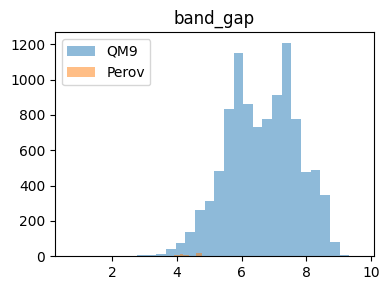

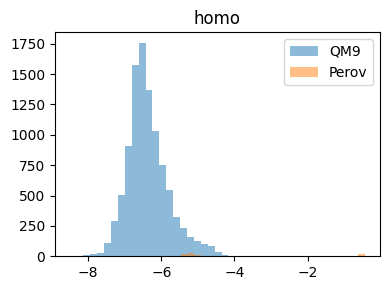

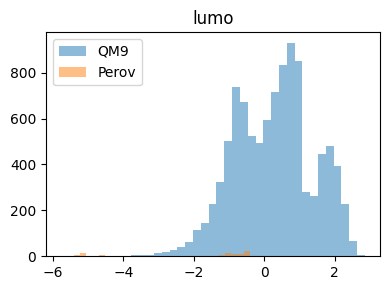

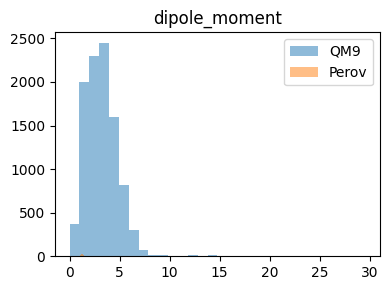

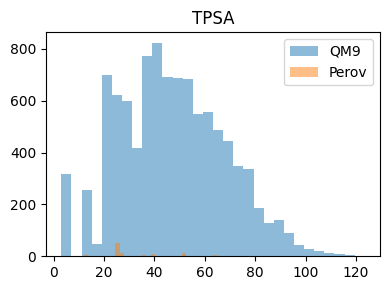

...

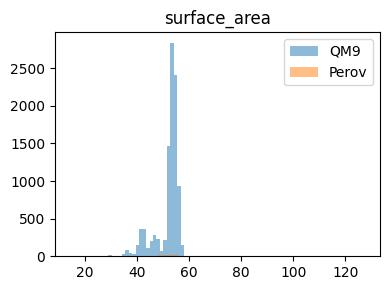

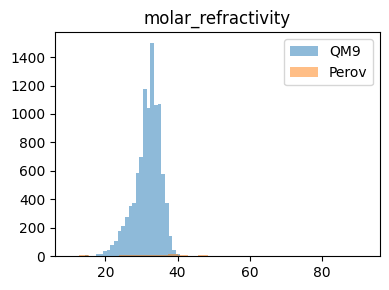

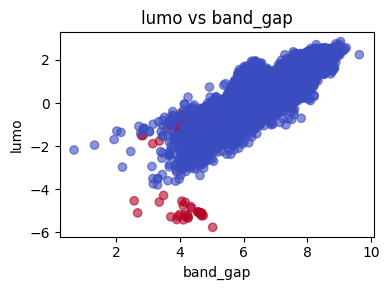

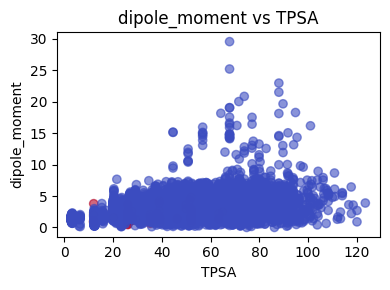

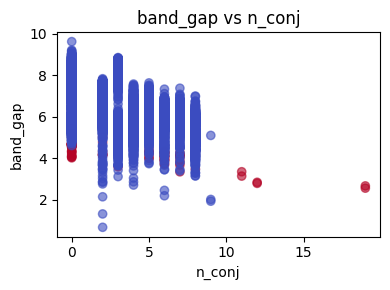

In [ ]:
# Colab cell 1: unpickle hack + load
import torch
from torch_geometric.data.data import DataEdgeAttr

# Allowlist the custom class so torch.load works
torch.serialization.add_safe_globals([DataEdgeAttr])

# Load your graphs (make sure weights_only=False)
graphs = torch.load('combined_graphs.pt', weights_only=False, map_location='cpu')

# Colab cell 2: build DataFrame
import pandas as pd
import numpy as np

rows = []
for g in graphs:
    y = g.y.squeeze(0).numpy()
    rows.append(
        np.concatenate([
            y,
            [int(g.is_perov)]       # 0=QM9, 1=perov
        ])
    )

cols = [
    'band_gap','homo','lumo','dipole_moment','TPSA',
    'n_rings','NumHDonors','NumHAcceptors',
    'n_conj','avg_en','rotatable_bonds','surface_area','molar_refractivity',
    'is_perov'
]
df = pd.DataFrame(rows, columns=cols)

# quick check
print(df['is_perov'].value_counts(), "→ perov / QM9 split\n")
print(df.describe().T)

# Colab cell 3: per‐target histograms, QM9 vs perov
import matplotlib.pyplot as plt

targets = cols[:-1]
for t in targets:
    plt.figure(figsize=(4,3))
    plt.hist(df.loc[df.is_perov==0, t], bins=30, alpha=0.5, label='QM9')
    plt.hist(df.loc[df.is_perov==1, t], bins=30, alpha=0.5, label='Perov')
    plt.title(t); plt.legend(); plt.tight_layout()
    plt.show()

# Colab cell 4: scatter plots colored by is_perov
pairs = [('band_gap','lumo'), ('TPSA','dipole_moment'), ('n_conj','band_gap')]
for x,y in pairs:
    plt.figure(figsize=(4,3))
    plt.scatter(df[x], df[y], c=df['is_perov'], cmap='coolwarm', alpha=0.6)
    plt.xlabel(x); plt.ylabel(y)
    plt.title(f"{y} vs {x}")
    plt.tight_layout()
    plt.show()


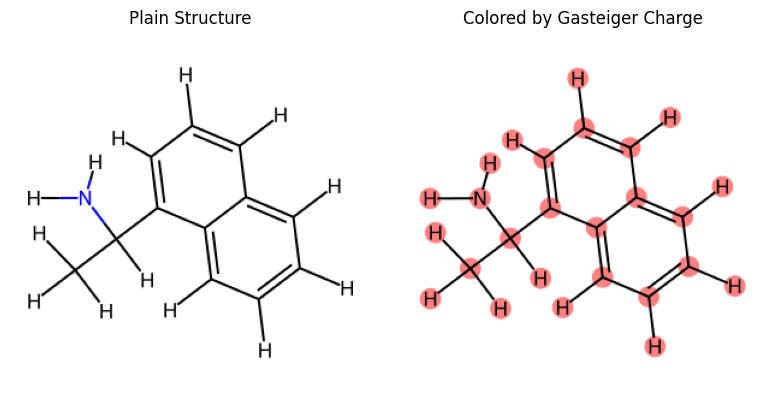

In [ ]:
import torch
import matplotlib.pyplot as plt
from rdkit import Chem
from rdkit.Chem import AllChem, Draw
import pandas as pd

# Load graphs
graphs = torch.load("combined_graphs.pt", weights_only=False)

# Select a molecule to visualize
data = graphs[8]
smiles = data.smiles

# Create RDKit molecule and compute 2D coords
mol = Chem.AddHs(Chem.MolFromSmiles(smiles))
AllChem.Compute2DCoords(mol)

# 1) Plain molecule drawing
img_plain = Draw.MolToImage(mol, size=(300, 300))

# 2) Molecule with node encoding color (Gasteiger charge feature at index 21)
# Extract feature vector for each atom
features = data.x[:, 21].numpy()  # index 21 is Gasteiger charge
# Normalize to [0,1]
norm = (features - features.min()) / (features.max() - features.min() + 1e-8)

# Map normalized values to colors
cmap = plt.get_cmap('coolwarm')
atom_colors = {i: cmap(norm[i])[:3] for i in range(len(norm))}

# Draw with highlight colors
img_colored = Draw.MolToImage(
    mol,
    size=(300, 300),
    highlightAtoms=list(atom_colors.keys()),
    highlightAtomColors=atom_colors
)

# Display side by side
fig, axs = plt.subplots(1, 2, figsize=(8, 4))
axs[0].imshow(img_plain)
axs[0].axis('off')
axs[0].set_title("Plain Structure")

axs[1].imshow(img_colored)
axs[1].axis('off')
axs[1].set_title("Colored by Gasteiger Charge")

plt.tight_layout()
plt.show()


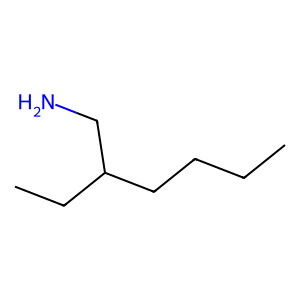

In [ ]:
from rdkit import Chem
from rdkit.Chem import AllChem, Draw

# pick your SMILES
smiles = "CCCCC(CC)CN"   # example
# build molecule without adding explicit H’s
mol = Chem.MolFromSmiles(smiles)
# generate 2D coords
AllChem.Compute2DCoords(mol)

# now draw plain heavy‐atom structure
img = Draw.MolToImage(mol, size=(300,300))
img


In [ ]:
pip install  gpytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 277.7/277.7 kB 14.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.3/176.3 kB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.4/55.4 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 100.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 86.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 44.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 40.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 17.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import gpytorch

In [ ]:
import pickle

In [ ]:
graphs      = torch.load('/content/combined_graphs.pt', weights_only=False)
NODE_DIM    = graphs[0].x.size(1)          # ← already in your code
EDGE_DIM    = graphs[0].edge_attr.size(1)  # ← new:  size of eattr vector
GLOBAL_DIM  = graphs[0].u.size(-1)         #  ...


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Example function to add logging and metric tracking to active learning loop
def initialize_metric_storage(task_names):
    return {t: {'r2': [], 'rmse': []} for t in task_names}, []

def update_metric_storage(metrics, losses, metric_log, loss_log):
    for task, values in metrics.items():
        for k in values:
            metric_log[task][k].append(values[k])
    loss_log.append(losses)

def plot_metrics(metric_log, loss_log, task_names):
    fig, axs = plt.subplots(len(task_names), 2, figsize=(12, len(task_names)*2.5))
    for i, task in enumerate(task_names):
        axs[i,0].plot(metric_log[task]['r2'])
        axs[i,0].set_title(f'{task} R2')
        axs[i,0].set_xlabel("Iteration")
        axs[i,0].set_ylabel("R2")

        axs[i,1].plot(metric_log[task]['rmse'])
        axs[i,1].set_title(f'{task} RMSE')
        axs[i,1].set_xlabel("Iteration")
        axs[i,1].set_ylabel("RMSE")
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(6,4))
    plt.plot(loss_log, marker='o')
    plt.title("Mean NLL Loss per Iteration")
    plt.xlabel("Iteration")
    plt.ylabel("NLL Loss")
    plt.grid(True)
    plt.show()


In [ ]:
TASK_NAMES = [
    "band_gap", "homo", "lumo", "dipole_moment", "TPSA",
    "n_rings", "NumHDonors", "NumHAcceptors", "n_conj",
    "avg_en", "rotatable_bonds", "surface_area", "molar_refractivity"
]

MODEL_CFG = dict(
    hidden=256, layers=4, dropout=0.20, lr=1e-3,
    batch=32, epochs=200, patience=30
)

AL_CFG = dict(
    n_iter=25, acq_batch=250,
    init_ratio=0.05, min_init=10,
    perov_frac=0.10
)


In [ ]:
class GNNEncoder(torch.nn.Module):
    def __init__(self, in_dim, hidden, layers, dropout, edge_dim):
        super().__init__()
        self.node_emb = torch.nn.Linear(in_dim, hidden)
        self.convs = torch.nn.ModuleList()
        self.dropout = dropout
        for _ in range(layers):
            mlp = torch.nn.Sequential(
                torch.nn.Linear(hidden, hidden), torch.nn.ReLU(),
                torch.nn.Linear(hidden, hidden)
            )
            self.convs.append(GINEConv(mlp, edge_dim=edge_dim))

    def forward(self, data):
        x, ei, ea, batch = data.x, data.edge_index, data.edge_attr, data.batch
        h = self.node_emb(x)
        for conv in self.convs:
            h = conv(h, ei, ea)
            h = F.relu(h)
            h = F.dropout(h, p=self.dropout, training=self.training)
        return global_mean_pool(h, batch)


In [ ]:
class SparseGP(gpytorch.models.ApproximateGP):
    def __init__(self, latent_dim, num_inducing=128):
        inducing = torch.randn(num_inducing, latent_dim)
        variational_dist = gpytorch.variational.CholeskyVariationalDistribution(num_inducing)
        variational_strat = gpytorch.variational.VariationalStrategy(
            self, inducing, variational_dist, learn_inducing_locations=True)
        super().__init__(variational_strat)
        self.mean_module  = gpytorch.means.ConstantMean()
        self.covar_module = gpytorch.kernels.ScaleKernel(
            gpytorch.kernels.RBFKernel(ard_num_dims=latent_dim))

    def forward(self, x):
        return gpytorch.distributions.MultivariateNormal(
            self.mean_module(x), self.covar_module(x))


In [ ]:
class MultiTaskGP(torch.nn.Module):
    def __init__(self, in_node_dim, global_dim, edge_dim, cfg):
        super().__init__()
        self.encoder = GNNEncoder(in_node_dim, cfg['hidden'], cfg['layers'], cfg['dropout'], edge_dim)
        self.latent_dim = cfg['hidden'] + global_dim
        self.gps = torch.nn.ModuleList([SparseGP(self.latent_dim) for _ in TASK_NAMES])
        self.likelihoods = torch.nn.ModuleList([gpytorch.likelihoods.GaussianLikelihood() for _ in TASK_NAMES])

    def forward(self, data):
        h = self.encoder(data)
        u = data.u.squeeze(1)
        z = torch.cat([h, u], dim=-1)
        z = F.layer_norm(z, z.shape[-1:])
        return [gp(z) for gp in self.gps]

    def predict(self, data):
        self.eval()
        with torch.no_grad():
            mvns = self(data)
            means = torch.stack([mvn.mean for mvn in mvns], dim=-1)
            var   = torch.stack([mvn.variance for mvn in mvns], dim=-1)
        return means, var


In [ ]:
scalers = {t: StandardScaler() for t in TASK_NAMES}

def normalise_targets(graphs, idx):
    y = torch.cat([graphs[i].y for i in idx]).numpy()
    for c, t in enumerate(TASK_NAMES):
        scalers[t].fit(y[:, c:c+1])

def nll(outputs, y):
    """∑i −log p(y_i | GP_i)  with target standardised."""
    loss = 0.
    for i, (out, lik) in enumerate(zip(outputs, model.likelihoods)):
        yi = y[:, i:i+1]  # tensor already
        # standardize but keep as torch tensor on correct device
        yi_std = torch.tensor(scalers[TASK_NAMES[i]].transform(yi.cpu().numpy()),
                              dtype=torch.float32, device=yi.device).squeeze()
        loss += -lik(out).log_prob(yi_std)
    return loss / y.size(0)


In [ ]:
import torch
from torch_geometric.data.data import DataEdgeAttr
from sklearn.model_selection import train_test_split

# Allowlist the custom class so torch.load works
torch.serialization.add_safe_globals([DataEdgeAttr])

# Load your graphs (make sure weights_only=False)
graphs = torch.load('combined_graphs.pt', weights_only=False, map_location='cpu')

# Split data into initial training, pool, and a fixed test set
# We will split the original graphs into 80% for AL pool and initial training, 20% for testing
train_pool_indices, test_indices = train_test_split(
    list(range(len(graphs))),
    test_size=0.2,
    random_state=42, # for reproducibility
    shuffle=True # ensure a mix of perov/non-perov if possible, though the data is already mixed
)

In [ ]:
from sklearn.preprocessing import StandardScaler
import torch
torch.serialization.add_safe_globals([StandardScaler])


In [ ]:
import torch
import torch.nn.functional as F
import gpytorch
from torch_geometric.data import DataLoader
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.cluster import MiniBatchKMeans
import numpy as np
import random
import os
import pickle
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

def active_learning(model, graphs, device, cfg, scalers, TASK_NAMES, MODEL_CFG,
                    test_indices, train_pool_indices, resume_path=None):
    model = model.to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=MODEL_CFG['lr'])

    test_history = {t: {'r2': [], 'rmse': []} for t in TASK_NAMES}
    train_loss_log = []
    start_iter = 0

    if resume_path is not None and os.path.exists(resume_path):
        checkpoint = torch.load(
    resume_path,
    map_location=device,
    weights_only=False)

        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        train = checkpoint['train_indices']
        pool = checkpoint['pool_indices']
        test_history = checkpoint['test_history']
        train_loss_log = checkpoint['train_loss_log']
        start_iter = checkpoint['iteration'] + 1
        print(f" Resuming from iteration {start_iter}")
    else:
        perov_train_pool = [i for i in train_pool_indices if getattr(graphs[i], 'is_perov', False)]
        nonp_train_pool = [i for i in train_pool_indices if i not in perov_train_pool]
        N0 = max(cfg['min_init'], int(cfg['init_ratio'] * len(train_pool_indices)))
        init_train = random.sample(perov_train_pool, min(int(cfg['perov_frac'] * N0), len(perov_train_pool))) + \
                     random.sample(nonp_train_pool, min(N0 - int(cfg['perov_frac'] * N0), len(nonp_train_pool)))
        train = init_train
        pool = [i for i in train_pool_indices if i not in init_train]

    for it in range(start_iter, cfg['n_iter']):
        print(f"\n=== Active Learning Iteration {it+1}/{cfg['n_iter']} ===")
        y_train = torch.cat([graphs[i].y for i in train]).numpy()
        for c, t in enumerate(TASK_NAMES):
            scalers[t].fit(y_train[:, c:c+1])

        random.shuffle(train)
        val_split_size = max(1, int(0.2 * len(train)))
        val_sub = train[:val_split_size]
        train_sub = train[val_split_size:]
        if not train_sub:
            print(f"Warning: train_sub is empty in iteration {it+1}. Skipping training.")
            continue

        best_val_rmse = float('inf')
        patience = 0
        epoch_losses = []

        for epoch in range(MODEL_CFG['epochs']):
            model.train()
            for lik in model.likelihoods:
                lik.train()
            loader = DataLoader([graphs[i] for i in train_sub], batch_size=MODEL_CFG['batch'], shuffle=True)
            epoch_loss = 0.
            for batch in loader:
                batch = batch.to(device)
                optimizer.zero_grad()
                outs = model(batch)
                yb = batch.y.squeeze(1).to(device)
                loss = 0.
                for i, (out, lik) in enumerate(zip(outs, model.likelihoods)):
                    yi = yb[:, i:i+1]
                    yi_std = torch.tensor(scalers[TASK_NAMES[i]].transform(yi.cpu().numpy()),
                                          dtype=torch.float32, device=yi.device).squeeze()
                    loss += -lik(out).log_prob(yi_std)
                loss = loss / yb.size(0)
                loss.backward()
                optimizer.step()
                epoch_loss += loss.detach().cpu().item()
            epoch_losses.append(epoch_loss / len(loader))

            model.eval()
            for lik in model.likelihoods:
                lik.eval()
            with torch.no_grad():
                val_preds, val_targets = [], []
                for batch in DataLoader([graphs[i] for i in val_sub], batch_size=256):
                    batch = batch.to(device)
                    pred, _ = model.predict(batch)
                    val_preds.append(pred.cpu())
                    val_targets.append(batch.y.squeeze(1).cpu())
                val_preds_std = torch.cat(val_preds)
                val_targets = torch.cat(val_targets)
                val_preds_unscaled = np.zeros_like(val_preds_std)
                for i, t in enumerate(TASK_NAMES):
                    val_preds_unscaled[:, i] = scalers[t].inverse_transform(val_preds_std[:, i:i+1]).squeeze()
                val_rmse = np.mean([
                    np.sqrt(mean_squared_error(val_targets[:, i].numpy(), val_preds_unscaled[:, i]))
                    for i in range(len(TASK_NAMES))
                ])
            if val_rmse < best_val_rmse:
                best_val_rmse = val_rmse
                patience = 0
            else:
                patience += 1
            if patience > MODEL_CFG['patience']:
                print(f"  Early stopping at epoch {epoch+1} (val RMSE: {val_rmse:.4f})")
                break

        train_loss_log.append(np.mean(epoch_losses))

        model.eval()
        for lik in model.likelihoods:
            lik.eval()
        with torch.no_grad():
            test_preds, test_targets = [], []
            for batch in DataLoader([graphs[i] for i in test_indices], batch_size=256):
                batch = batch.to(device)
                pred, _ = model.predict(batch)
                test_preds.append(pred.cpu())
                test_targets.append(batch.y.squeeze(1).cpu())
            test_preds_std = torch.cat(test_preds)
            test_targets = torch.cat(test_targets)
            test_preds_unscaled = np.zeros_like(test_preds_std)
            for i, t in enumerate(TASK_NAMES):
                test_preds_unscaled[:, i] = scalers[t].inverse_transform(test_preds_std[:, i:i+1]).squeeze()
            print("  Test Metrics:")
            for i, t in enumerate(TASK_NAMES):
                y_true = test_targets[:, i].numpy()
                y_pred = test_preds_unscaled[:, i]
                r2 = r2_score(y_true, y_pred)
                rmse = np.sqrt(mean_squared_error(y_true, y_pred))
                test_history[t]['r2'].append(r2)
                test_history[t]['rmse'].append(rmse)
                print(f"    {t:20s} | Test R2: {r2:.3f} | Test RMSE: {rmse:.3f}")

        if not pool:
            print("Pool is empty. Stopping active learning.")
            break

        z_pool, vars = [], []
        model.eval()
        for lik in model.likelihoods:
            lik.eval()
        with torch.no_grad():
            pool_loader = DataLoader([graphs[i] for i in pool], batch_size=256)
            for b in pool_loader:
                b = b.to(device)
                h = model.encoder(b)
                z = torch.cat([h, b.u.squeeze(1)], -1)
                z = F.layer_norm(z, z.shape[-1:])
                _, v = model.predict(b)
                z_pool.append(z.cpu())
                vars.append(v.mean(1).cpu())
        z_pool = torch.cat(z_pool).numpy()
        vars = torch.cat(vars).numpy()
        acq_size = min(cfg['acq_batch'], len(pool))
        km = MiniBatchKMeans(n_clusters=acq_size, random_state=42, n_init=10).fit(z_pool)
        sel_indices_in_pool = []
        for c in range(km.n_clusters):
            cluster_indices = np.where(km.labels_ == c)[0]
            if len(cluster_indices) == 0:
                continue
            max_var_idx_in_cluster_indices = cluster_indices[vars[cluster_indices].argmax()]
            sel_indices_in_pool.append(pool[max_var_idx_in_cluster_indices])
        new_ids = sel_indices_in_pool
        train.extend(new_ids)
        pool = [i for i in pool if i not in new_ids]
        print(f"Iter {it+1}: added {len(new_ids)} molecules. Train size: {len(train)}, Pool size: {len(pool)}")

        # Save checkpoint after each iteration
        checkpoint = {
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'model_cfg': MODEL_CFG,
            'al_cfg': cfg,
            'task_names': TASK_NAMES,
            'scalers': scalers,
            'train_indices': train,
            'pool_indices': pool,
            'test_indices': test_indices,
            'test_history': test_history,
            'train_loss_log': train_loss_log,
            'iteration': it
        }
        torch.save(checkpoint, f"checkpoint_iter_{it}.pt")
        print(f" Saved checkpoint for iteration {it} to checkpoint_iter_{it}.pt")

    torch.save({
        'model_state_dict': model.state_dict(),
        'model_cfg': MODEL_CFG,
        'al_cfg': cfg,
        'task_names': TASK_NAMES,
        'scalers': scalers,
        'train_indices': train,
        'test_indices': test_indices,
        'test_history': test_history,
        'train_loss_log': train_loss_log
    }, "final_gnn_gp_model.pt")
    print(" Saved complete model and state to final_gnn_gp_model.pt")
    return model, test_history, train, scalers, train_loss_log

def plot_al_metrics(test_history, train_loss_log, task_names):
    fig, axs = plt.subplots(len(task_names), 2, figsize=(12, len(task_names)*2.5))
    for i, task in enumerate(task_names):
        axs[i,0].plot(test_history[task]['r2'])
        axs[i,0].set_title(f'{task} Test R2')
        axs[i,0].set_xlabel("Iteration")
        axs[i,0].set_ylabel("R2")
        axs[i,1].plot(test_history[task]['rmse'])
        axs[i,1].set_title(f'{task} Test RMSE')
        axs[i,1].set_xlabel("Iteration")
        axs[i,1].set_ylabel("RMSE")
    plt.tight_layout()
    plt.show()
    plt.figure(figsize=(6,4))
    plt.plot(train_loss_log, marker='o')
    plt.title("Mean Training Loss per Iteration")
    plt.xlabel("Active Learning Iteration")
    plt.ylabel("Loss")
    plt.grid(True)
    plt.show()

In [ ]:
import torch

# Step 1: Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Step 2: Infer graph input dimensions
in_node_dim = graphs[0].x.size(1)
global_dim = graphs[0].u.size(1)
edge_dim = graphs[0].edge_attr.size(1)

# Step 3: Initialize model (ensure MultiTaskGP is defined elsewhere)
model = MultiTaskGP(in_node_dim, global_dim, edge_dim, MODEL_CFG)

# Step 4: Choose whether to resume or start fresh
# To resume from a checkpoint (uncomment the following line and set the correct path)
resume_file = "/content/checkpoint_iter_19.pt"

In [ ]:


# Run active learning
model, test_history, train, scalers, train_loss_log = active_learning(
    model=model,
    graphs=graphs,
    device=device,
    cfg=AL_CFG,
    scalers=scalers,
    TASK_NAMES=TASK_NAMES,
    MODEL_CFG=MODEL_CFG,
    test_indices=test_indices,
    train_pool_indices=train_pool_indices,
    resume_path=resume_file  # Uncomment if resuming
)

# Step 5: Plot results
plot_al_metrics(test_history, train_loss_log, TASK_NAMES)


 Resuming from iteration 20

=== Active Learning Iteration 21/25 ===


KeyboardInterrupt: 

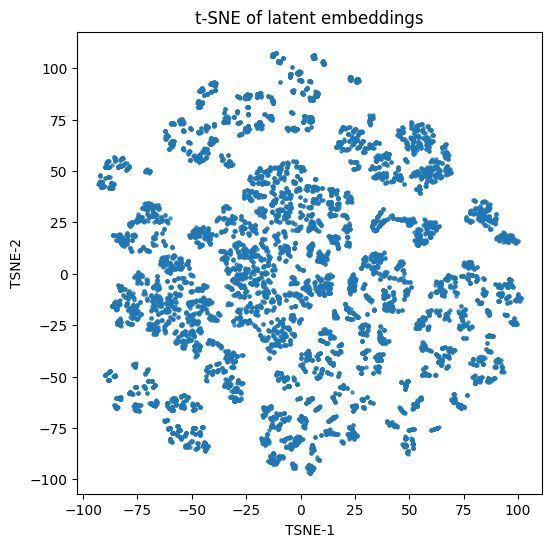

In [ ]:
import torch
from torch_geometric.data import DataLoader
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# 1. Re-instantiate your model exactly as before
model = MultiTaskGP(in_node_dim, global_dim, edge_dim, MODEL_CFG).to(device)

# 2. Load the checkpoint (using whatever safe-load fix you applied)
checkpoint = torch.load(resume_file, map_location=device, weights_only=False)
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()

# 3. Collect latent vectors for your dataset of interest
all_z = []
all_labels = []  # optional, e.g. perovskite vs non-perovskite or task error

loader = DataLoader(graphs, batch_size=256, shuffle=False)
with torch.no_grad():
    for batch in loader:
        batch = batch.to(device)
        # h = encoder output, u = global features
        h = model.encoder(batch)                         # shape: (B, latent_dim)
        u = batch.u.view(batch.u.size(0), -1)            # shape: (B, u_dim)
        z = torch.cat([h, u], dim=1)                     # shape: (B, latent_dim+u_dim)
        all_z.append(z.cpu())
        # all_labels.append(batch.y[:,0].cpu().numpy())  # if you want color-coding

all_z = torch.cat(all_z).numpy()  # shape: (N, D)

# 4. Run t-SNE on those N×D vectors
tsne = TSNE(
    n_components=2,
    perplexity=30,        # adjust between 5–50
    learning_rate='auto',
    init='random',
    random_state=42
)
z2d = tsne.fit_transform(all_z)

# 5. Plot
plt.figure(figsize=(6,6))
plt.scatter(z2d[:,0], z2d[:,1], s=5, alpha=0.7)
# if you have labels, you can do:
# plt.scatter(z2d[:,0], z2d[:,1], c=all_labels, cmap='tab10', s=5)
plt.title("t-SNE of latent embeddings")
plt.xlabel("TSNE-1")
plt.ylabel("TSNE-2")
plt.show()


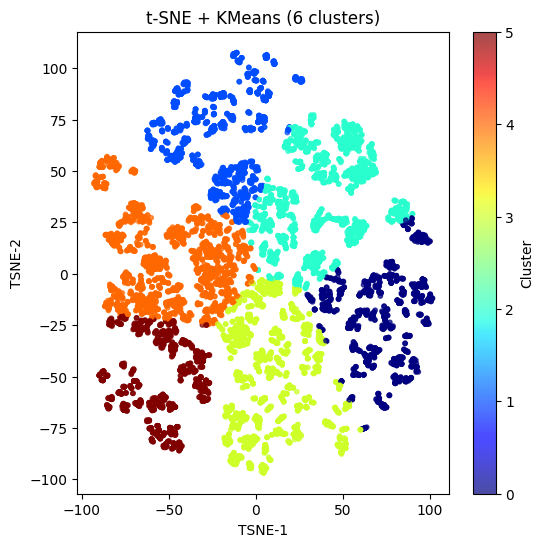

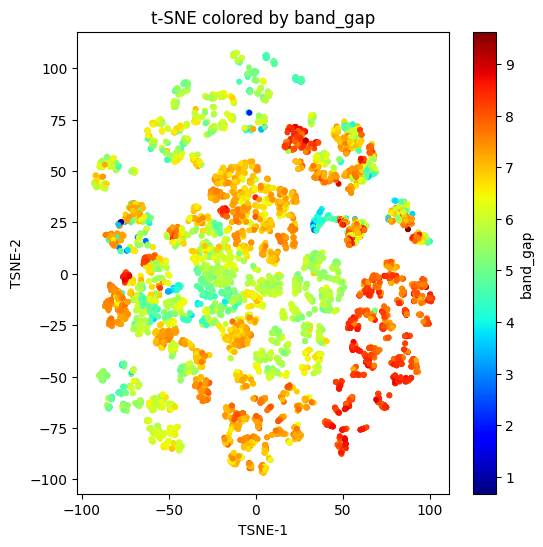

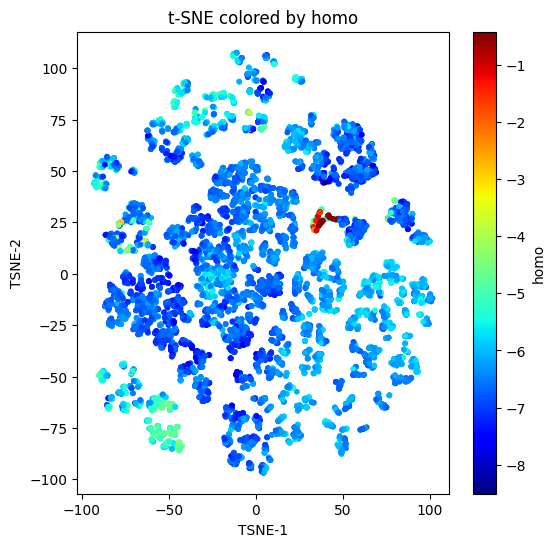

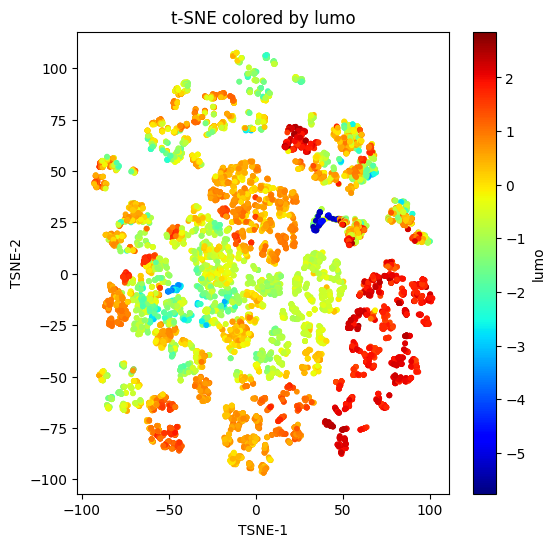

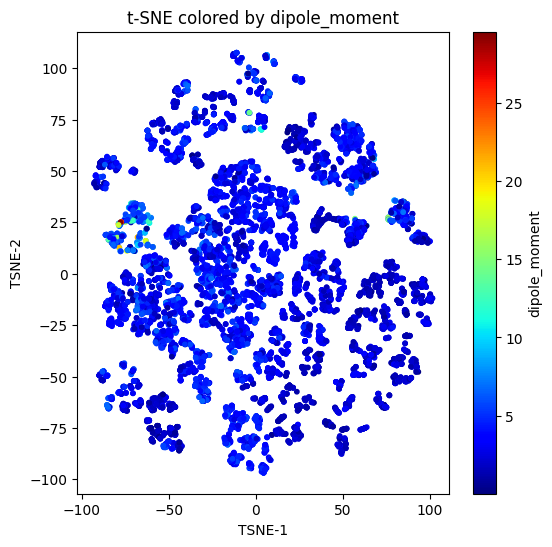

...

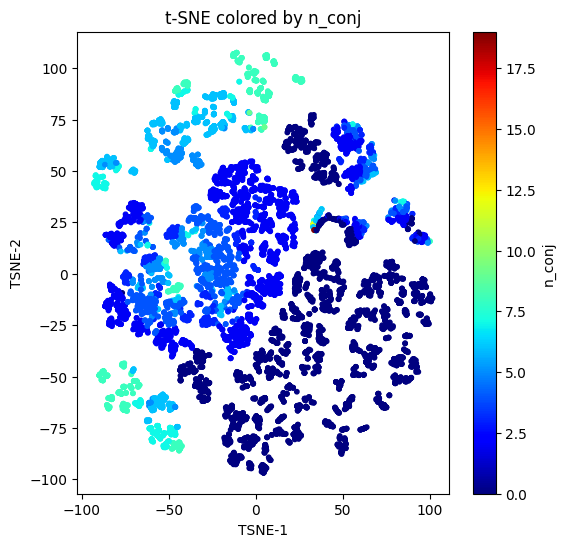

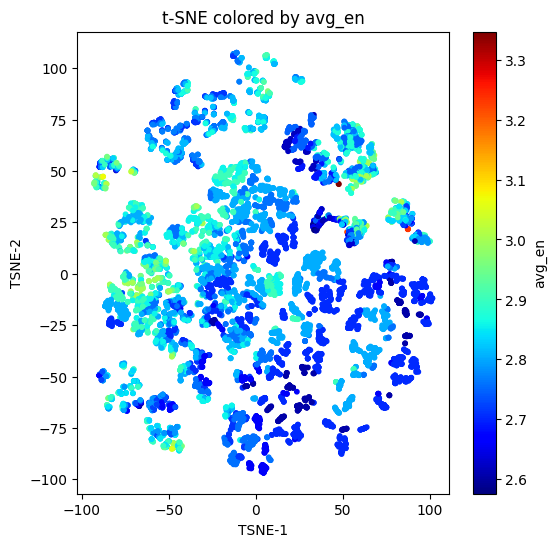

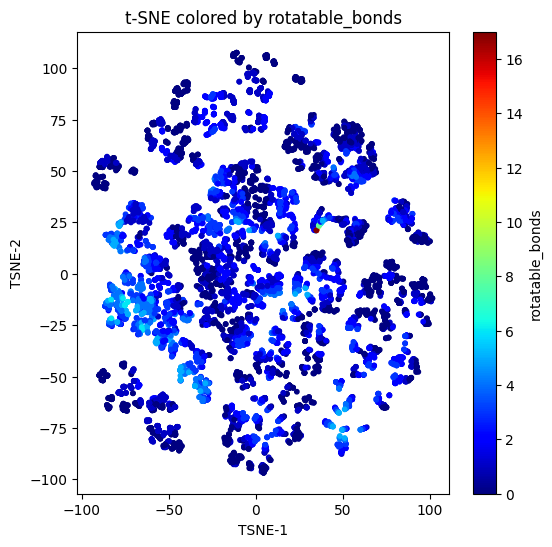

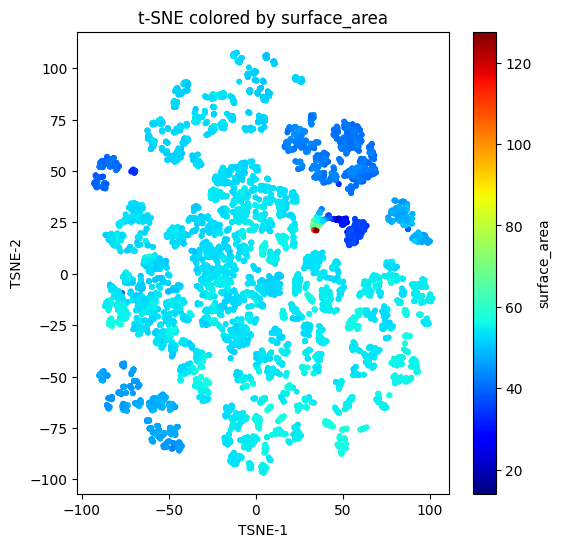

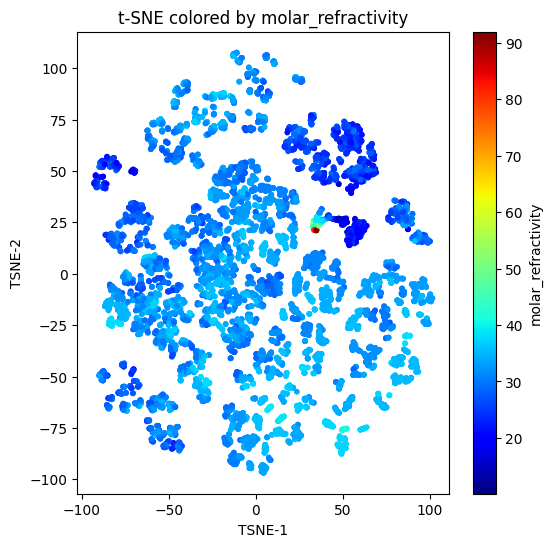

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# 1) k-means clustering on your 2D embedding
n_clusters = 6
km = KMeans(n_clusters=n_clusters, random_state=42)
clusters = km.fit_predict(z2d)

plt.figure(figsize=(6,6))
plt.scatter(z2d[:,0], z2d[:,1], c=clusters, cmap='jet', s=10, alpha=0.7)
plt.title(f"t-SNE + KMeans ({n_clusters} clusters)")
plt.xlabel("TSNE-1")
plt.ylabel("TSNE-2")
plt.colorbar(label="Cluster")
plt.show()

# 2) helper to grab each y-value
def get_target(name):
    idx = TASK_NAMES.index(name)
    return np.array([ g.y.squeeze()[idx].item() for g in graphs ])

# 3) loop through all tasks
for target in TASK_NAMES:
    vals = get_target(target)
    plt.figure(figsize=(6,6))
    plt.scatter(
        z2d[:,0], z2d[:,1],
        c=vals,
        cmap='jet',
        s=10
    )
    plt.title(f"t-SNE colored by {target}")
    plt.xlabel("TSNE-1")
    plt.ylabel("TSNE-2")
    plt.colorbar(label=target)
    plt.show()


Silhouette (2D t-SNE): 0.377
Silhouette (high-D latent): -0.061

Cluster summary:
         count  mean_TPSA  mean_HDonors  mean_HAcceptors
cluster                                                 
0         1892  42.981454      1.000000         2.327696
1         1489  38.866427      1.128946         2.333781
2         1750  32.366617      0.977714         2.180571
3         1786  59.038035      1.592945         2.683651
4         1522  58.589415      1.521682         2.875164
5         1667  48.336065      1.302340         2.343731


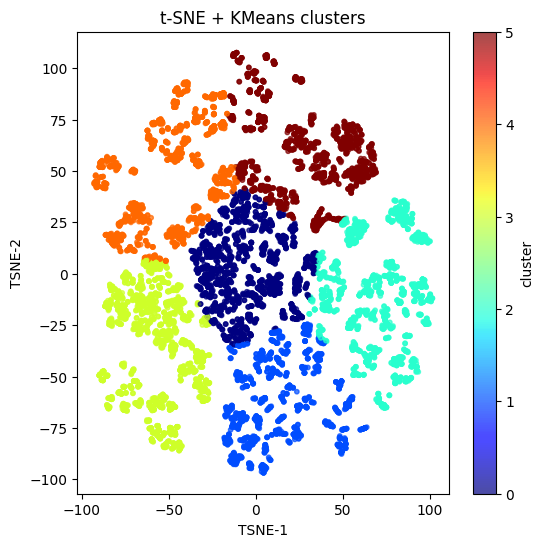

In [ ]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

# 1. k-means in the 2D embedding
n_clusters = 6
km = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
clusters = km.fit_predict(z2d)

# 2. silhouette scores
sil_2d = silhouette_score(z2d, clusters)
sil_hd = silhouette_score(all_z, clusters)
print(f"Silhouette (2D t-SNE): {sil_2d:.3f}")
print(f"Silhouette (high-D latent): {sil_hd:.3f}")

# 3. build summary table
def get_target(name):
    idx = TASK_NAMES.index(name)
    return np.array([ g.y.squeeze()[idx].item() for g in graphs ])

df = pd.DataFrame({
    'cluster': clusters,
    'TPSA': get_target('TPSA'),
    'NumHDonors': get_target('NumHDonors'),
    'NumHAcceptors': get_target('NumHAcceptors')
})

summary = df.groupby('cluster').agg(
    count=('cluster','size'),
    mean_TPSA=('TPSA','mean'),
    mean_HDonors=('NumHDonors','mean'),
    mean_HAcceptors=('NumHAcceptors','mean')
).sort_index()

# 4. display
print("\nCluster summary:")
print(summary)

# 5. optional: visualize 2D partition
plt.figure(figsize=(6,6))
plt.scatter(z2d[:,0], z2d[:,1], c=clusters, cmap='jet', s=10, alpha=0.7)
plt.title("t-SNE + KMeans clusters")
plt.xlabel("TSNE-1"); plt.ylabel("TSNE-2")
plt.colorbar(label="cluster")
plt.show()


In [ ]:
import torch
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans

# -- 1) Load graphs and allowlist DataEdgeAttr --
from torch_geometric.data.data import DataEdgeAttr
torch.serialization.add_safe_globals([DataEdgeAttr])
graphs = torch.load('combined_graphs.pt', weights_only=False, map_location='cpu')

# -- 2) Build DataFrame with all targets, perov flag, and SMILES/id --
targets = [
    "band_gap", "homo", "lumo", "dipole_moment", "TPSA",
    "n_rings", "NumHDonors", "NumHAcceptors", "n_conj",
    "avg_en", "rotatable_bonds", "surface_area", "molar_refractivity"
]

rows = []
for idx, g in enumerate(graphs):
    y = g.y.squeeze(0).numpy()
    entry = {t: float(y[i]) for i, t in enumerate(targets)}
    entry['is_perov']  = int(g.is_perov)
    entry['smiles']    = getattr(g, 'smiles', f"idx_{idx}")
    rows.append(entry)

df = pd.DataFrame(rows)

# -- 3) KMeans clustering on the raw target features --
n_clusters = 6
km = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
df['cluster'] = km.fit_predict(df[targets])

# -- 4) Compute min/max range per cluster for each target --
rng = df.groupby('cluster')[targets].agg(['min', 'max'])
rng.columns = [f"{t}_{agg}" for t, agg in rng.columns]

# -- 5) Pick a representative perovskite per cluster --
reps = {}
for c in sorted(df['cluster'].unique()):
    centroid = km.cluster_centers_[c]
    mask = (df.cluster == c) & (df.is_perov == 1)
    if mask.sum() > 0:
        feats = df.loc[mask, targets].values
        dists = np.linalg.norm(feats - centroid, axis=1)
        rep_idx = dists.argmin()
        reps[c] = df.loc[mask, 'smiles'].values[rep_idx]
    else:
        reps[c] = None

rep_df = pd.DataFrame.from_dict(reps, orient='index', columns=['rep_smiles'])
rep_df.index.name = 'cluster'

# -- 6) Count of perovskites in each cluster --
perov_counts = df.groupby('cluster')['is_perov'].sum().rename('perov_count')

# -- 7) Final summary table --
summary = pd.concat([rng, perov_counts, rep_df], axis=1).reset_index()




In [ ]:
print( summary[['cluster','rep_smiles']] )


   cluster          rep_smiles
0        0  C(CC[NH3+])CC(=O)O
1        1     C1CC(CCC1N)(F)F
2        2                None
3        3      CC1=C(OC=C1)CN
4        4            CCCCCCNC
5        5    C1=CC(=CC=C1CN)N


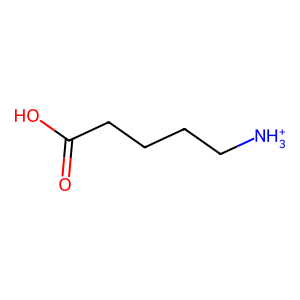

In [ ]:
from rdkit import Chem
from rdkit.Chem import AllChem, Draw

# pick your SMILES
smiles = "C(CC[NH3+])CC(=O)O"   # example
# build molecule without adding explicit H’s
mol = Chem.MolFromSmiles(smiles)
# generate 2D coords
AllChem.Compute2DCoords(mol)

# now draw plain heavy‐atom structure
img = Draw.MolToImage(mol, size=(300,300))
img


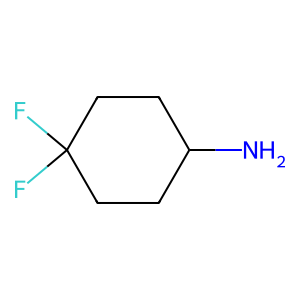

In [ ]:
from rdkit import Chem
from rdkit.Chem import AllChem, Draw

# pick your SMILES
smiles = "C1CC(CCC1N)(F)F"   # example
# build molecule without adding explicit H’s
mol = Chem.MolFromSmiles(smiles)
# generate 2D coords
AllChem.Compute2DCoords(mol)

# now draw plain heavy‐atom structure
img = Draw.MolToImage(mol, size=(300,300))
img


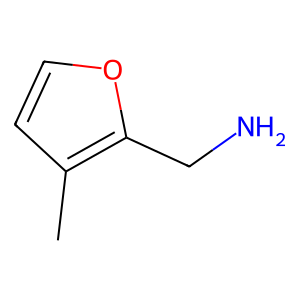

In [ ]:
from rdkit import Chem
from rdkit.Chem import AllChem, Draw

# pick your SMILES
smiles = "CC1=C(OC=C1)CN"   # example
# build molecule without adding explicit H’s
mol = Chem.MolFromSmiles(smiles)
# generate 2D coords
AllChem.Compute2DCoords(mol)

# now draw plain heavy‐atom structure
img = Draw.MolToImage(mol, size=(300,300))
img


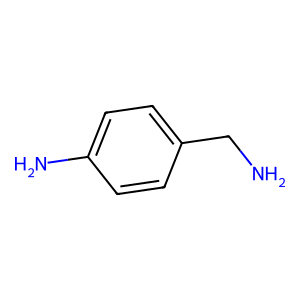

In [ ]:
from rdkit import Chem
from rdkit.Chem import AllChem, Draw

# pick your SMILES
smiles = "C1=CC(=CC=C1CN)N"   # example
# build molecule without adding explicit H’s
mol = Chem.MolFromSmiles(smiles)
# generate 2D coords
AllChem.Compute2DCoords(mol)

# now draw plain heavy‐atom structure
img = Draw.MolToImage(mol, size=(300,300))
img


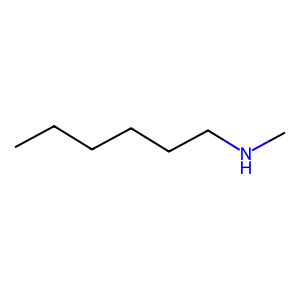

In [ ]:
from rdkit import Chem
from rdkit.Chem import AllChem, Draw

# pick your SMILES
smiles = "CCCCCCNC"   # example
# build molecule without adding explicit H’s
mol = Chem.MolFromSmiles(smiles)
# generate 2D coords
AllChem.Compute2DCoords(mol)

# now draw plain heavy‐atom structure
img = Draw.MolToImage(mol, size=(300,300))
img


In [ ]:
# the six you sent me:
sent_smiles = [
    "N1CCCCC1CCN",
    "C(=O)(O)CCCCCN",
    "CC1=CC=C(C=C1)CCN",
    "C(C[NH3+])C#N",
    "C1CCC(C1)[NH3+]",
    "CCCCCC(CC)CN"
]

for smi in sent_smiles:
    matches = df.index[df.smiles == smi].tolist()
    if matches:
        cid = int(df.loc[matches[0], 'cluster'])
        print(f"{smi}  → found in cluster {cid}")
    else:
        print(f"{smi}  → NOT in dataset")


N1CCCCC1CCN  → found in cluster 3
C(=O)(O)CCCCCN  → found in cluster 0
CC1=CC=C(C=C1)CCN  → found in cluster 1
C(C[NH3+])C#N  → found in cluster 5
C1CCC(C1)[NH3+]  → found in cluster 1
CCCCCC(CC)CN  → NOT in dataset


In [ ]:
targets = [
    "band_gap", "homo", "lumo", "dipole_moment", "TPSA",
    "n_rings", "NumHDonors", "NumHAcceptors", "n_conj",
    "avg_en", "rotatable_bonds", "surface_area", "molar_refractivity"
]
df = pd.DataFrame(rows, columns=targets + ['is_perov','smiles'])

rows = []
for idx, g in enumerate(graphs):
    y = g.y.squeeze(0).numpy()
    entry = {t: float(y[i]) for i, t in enumerate(targets)}
    entry['is_perov']  = int(g.is_perov)
    entry['smiles']    = getattr(g, 'smiles', f"idx_{idx}")
    rows.append(entry)

df = pd.DataFrame(rows)

# -- 3) KMeans clustering on the raw target features --
n_clusters = 6
km = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
df['cluster'] = km.fit_predict(df[targets])

# -- 4) Compute min/max range per cluster for each target --
rng = df.groupby('cluster')[targets].agg(['min', 'max'])
rng.columns = [f"{t}_{agg}" for t, agg in rng.columns]

# -- 5) Pick a representative perovskite per cluster --
reps = {}
for c in sorted(df['cluster'].unique()):
    centroid = km.cluster_centers_[c]
    mask = (df.cluster == c) & (df.is_perov == 1)
    if mask.sum() > 0:
        feats = df.loc[mask, targets].values
        dists = np.linalg.norm(feats - centroid, axis=1)
        rep_idx = dists.argmin()
        reps[c] = df.loc[mask, 'smiles'].values[rep_idx]
    else:
        reps[c] = None

rep_df = pd.DataFrame.from_dict(reps, orient='index', columns=['rep_smiles'])
rep_df.index.name = 'cluster'

# -- 6) Count of perovskites in each cluster --
perov_counts = df.groupby('cluster')['is_perov'].sum().rename('perov_count')

# -- 7) Final summary table --
summary = pd.concat([rng, perov_counts, rep_df], axis=1).reset_index()



In [ ]:
summary

,cluster,band_gap_min,band_gap_max,homo_min,homo_max,lumo_min,lumo_max,dipole_moment_min,dipole_moment_max,TPSA_min,...,avg_en_min,avg_en_max,rotatable_bonds_min,rotatable_bonds_max,surface_area_min,surface_area_max,molar_refractivity_min,molar_refractivity_max,perov_count,rep_smiles
0,0,0.669400,8.805605,-8.506279,-1.009000,-5.268200,1.945614,0.0007,29.556400,59.669998,...,2.713333,3.017500,0.0,6.0,23.580555,55.846294,12.762100,37.424099,4,C(CC[NH3+])CC(=O)O
1,1,2.558200,9.627388,-7.559323,-0.446900,-5.415600,2.538822,0.1354,7.658600,16.150000,...,2.575789,3.346667,0.0,16.0,14.079142,122.283157,10.111400,88.600403,66,C1CC(CCC1N)(F)F
2,2,2.141536,8.440972,-8.038243,-3.502105,-3.793267,1.863980,0.0024,22.960501,77.230003,...,2.767778,3.071429,0.0,5.0,33.095734,54.821243,16.126801,36.790501,0,None
3,3,3.662652,9.216496,-7.850485,-0.425300,-5.399800,2.566034,0.1178,15.164100,32.669998,...,2.599000,2.928333,0.0,17.0,29.969774,127.623047,17.854700,91.980797,18,CC1=C(OC=C1)CN
4,4,2.790000,9.039622,-6.753866,-0.440100,-4.876600,2.851753,0.1311,3.798000,3.010000,...,2.590833,3.232857,0.0,5.0,20.654055,96.176132,14.983700,65.239700,5,CCCCCCNC
5,5,3.428635,8.873633,-7.649121,-0.459400,-5.760200,2.244939,0.2050,15.951600,43.090000,...,2.639091,3.302857,0.0,8.0,18.240664,70.338570,10.251400,50.427799,13,C1=CC(=CC=C1CN)N


In [ ]:
import torch
from torch_geometric.data import DataLoader
from torch_geometric.data.data import DataEdgeAttr
from sklearn.cluster import KMeans
import numpy as np
import pandas as pd

# -- A) Load your graphs exactly as before --
torch.serialization.add_safe_globals([DataEdgeAttr])
graphs = torch.load('combined_graphs.pt', weights_only=False, map_location='cpu')

# -- B) Rebuild the model and load a specific checkpoint --
model = MultiTaskGP(
    in_node_dim=graphs[0].x.size(1),
    global_dim=graphs[0].u.size(1),
    edge_dim=graphs[0].edge_attr.size(1),
    cfg=MODEL_CFG
).to('cpu')

ckpt = torch.load('/content/checkpoint_iter_19.pt', map_location='cpu', weights_only=False)
model.load_state_dict(ckpt['model_state_dict'])
model.eval()

# -- C) Extract latent vectors z for every graph --
all_z = []
loader = DataLoader(graphs, batch_size=64, shuffle=False)
with torch.no_grad():
    for batch in loader:
        h = model.encoder(batch)                   # (B, hidden)
        u = batch.u.squeeze(1)                     # (B, global_dim)
        z = torch.cat([h, u], dim=1)               # (B, latent_dim)
        z = torch.nn.functional.layer_norm(z, z.shape[-1:])
        all_z.append(z.cpu().numpy())

Z = np.vstack(all_z)  # shape (N_graphs, latent_dim)

# -- D) Cluster those embeddings --
km = KMeans(n_clusters=6, random_state=42, n_init=10)
labels = km.fit_predict(Z)

# -- E) Find perov medoids in z-space --
# Build a DataFrame to link each index → is_perov, smiles
df = pd.DataFrame({
    'cluster': labels,
    'is_perov': [int(getattr(g, 'is_perov', False)) for g in graphs],
    'smiles':   [getattr(g, 'smiles', f"idx_{i}")        for i,g in enumerate(graphs)]
})

medoids = {}
for c in range(6):
    mask = (df.cluster==c) & (df.is_perov==1)
    if mask.any():
        pts = Z[mask.values]                          # filter z rows
        centroid = km.cluster_centers_[c]
        dists = np.linalg.norm(pts - centroid, axis=1)
        # pick the index in Z closest to centroid
        medoid_idx = np.where(mask)[0][dists.argmin()]
        medoids[c] = df.smiles.iloc[medoid_idx]
    else:
        medoids[c] = None

print("Medoid perovskites at iteration 5:", medoids)


Medoid perovskites at iteration 5: {0: 'CCCNCC1=CC=CC=C1', 1: 'C1=CC=C(C(=C1)CCN)Br', 2: 'C(CCC)NC1=C(C=C(C=C1)Br)Br', 3: None, 4: 'C(CN)CBr', 5: None}


In [ ]:
# === Colab Cell: Cluster “medoid” perovskites from raw GP latents ===

import torch
from torch_geometric.data import DataLoader
from torch_geometric.data.data import DataEdgeAttr
from sklearn.cluster import KMeans
import numpy as np
import pandas as pd

# 1) allowlist & load your combined graphs
torch.serialization.add_safe_globals([DataEdgeAttr])
graphs = torch.load('combined_graphs.pt', weights_only=False, map_location='cpu')

# 2) rebuild your model and load the checkpoint you want (e.g. iteration 19)
model = MultiTaskGP(
    in_node_dim=graphs[0].x.size(1),
    global_dim=graphs[0].u.size(1),
    edge_dim=graphs[0].edge_attr.size(1),
    cfg=MODEL_CFG
).to('cpu')

ckpt = torch.load('/content/checkpoint_iter_19.pt', map_location='cpu', weights_only=False)
model.load_state_dict(ckpt['model_state_dict'])
model.eval()

# 3) extract raw latent Z for every graph
all_z = []
loader = DataLoader(graphs, batch_size=64, shuffle=False)
with torch.no_grad():
    for batch in loader:
        h = model.encoder(batch)                  # (B, hidden)
        u = batch.u.squeeze(1)                    # (B, global_dim)
        z = torch.cat([h, u], dim=1)              # (B, latent_dim)
        z = torch.nn.functional.layer_norm(z, z.shape[-1:])
        all_z.append(z.cpu().numpy())
Z = np.vstack(all_z)  # shape (N_graphs, latent_dim)

# 4) run KMeans in latent space
n_clusters = 7
km = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
labels = km.fit_predict(Z)

# 5) build a DataFrame and pick perovskite medoids
df = pd.DataFrame({
    'cluster':  labels,
    'is_perov': [int(getattr(g, 'is_perov', False)) for g in graphs],
    'smiles':   [getattr(g, 'smiles', f"idx_{i}")    for i,g in enumerate(graphs)]
})

medoids = {}
for c in range(n_clusters):
    mask = (df.cluster==c) & (df.is_perov==1)
    if mask.any():
        feats = Z[mask.values]
        centroid = km.cluster_centers_[c]
        dists = np.linalg.norm(feats - centroid, axis=1)
        idx = np.where(mask)[0][dists.argmin()]
        medoids[c] = df.smiles.iloc[idx]
    else:
        medoids[c] = None

# 6) display results
print("Perovskite medoids by cluster:")
for c, smi in medoids.items():
    print(f"  Cluster {c}: {smi}")


Perovskite medoids by cluster:
  Cluster 0: CCCNCC1=CC=CC=C1
  Cluster 1: C1=CC=C(C(=C1)CCN)Br
  Cluster 2: C(CCC)NC1=C(C=C(C=C1)Br)Br
  Cluster 3: None
  Cluster 4: C(CN)CBr
  Cluster 5: None


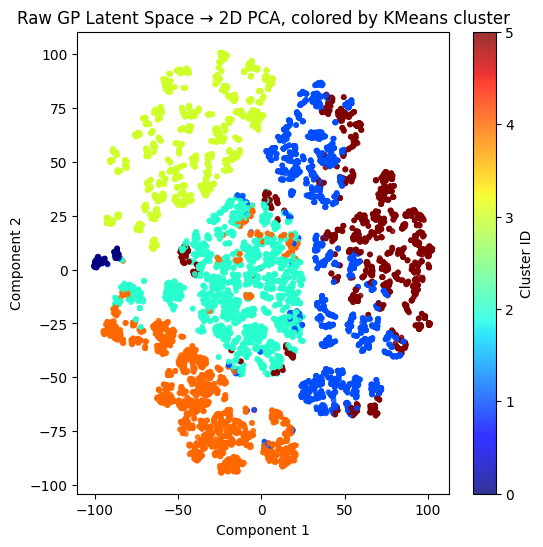

In [ ]:
# === Colab Cell: Plot raw-latent clusters ===

from sklearn.decomposition import PCA
# alternatively: from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Z is your (N_graphs, latent_dim) array, labels is length-N array of cluster IDs

# 1) Reduce to 2D (PCA)
#pca = PCA(n_components=2, random_state=42)
#Z2d = pca.fit_transform(Z)

# If you prefer t-SNE, comment out PCA above and uncomment below:
tsne = TSNE(n_components=2, perplexity=30, init='random', random_state=42)
Z2d = tsne.fit_transform(Z)

# 2) Scatter plot colored by cluster
plt.figure(figsize=(6,6))
plt.scatter(
    Z2d[:,0], Z2d[:,1],
    c=labels,
    cmap='jet',
    s=10,
    alpha=0.8
)
plt.title("Raw GP Latent Space → 2D PCA, colored by KMeans cluster")
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.colorbar(label="Cluster ID")
plt.show()


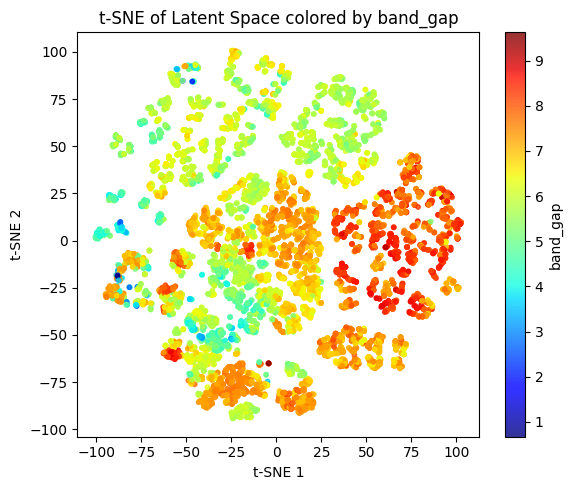

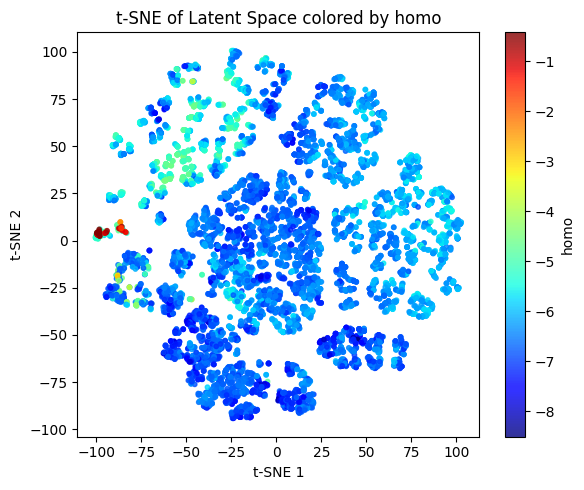

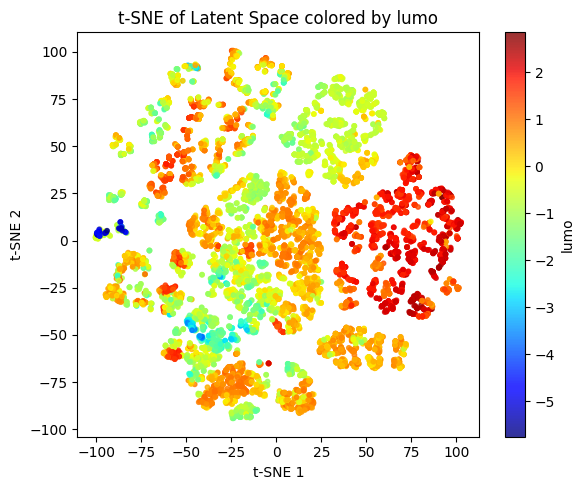

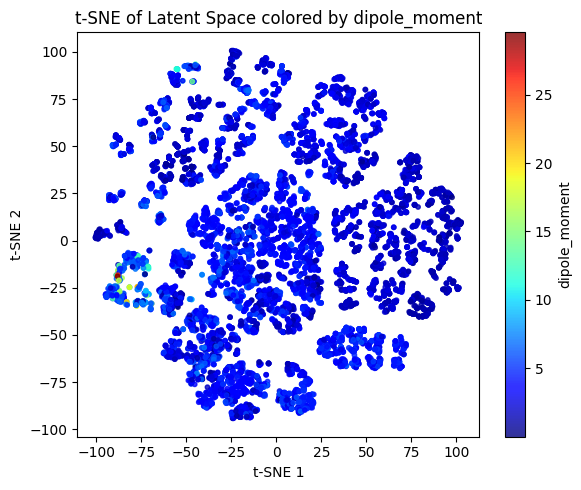

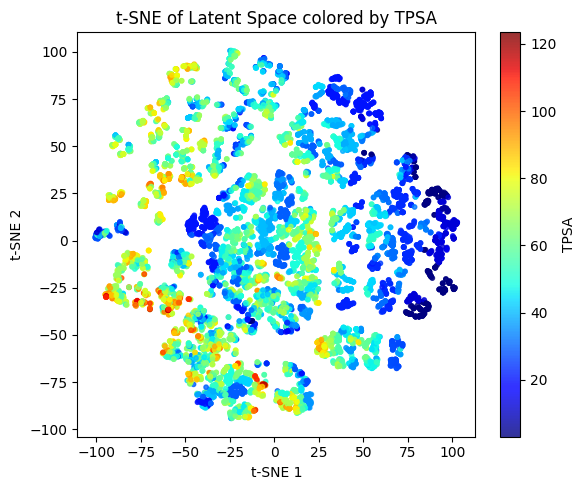

...

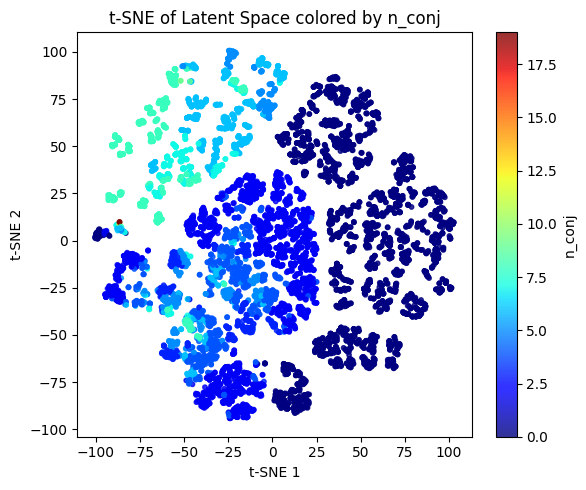

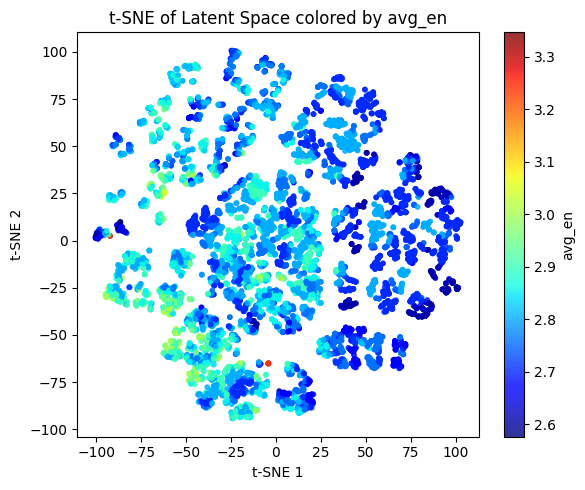

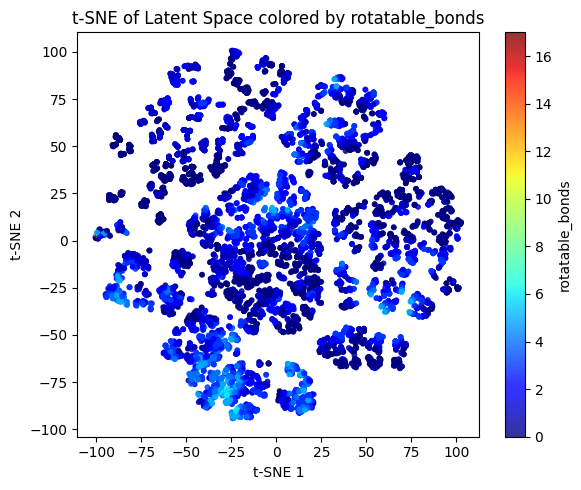

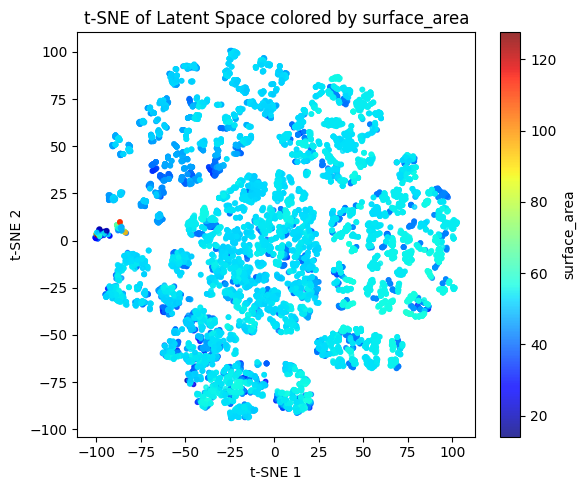

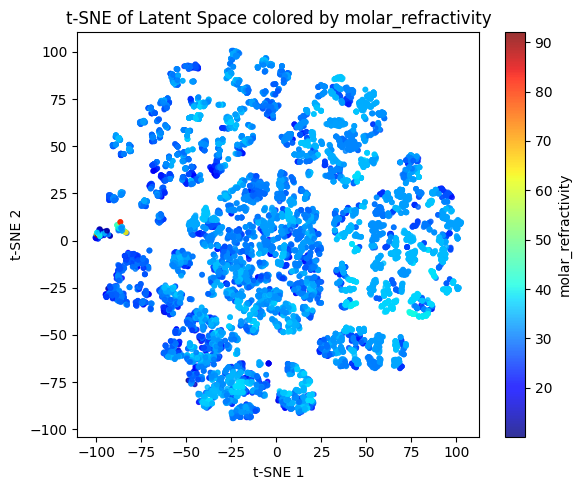

In [ ]:
# Colab Cell: 2D t-SNE of raw latent space, colored by each target

import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Assume Z (N×D latent array), df (DataFrame with target columns), and TASK_NAMES are defined

# 1) Reduce Z to 2D via t-SNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate='auto',
            init='random', random_state=42)
Z2d = tsne.fit_transform(Z)

# 2) Plot for each target
for target in TASK_NAMES:
    vals = df[target].values  # numeric array length N
    plt.figure(figsize=(6,5))
    sc = plt.scatter(
        Z2d[:, 0], Z2d[:, 1],
        c=vals,
        cmap='jet',
        s=10,
        alpha=0.8
    )
    plt.title(f"t-SNE of Latent Space colored by {target}")
    plt.xlabel("t-SNE 1")
    plt.ylabel("t-SNE 2")
    cbar = plt.colorbar(sc)
    cbar.set_label(target)
    plt.tight_layout()
    plt.show()


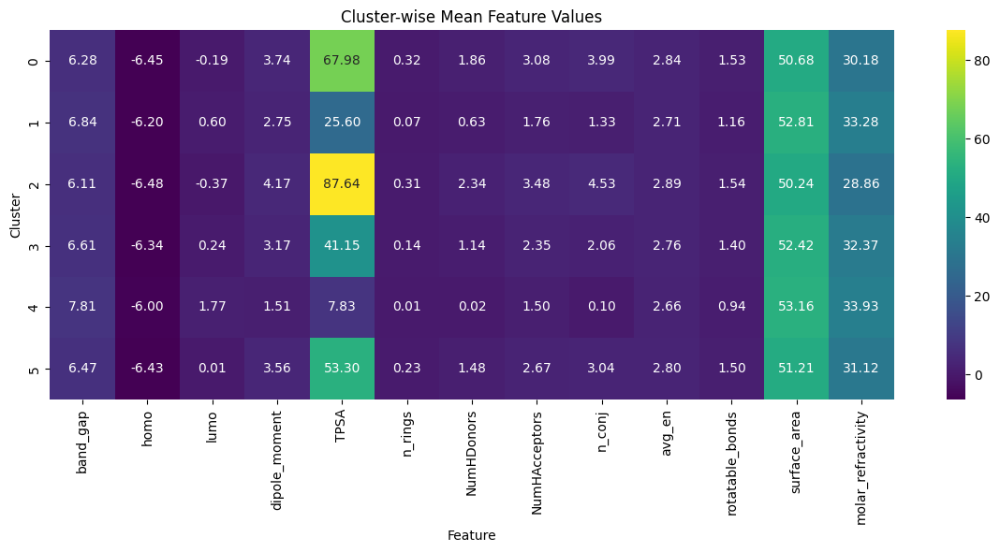

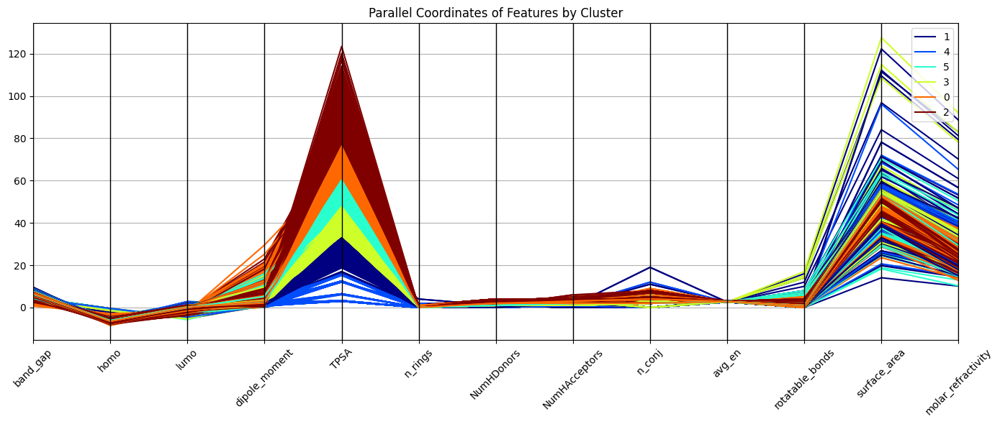

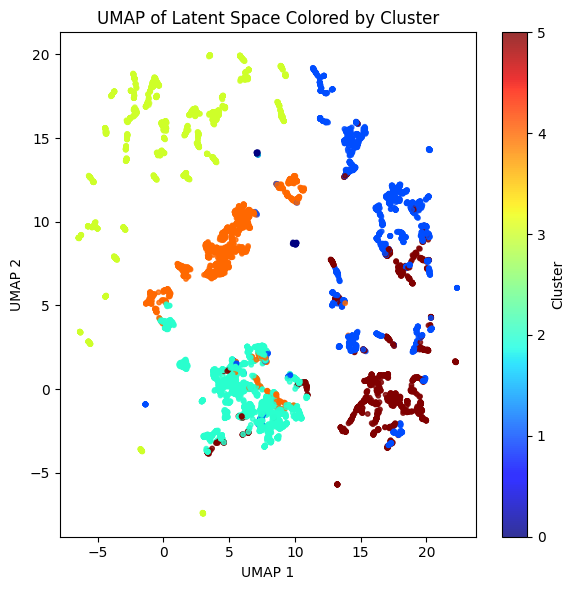

In [ ]:
# Colab Cell: Additional visualizations for 13 tasks

import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import parallel_coordinates
import umap

# Assume df (with TASK_NAMES columns and 'cluster'), Z (latent array), labels are defined

# 1) Heatmap of cluster-centroid means
cluster_means = df.groupby('cluster')[TASK_NAMES].mean()
plt.figure(figsize=(12, 6))
sns.heatmap(cluster_means, annot=True, fmt=".2f", cmap='viridis')
plt.title("Cluster-wise Mean Feature Values")
plt.xlabel("Feature")
plt.ylabel("Cluster")
plt.tight_layout()
plt.show()


# 2) Parallel coordinates plot for cluster profiles
plt.figure(figsize=(14, 6))
parallel_coordinates(
    df[['cluster'] + TASK_NAMES],
    class_column='cluster',
    cols=TASK_NAMES,
    color=plt.cm.jet(np.linspace(0, 1, len(cluster_means)))
)
plt.title("Parallel Coordinates of Features by Cluster")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


# 3) UMAP embedding of raw latent space colored by cluster
reducer = umap.UMAP(n_components=2, random_state=42)
Z_umap = reducer.fit_transform(Z)

plt.figure(figsize=(6, 6))
plt.scatter(
    Z_umap[:, 0], Z_umap[:, 1],
    c=labels,
    cmap='jet',
    s=10,
    alpha=0.8
)
plt.title("UMAP of Latent Space Colored by Cluster")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.colorbar(label="Cluster")
plt.tight_layout()
plt.show()


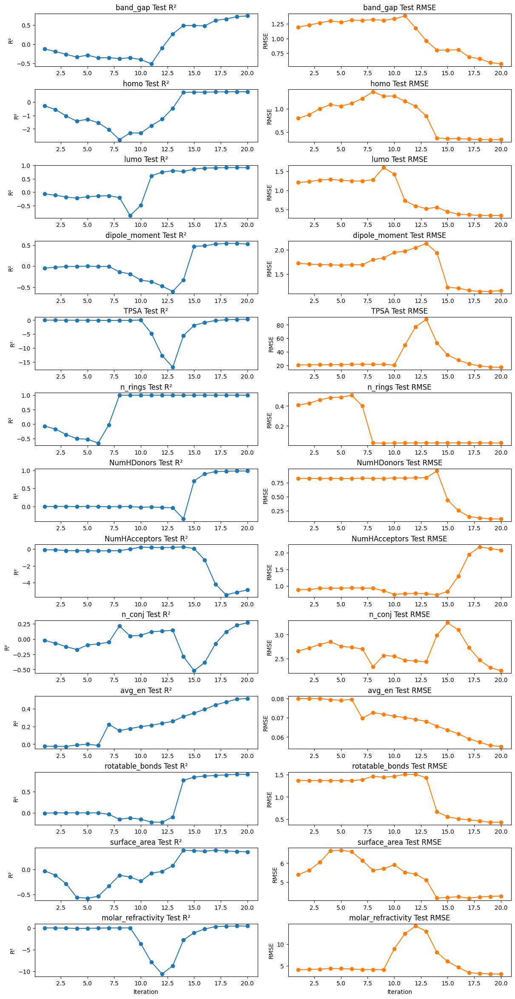

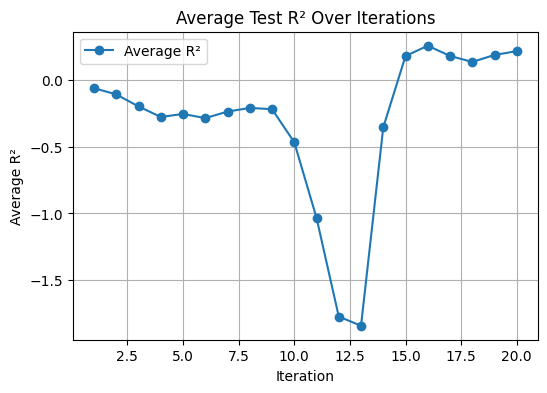

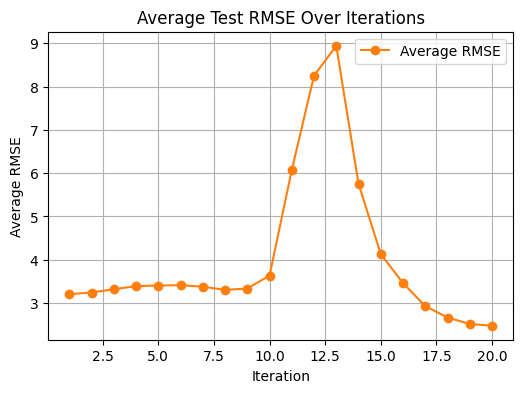

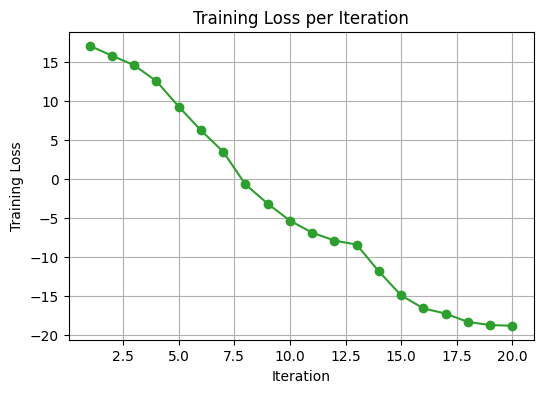

In [ ]:
# Colab Cell: Load metrics from checkpoint and plot per-iteration R² & RMSE

import torch
import numpy as np
import matplotlib.pyplot as plt

# 1) Load your checkpoint file (replace with your path)
checkpoint_path = '/content/checkpoint_iter_19.pt'
ckpt = torch.load(checkpoint_path, map_location='cpu', weights_only=False)

# 2) Extract test_history and train_loss_log
test_history    = ckpt['test_history']     # dict: task -> {'r2': [...], 'rmse': [...]}
train_loss_log  = ckpt['train_loss_log']   # list of training losses per iteration

# 3) Define your TASK_NAMES (must match your model)
TASK_NAMES = [
    "band_gap", "homo", "lumo", "dipole_moment", "TPSA",
    "n_rings", "NumHDonors", "NumHAcceptors", "n_conj",
    "avg_en", "rotatable_bonds", "surface_area", "molar_refractivity"
]

# 4) Plotting function
def plot_al_metrics_with_average(test_history, train_loss_log, task_names):
    iterations = np.arange(1, len(train_loss_log) + 1)

    # Per-task R2 & RMSE
    fig, axs = plt.subplots(len(task_names), 2, figsize=(12, len(task_names)*1.8), constrained_layout=True)
    for i, task in enumerate(task_names):
        axs[i,0].plot(iterations, test_history[task]['r2'], 'o-')
        axs[i,0].set_ylabel("R²")
        axs[i,0].set_title(f"{task} Test R²")
        axs[i,1].plot(iterations, test_history[task]['rmse'], 'o-', color='tab:orange')
        axs[i,1].set_ylabel("RMSE")
        axs[i,1].set_title(f"{task} Test RMSE")
        if i == len(task_names)-1:
            axs[i,0].set_xlabel("Iteration")
            axs[i,1].set_xlabel("Iteration")
    plt.show()

    # Average across tasks
    r2_mat   = np.vstack([test_history[t]['r2']   for t in task_names])
    rmse_mat = np.vstack([test_history[t]['rmse'] for t in task_names])
    avg_r2   = r2_mat.mean(axis=0)
    avg_rmse = rmse_mat.mean(axis=0)

    plt.figure(figsize=(6,4))
    plt.plot(iterations, avg_r2, 'o-', label='Average R²')
    plt.xlabel("Iteration"); plt.ylabel("Average R²")
    plt.title("Average Test R² Over Iterations")
    plt.grid(True); plt.legend(); plt.show()

    plt.figure(figsize=(6,4))
    plt.plot(iterations, avg_rmse, 'o-', color='tab:orange', label='Average RMSE')
    plt.xlabel("Iteration"); plt.ylabel("Average RMSE")
    plt.title("Average Test RMSE Over Iterations")
    plt.grid(True); plt.legend(); plt.show()

    # Training loss
    plt.figure(figsize=(6,4))
    plt.plot(iterations, train_loss_log, 'o-', color='tab:green')
    plt.xlabel("Iteration"); plt.ylabel("Training Loss")
    plt.title("Training Loss per Iteration")
    plt.grid(True); plt.show()

# 5) Call the plotting function
plot_al_metrics_with_average(test_history, train_loss_log, TASK_NAMES)
